# Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from astropy.io import ascii,fits
import pandas as pd
import math
import scipy.optimize as opt
from scipy.interpolate import make_interp_spline
# from scipy import ndimage

In [ ]:
from glob import glob
from matplotlib.colors import LogNorm
import csv

In [ ]:
import os
pwd = os.getcwd()
print(pwd)
os.chdir(pwd + '/../..')
pwd = os.getcwd()
print(pwd)

/Users/evanrootness/M31_GCs_Folder/M31_GCs/notebooks
/Users/evanrootness/M31_GCs_Folder


In [ ]:
# Data directories
datadir = pwd + '/data/aug23/'
# datadir = pwd + '/data/aug23-2/'
# datadir = pwd + '/data/aug23-3/'
octdir = pwd + '/data/oct23/'
# octdir = pwd + '/data/oct23-2/'
# octdir = pwd + '/data/oct23-3/'
# octdir = pwd + '/data/oct23-4/'
# octdir = pwd + '/data/oct23-5/'
BD28dir = pwd + '/data/BD+28_4211/'
specdir = pwd + '/data/Spectral Lines/'
wave_cali_dir = pwd + '/data/Wavelength Calibration/'

In [ ]:
# constants
c = 2.99792458 * 10 ** (8) # speed of light in m/s

h_beta = 4861.363
h_gamma = 4340.472
h_delta = 4101.734
h_epsilon = 3970.075
magnesium = 5183.604
O_II = 3911.957
He_II = 5411.2
He_II2 = 4685.7
He_II3 = 4540
S_II = 4070
O_III = 4363
O_I = 5577.3387

# Spectral lines not currently in use
# 10832   HeI
# 9532	[SIII]
# 9069	[SIII]
# 8438	P18
# 7751	[ArIII]
# 7323	[OII]
# 7135	[ArIII]
# 7065	HeI
# 7005	[ArV]
# 6678	HeI
# 6584	[NII]
# 6563	Halpha
# 6548 	[NII]
# 6300	[OI]
# 5876	HeI
# 5755	[NII]
# 5411	HeII
# 5007  	[OIII]
# 4959	[OIII]
# 4861 	Hbeta
# 4686	HeII
# 4540	HeII
# 4471	HeI
# 4341 	Hgamma
# 4363	[OIII]
# 4102	Hdelta
# 4070 	[SII]
# 4026	HeI
# 3968	[NeIII]+Hepsilon
# 3889	HeI
# 3869	[NeIII]
# 3835	H9
# 3805	HeI
# 3727	[OII]

## Models

In [ ]:
def const(x, b):
  return b
def linear_model(x, m, b):
  return m * x + b
def poly2_model(x, a, b, c):
  return a * x ** 2 + b * x + c
def poly3_model(x, a, b, c, d):
  return a * x ** 3 + b * x ** 2 + c * x + d
def poly4_model(x, a, b, c, d, e):
  return a * x ** 4 + b * x ** 3 + c * x ** 2 + d * x + e
def poly5_model(x, a, b, c, d, e, f):
  return a * x ** 5 + b * x ** 4 + c * x ** 3 + d * x ** 2 + e * x + f

In [ ]:
def gaussian_model(x, a, sigma, mean, b):
  return (a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2))) + b
def neg_gauss_model(x, a, sigma, mean, b):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b
def neg_gauss_mx_model(x, a, sigma, mean, b, c):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b * x + c
def neg_gauss_poly2_model(x, a, sigma, mean, b, c, d):
  return -((a * np.exp(- (x - mean) ** 2 / (2 * sigma ** 2)))) + b * x ** 2 + c * x + d

In [ ]:
def Lorentzian_const(x, A, sigma, center, c):
  return A * (sigma / ((x - center) ** 2 + sigma ** 2)) + c
def Lorentzian_lin(x, A, sigma, center, c, d):
  return -(A * (sigma / ((x - center) ** 2 + sigma ** 2))) + c * x + d
def Lorentzian_quad(x, A, sigma, center, b, c, d):
  return -(A * (sigma / ((x - center) ** 2 + sigma ** 2))) + b * x ** 2 + c * x + d

# Function Definitions

## Cosmic Zapping Functions

In [12]:
def cosmic_zap_median(input_dir, input_folder, file_number_list):
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + '2308' + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  return(median_data)
  # return(median_data.astype(np.float64))

In [13]:
def zap_median(input_dir, input_folder, file_number_list, yearmonth = 2308):

# reading in files
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))
  data_cube_before_overscan = np.dstack(data)

# bias correction
  data_2 = []
  for i in range(len(file_number_list)):

    input_array = data_cube_before_overscan[:, :, i]

    overscan_topleft = np.median(input_array[1:516,1:31])
    overscan_bottomleft = np.median(input_array[517:1013,1:31])
    overscan_topright = np.median(input_array[1:516,4097:4128])
    overscan_bottomright = np.median(input_array[517:1013,4097:4128])

    input_array_dup = np.copy(input_array)
    overscan_corrected = np.copy(input_array)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data_2.append(overscan_corrected)

  data_cube = np.dstack(data_2)

  median_data = np.median(data_cube, axis = 2)

  return(median_data)
  # return(median_data.astype(np.float64))

In [14]:
def zap_two(input_dir, input_folder, file_number_list, max_diff = 10):

# reading in files
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + '2308' + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))
  data_cube_before_overscan = np.dstack(data)

# bias correction
  data_2 = []
  for i in range(len(file_number_list)):

    input_array = data_cube_before_overscan[:, :, i]

    overscan_topleft = np.median(input_array[1:516,1:31])
    overscan_bottomleft = np.median(input_array[517:1013,1:31])
    overscan_topright = np.median(input_array[1:516,4097:4128])
    overscan_bottomright = np.median(input_array[517:1013,4097:4128])

    input_array_dup = np.copy(input_array)
    overscan_corrected = np.copy(input_array)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data_2.append(overscan_corrected)

  data_cube = np.dstack(data_2)

# cosmic ray zapping
  tuple = np.zeros((1016, 4128))
  for i in range(np.shape(data_cube)[0]):
    for j in range(np.shape(data_cube)[1]):
      # Now run through the length of l to see if any have large difference (max_diff)
      for k in range(np.shape(data_cube)[2]):
        if (abs(data_cube[i][j][k] - data_cube[i][j][0]) > max_diff):
          tuple[i][j] = np.min(data_cube[i][j])
        else:
          tuple[i][j] = np.mean(data_cube[i][j])

  return(tuple)

In [15]:
def zap_two_std(input_dir, input_folder, file_number_list, std = 5):

# reading in files
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + '2308' + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))
  data_cube_before_overscan = np.dstack(data)

# bias correction
  data_2 = []
  for i in range(len(file_number_list)):

    input_array = data_cube_before_overscan[:, :, i]

    overscan_topleft = np.median(input_array[1:516,1:31])
    overscan_bottomleft = np.median(input_array[517:1013,1:31])
    overscan_topright = np.median(input_array[1:516,4097:4128])
    overscan_bottomright = np.median(input_array[517:1013,4097:4128])

    input_array_dup = np.copy(input_array)
    overscan_corrected = np.copy(input_array)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data_2.append(overscan_corrected)

  data_cube = np.dstack(data_2)

# cosmic ray zapping
  tuple = np.zeros((1016, 4128))
  for i in range(np.shape(data_cube)[0]):
    for j in range(np.shape(data_cube)[1]):
      if (np.std(data_cube[i][j]) > std):
        tuple[i][j] = np.min(data_cube[i][j])
      else:
        tuple[i][j] = np.mean(data_cube[i][j])

  return(tuple)

In [16]:
def min_zapping(input_dir, input_folder, file_number_list, max_value_allowed = 200, max_diff = 10, yearmonth = 2308):

# reading in files
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))
  data_cube_before_overscan = np.dstack(data)

# bias correction
  data_2 = []
  for i in range(len(file_number_list)):

    input_array = data_cube_before_overscan[:, :, i]

    overscan_topleft = np.median(input_array[1:516,1:31])
    overscan_bottomleft = np.median(input_array[517:1013,1:31])
    overscan_topright = np.median(input_array[1:516,4097:4128])
    overscan_bottomright = np.median(input_array[517:1013,4097:4128])

    input_array_dup = np.copy(input_array)
    overscan_corrected = np.copy(input_array)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data_2.append(overscan_corrected)

  data_cube = np.dstack(data_2)

  min_data = np.min(data_cube, axis = 2)

  return(min_data)

## Spectrum Functions

### Lines

In [17]:
def lines(xmin = 0, xmax = 10000, labely = -0.2):
  lines = []
  lines.append([5889.95, "Na", 'g'])
  lines.append([5895.92, "Na", 'g'])
  # lines.append([5006.843, "O III", 'r'])
  lines.append([5183.604, "Magnesium", 'r'])
  lines.append([4861.363, "H-beta", 'b'])
  lines.append([He_II3, "He II3", 'c'])
  lines.append([4340.472, "H-gamma", 'b'])
  lines.append([4101.734, "H-delta", 'b'])
  lines.append([3970.075, "H-epsilon", 'b'])
  # lines.append([3911.957, "O II", 'r'])
  # lines.append([5448, "TiO", 'y'])
  lines.append([He_II, "He II", 'c'])
  lines.append([He_II2, "He II2", 'c'])

  for i in range(len(lines)):
    if (lines[i][0] < xmax and lines[i][0] > xmin):
      plt.axvline(lines[i][0], label = lines[i][1], color = lines[i][2], linewidth = 0.6)
      plt.text(lines[i][0], labely, lines[i][1], rotation=90, fontsize = 10)
  # plt.legend()
  return

In [18]:
h_beta = 4861.363
h_gamma = 4340.472
h_delta = 4101.734
h_epsilon = 3970.075
magnesium = 5183.604
O_II = 3911.957
He_II = 5411.2
He_II2 = 4685.7
He_II3 = 4540
S_II = 4070
O_III = 4363
O_I = 5577.3387

# 10832   HeI
# 9532	[SIII]
# 9069	[SIII]
# 8438	P18
# 7751	[ArIII]
# 7323	[OII]
# 7135	[ArIII]
# 7065	HeI
# 7005	[ArV]
# 6678	HeI
# 6584	[NII]
# 6563	Halpha
# 6548 	[NII]
# 6300	[OI]
# 5876	HeI
# 5755	[NII]
# 5411	HeII
# 5007  	[OIII]
# 4959	[OIII]
# 4861 	Hbeta
# 4686	HeII
# 4540	HeII
# 4471	HeI
# 4341 	Hgamma
# 4363	[OIII]
# 4102	Hdelta
# 4070 	[SII]
# 4026	HeI
# 3968	[NeIII]+Hepsilon
# 3889	HeI
# 3869	[NeIII]
# 3835	H9
# 3805	HeI
# 3727	[OII]

In [19]:
def cal_spec_plot(zap, flat, min = 607, max = 611, norm_min = 600, norm_max = 2000, title = '', color = 'b', linewidth = 0.4):
  # spectrum = grab_spectrum(zap, 607, 611)
  a = zap / (flat)
  spectrum_ff = grab_spectrum(a, min, max)
  x = calibrate_wavelength(spectrum_ff, 1.69, 5015)
  plt.figure(figsize = (14, 4))
  plt.plot(x, spectrum_ff / spectrum_ff[norm_min: norm_max].max(), color = color, linewidth = linewidth)
  l = len(x)
  plt.xlim(x[0], x[0] + 3/4 * l)
  plt.ylim(0, 1.2)
  plt.title(title)
  lines()

In [20]:
def plot_pix(spectrum, xmin = 0, xmax = 4000, ymin = -0.1, ymax = 1.1, figwidth = 12, figheight = 3):
  plt.figure(figsize = (figwidth, figheight))
  plt.plot(spectrum, linewidth = 0.5, color = 'k')
  plt.ylim(ymin, ymax)
  plt.xlim(xmin, xmax)
  plt.xticks(np.arange(xmin, xmax, 250))
  plt.grid()

### Fitting

In [21]:
def fit_voigt_quad(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  y = spectrum[a: b]
  xx = x[a: b]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))

  model = QuadraticModel() - LorentzianModel()
  params = model.make_params(amplitude = 10 * (max(spectrum[a: b]) - min(spectrum[a: b])), center = mean, sigma = sigma, a = 0, slope = 0, c = 1)
  result = model.fit(y, params, x = xx)
  # xxx = np.linspace(a, b, 100)

  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(xx, result.best_fit, 'b')
    # plt.plot(xxx, result.eval(x = xxx), 'r-')
    plt.plot()
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  # print(result.fit_report())
  velo = calc_velo(result.values['center'], line)
  velo_err = calc_velo_err_lmfit(result.params['center'].stderr, line)
  return velo, velo_err

In [22]:
def fit_voigt_lin(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  y = spectrum[a: b]
  xx = x[a: b]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))

  model = LinearModel() - LorentzianModel()
  params = model.make_params(amplitude = 10 * (max(spectrum[a: b]) - min(spectrum[a: b])), center = mean, sigma = sigma, slope = 0, intercept = 0)
  result = model.fit(y, params, x = xx)
  # xxx = np.linspace(a, b, 100)

  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(xx, result.best_fit, 'b')
    # plt.plot(xxx, result.eval(x = xxx), 'r-')
    plt.plot()
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  # print(result.fit_report())
  velo = calc_velo(result.values['center'], line)
  velo_err = calc_velo_err_lmfit(result.params['center'].stderr, line)
  return velo, velo_err

In [23]:
def fit_lorentzian_quad(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_quad, x[a: b], spectrum[a: b], p0 = [10 * (spectrum[a: b].max() - spectrum[a: b].max()), sigma, mean, 0, 1, 0])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_quad(x, popt[0], popt[1], popt[2], popt[3], popt[4], popt[5]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  velo = calc_velo(popt[2], line)
  velo_err = calc_velo_err(covar, line)
  return velo, velo_err


def fit_lorentzian_quad_blackhawk(spectrum, x, left, right, params, params_shift_night, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):

  # input range to xg is in pixels
  input_range_to_xg = np.linspace(left, right, right - left + 1)
  # calibrate that range in pixels to the other night
  pixel_range_new = calibrate_wavelength_4th_order_range(input_range_to_xg, params_shift_night[0],
                                                              params_shift_night[1], params_shift_night[2],
                                                              params_shift_night[3], params_shift_night[4])

  # calibrate the new range in the arc night's pixels, to a new range of wavelengths (to arc night)
  wavelength_new = calibrate_wavelength_4th_order_range(pixel_range_new, params[0],
                                                          params[1], params[2],
                                                          params[3], params[4])

  # find the start and end indices of the range you want to fit, in terms of the new x ()
  a = np.where(x == wavelength_new[0])[0][0]
  b = np.where(x == wavelength_new[-1])[0][0]

  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_quad, x[a: b], spectrum[a: b], p0 = [10 * (spectrum[a: b].max() - spectrum[a: b].max()), sigma, mean, 0, 1, 0])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_quad(x, popt[0], popt[1], popt[2], popt[3], popt[4], popt[5]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  velo = calc_velo(popt[2], line)
  velo_err = calc_velo_err(covar, line)
  return velo, velo_err

In [24]:
def fit_lorentzian_lin(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_lin, x[a: b], spectrum[a: b], p0 = [spectrum[a: b].max(), sigma, mean, 0, 1]) #7, 4850, 10, 0.00005, 0.7))
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_lin(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  velo = calc_velo(popt[2], line)
  velo_err = calc_velo_err(covar, line)
  return velo, velo_err


def fit_lorentzian_lin_blackhawk(spectrum, x, left, right, params, params_shift_night, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):

  # input range to xg is in pixels
  input_range_to_xg = np.linspace(left, right, right - left + 1)
  # calibrate that range in pixels to the other night
  pixel_range_new = calibrate_wavelength_4th_order_range(input_range_to_xg, params_shift_night[0],
                                                              params_shift_night[1], params_shift_night[2],
                                                              params_shift_night[3], params_shift_night[4])

  # calibrate the new range in the arc night's pixels, to a new range of wavelengths (to arc night)
  wavelength_new = calibrate_wavelength_4th_order_range(pixel_range_new, params[0],
                                                          params[1], params[2],
                                                          params[3], params[4])

  # find the start and end indices of the range you want to fit, in terms of the new x ()
  a = np.where(x == wavelength_new[0])[0][0]
  b = np.where(x == wavelength_new[-1])[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_lin, x[a: b], spectrum[a: b], p0 = [spectrum[a: b].max(), sigma, mean, 0, 1]) #7, 4850, 10, 0.00005, 0.7))
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_lin(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  velo = calc_velo(popt[2], line)
  velo_err = calc_velo_err(covar, line)
  return velo, velo_err

In [25]:
def fit_lorentzian_const(spectrum, x, left, right, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  # xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  x = np.array(x)
  a = np.where(x == left)[0][0]
  b = np.where(x == right)[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_const, x[a: b], spectrum[a: b], p0 = [max(spectrum[a: b]), sigma, mean, 0])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_const(x, popt[0], popt[1], popt[2], popt[3]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  velo = calc_velo(popt[2], line)
  velo_err = calc_velo_err(covar, line)
  return velo, velo_err

In [26]:
def fit_lorentzian_lin_wave(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_lin, x[a: b], spectrum[a: b], p0 = [spectrum[a: b].max(), sigma, mean, 0, 1]) #7, 4850, 10, 0.00005, 0.7))
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_lin(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  return popt[2]

In [27]:
def fit_lorentzian_quad_wave(spectrum, x, left, right, params, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), params[0], params[1], params[2], params[3], params[4])
  a = np.where(x == xg[0])[0][0]
  b = np.where(x == xg[-1])[0][0]
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_quad, x[a: b], spectrum[a: b], p0 = [10 * (spectrum[a: b].max() - spectrum[a: b].max()), sigma, mean, 0, 1, 0])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_quad(x, popt[0], popt[1], popt[2], popt[3], popt[4], popt[5]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  return popt[2]

In [28]:
def fit_lorentzian_quad_pixel(spectrum, left, right, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  x = np.arange(0, len(spectrum))
  a = left
  b = right
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_quad, x[a: b], spectrum[a: b], p0 = [10 * (spectrum[a: b].max() - spectrum[a: b].max()), sigma, mean, 0, 1, 0])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_quad(x, popt[0], popt[1], popt[2], popt[3], popt[4], popt[5]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  return popt[2]

In [29]:
def fit_lorentzian_lin_pixel(spectrum, left, right, line, plot = True, xmin = 3500, xmax = 6000, ymin = -0.1, ymax = 1.1, figwidth = 10, figheight = 3):
  a = left
  b = right
  x = np.arange(0, len(spectrum))
  mean = sum(x[a: b] * spectrum[a: b]) / sum(spectrum[a: b])
  sigma = np.sqrt(sum(spectrum[a: b] * (x[a: b] - mean) ** 2) / sum(spectrum[a: b]))
  popt, covar = opt.curve_fit(Lorentzian_lin, x[a: b], spectrum[a: b], p0 = [spectrum[a: b].max(), sigma, mean, 0, 1])
  if (plot == True):
    plt.figure(figsize = (figwidth, figheight))
    plt.plot(x, spectrum, color = 'k', linewidth = 0.6, alpha = 0.5)
    plt.plot(x, Lorentzian_lin(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = 'b')
    plt.ylim(ymin, ymax)
    lines(xmin, xmax)
    plt.xlim(xmin, xmax)
  return popt[2]

### Get Spectra Functions

In [30]:
def file_to_spectrum(input_dir, input_folder, file_number_list, yearmonth = 2308):
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  input_array = median_data

  overscan_topleft = np.median(input_array[1:516,1:31])
  overscan_bottomleft = np.median(input_array[517:1013,1:31])
  overscan_topright = np.median(input_array[1:516,4097:4128])
  overscan_bottomright = np.median(input_array[517:1013,4097:4128])

  input_array_dup = np.copy(input_array)
  overscan_corrected = np.copy(input_array)

  overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
  overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
  overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
  overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

  spectrum = np.median(overscan_corrected[:, 35:], axis = 0)

  return(spectrum)

In [31]:
def grab_spectrum(input, top_row, bottom_row):
  spectrum = np.mean(input[top_row: bottom_row, :], axis = 0)
  return(spectrum)

### Calibration Functions

In [32]:
def calibrate_wavelength(input, alpha, delta):
  x = np.arange(len(input))
  lambda_ang = alpha * x + delta
  return(lambda_ang)

def calibrate_wavelength_2nd_order(input, alpha, beta, delta):
  x = np.arange(len(input))
  lambda_ang = alpha * x ** 2 + beta * x + delta
  return(lambda_ang)

def calibrate_wavelength_3rd_order(input, a, b, c, d):
  x = np.arange(len(input))
  lambda_ang = a * x ** 3 + b * x ** 2 + c * x + d
  return(lambda_ang)

def calibrate_wavelength_4th_order(input, a, b, c, d, e):
  x = np.arange(len(input))
  lambda_ang = a * x ** 4 + b * x ** 3 + c * x ** 2 + d * x + e
  return(lambda_ang)

def cal_wave_4auto(input, params):
  x = np.arange(len(input))
  lambda_ang = params[0] * x ** 4 + params[1] * x ** 3 + params[2] * x ** 2 + params[3] * x + params[4]
  return(lambda_ang)

def calibrate_wavelength_4th_order_range(input, a, b, c, d, e):
  x = input
  lambda_ang = a * x ** 4 + b * x ** 3 + c * x ** 2 + d * x + e
  return(lambda_ang)

def cal_wave_4auto_range(input, params):
  x = input
  lambda_ang = params[0] * x ** 4 + params[1] * x ** 3 + params[2] * x ** 2 + params[3] * x + params[4]
  return(lambda_ang)

def calibrate_wavelength_5th_order(input, a, b, c, d, e, f):
  x = np.arange(len(input))
  lambda_ang = a * x ** 5 + b * x ** 4 + c * x ** 3 + d * x ** 2 + e * x + f
  return(lambda_ang)

def calibrate_wavelength_5th_order_range(input, a, b, c, d, e, f):
  x = input
  lambda_ang = a * x ** 5 + b * x ** 4 + c * x ** 3 + d * x ** 2 + e * x + f
  return(lambda_ang)

In [33]:
def find_lorentzian_maxes_old(data, range = 10):
  l = len(data)
  # array that will contain rough estimates of maxes
  array1 = np.array([])
  i = 1000
  while (i < (l - 20) and i < 4040):
    median = np.median(data[i-20:i+20])
    m8 = data[i - 8]
    m3 = data[i - 3]
    m2 = data[i - 2]
    m1 = data[i - 1]
    temp = data[i]
    p1 = data[i + 1]
    p2 = data[i + 2]
    p3 = data[i + 3]
    if (temp > m1 and temp > p1 and temp >= m2 and temp >= p2 and temp >= m3 and temp >= p3 and temp >= m8 and temp > 1.3 * median):
      array1 = np.append(array1, i)
    i += 1
  array1 = array1.astype(int)

  l_maxes = np.array([])
  param_array = np.empty([0, 4])
  covar_array = np.empty([0, 4])
  for wv in array1:
    if (wv != 3922):
      a = int(wv - range / 2)
      b = int(wv + range / 2)
      xlin = np.arange(a, b, 1)
      mean = sum(xlin * data[a: b]) / sum(data[a: b])
      sigma = np.sqrt(sum(data[a: b] * (xlin - mean) ** 2) / sum(data[a: b]))
      max = np.max(data[a: b])
      mean_out = np.mean([data[a-10: a], data[b: b+10]])
      far_mean = np.mean(data[wv - 100: wv +100])
      popt, covar = opt.curve_fit(Lorentzian_const, xlin, data[a: b], p0 = [mean * 5, sigma / 1, wv, 0])
      param_array = np.append(param_array, [popt], axis = 0)
      temp1 = np.sqrt(covar[0][0])
      temp2 = np.sqrt(covar[1][1])
      temp3 = np.sqrt(covar[2][2])
      temp4 = np.sqrt(covar[3][3])
      covar_array = np.append(covar_array, np.array([np.array([temp1, temp2, temp3, temp4])]), axis = 0)
      l_maxes = np.append(l_maxes, popt[2])
  return l_maxes, param_array, covar_array

In [34]:
def find_lorentzian_maxes(data, range = 10):
  l = len(data)
  # array that will contain rough estimates of maxes
  array1 = np.array([])
  i = 1000
  while (i < (l - 20)):# and i < 4040):
    median = np.median(data[i-20:i+20])
    m8 = data[i - 8]
    m3 = data[i - 3]
    m2 = data[i - 2]
    m1 = data[i - 1]
    temp = data[i]
    p1 = data[i + 1]
    p2 = data[i + 2]
    p3 = data[i + 3]
    if (temp > m1 and temp > p1 and temp >= m2 and temp >= p2 and temp >= m3 and temp >= p3 and temp >= m8 and temp > 1.1 * median):
      array1 = np.append(array1, i)
    i += 1
  array1 = array1.astype(int)

  l_maxes = np.array([])
  param_array = np.empty([0, 4])
  covar_array = np.empty([0, 4])
  fit_array = np.empty([0, 1])
  for wv in array1:
    a = int(wv - range / 2)
    b = int(wv + range / 2)
    xlin = np.arange(a, b, 1)
    mean = sum(xlin * data[a: b]) / sum(data[a: b])
    sigma = np.sqrt(sum(data[a: b] * (xlin - mean) ** 2) / sum(data[a: b]))
    max = np.max(data[a: b])
    mean_out = np.mean([data[a-10: a], data[b: b+10]])
    far_mean = np.mean(data[wv - 100: wv +100])
    # print(wv)
    if (max > 2 * far_mean):
      popt, covar = opt.curve_fit(Lorentzian_const, xlin, data[a: b], p0 = [mean * 2, sigma / 1, wv, 0])
      param_array = np.append(param_array, [popt], axis = 0)
      temp1 = np.sqrt(covar[0][0])
      temp2 = np.sqrt(covar[1][1])
      temp3 = np.sqrt(covar[2][2])
      temp4 = np.sqrt(covar[3][3])
      covar_array = np.append(covar_array, np.array([np.array([temp1, temp2, temp3, temp4])]), axis = 0)
      l_maxes = np.append(l_maxes, popt[2])
      fit_array = np.append(fit_array, 'Lorentzian')
    else:
      popt, covar = opt.curve_fit(gaussian_model, xlin, data[a: b], p0 = [mean * 2, sigma / 10, wv, 0])
      param_array = np.append(param_array, [popt], axis = 0)
      temp1 = np.sqrt(covar[0][0])
      temp2 = np.sqrt(covar[1][1])
      temp3 = np.sqrt(covar[2][2])
      temp4 = np.sqrt(covar[3][3])
      covar_array = np.append(covar_array, np.array([np.array([temp1, temp2, temp3, temp4])]), axis = 0)
      l_maxes = np.append(l_maxes, popt[2])
      fit_array = np.append(fit_array, 'Gaussian')
  return l_maxes, param_array, covar_array, fit_array

In [35]:
def plot_maxes(spectrum, maxes, minx = 1000, figwidth = 16 * 4, figheight = 3):
  plt.figure(figsize = (figwidth, figheight))
  x = np.arange(len(spectrum))
  plt.plot(x, spectrum, color = 'orange', linewidth = 1.9)
  for i in range(len(maxes)):
    if (maxes[i] > minx):
      plt.axvline(maxes[i], linewidth = 0.3)
      plt.text(maxes[i], 3000, i, rotation = 0, fontsize = 10)
  plt.xlim(left = minx)

In [36]:
def plot_maxes_lorntz(spectrum, maxes, params, minx = 1000, figwidth = 16 * 4, figheight = 3, ymin = 0, ymax = 1):
  plt.figure(figsize = (figwidth, figheight))
  x = np.arange(len(spectrum))
  plt.plot(x, spectrum, color = 'k', linewidth = 1.5, alpha = 0.3)
  for i in range(len(maxes)):
    if (maxes[i] > minx):
      # plt.axvline(maxes[i], linewidth = 0.3)
      # plt.text(maxes[i], 3000, maxes[i], rotation=90, fontsize = 10)
      xtemp = np.arange(maxes[i] - 8, maxes[i] + 8)
      plt.plot(xtemp, Lorentzian_const(xtemp, params[i][0], params[i][1], params[i][2], params[i][3]), color = 'b', alpha = 0.5)
      plt.text(params[i][2], 2000, i, rotation = 0, fontsize = 13)
      # plt.axvline(params[i][2])
  plt.xlim(left = minx)
  plt.ylim(ymin, ymax)

In [37]:
def plot_maxes_lorntz_gauss(spectrum, maxes, params, fit_array, minx = 1000, figwidth = 16 * 4, figheight = 3, ymin = 0, ymax = 1):
  plt.figure(figsize = (figwidth, figheight))
  x = np.arange(len(spectrum))
  plt.plot(x, spectrum, color = 'k', linewidth = 1.5, alpha = 0.3)
  for i in range(len(maxes)):
    if (maxes[i] > minx):
      if (fit_array[i] == 'Lorentzian'):
        # plt.axvline(maxes[i], linewidth = 0.3)
        # plt.text(maxes[i], 3000, maxes[i], rotation=90, fontsize = 10)
        xtemp = np.arange(maxes[i] - 8, maxes[i] + 8)
        plt.plot(xtemp, Lorentzian_const(xtemp, params[i][0], params[i][1], params[i][2], params[i][3]), color = 'b', alpha = 0.5)
        plt.text(params[i][2], 2000, i, rotation = 0, fontsize = 13)
        # plt.axvline(params[i][2])
      else:
        # plt.axvline(maxes[i], linewidth = 0.3)
        # plt.text(maxes[i], 3000, maxes[i], rotation=90, fontsize = 10)
        xtemp = np.arange(maxes[i] - 8, maxes[i] + 8)
        plt.plot(xtemp, gaussian_model(xtemp, params[i][0], params[i][1], params[i][2], params[i][3]), color = 'b', alpha = 0.5)
        plt.text(params[i][2], 2000, i, rotation = 0, fontsize = 13)
        # plt.axvline(params[i][2])
  plt.xlim(left = minx)
  plt.ylim(ymin, ymax)

In [38]:
def plot_mins(spectrum, x, mins, minx = 1, maxx = 10000, figwidth = 15, figheight = 3):
  plt.figure(figsize = (figwidth, figheight))
  plt.plot(x, spectrum, color = 'k', linewidth = 1)
  for i in range(len(mins)):
    if (x[mins][i] > minx and x[mins][i] < maxx):
      # plt.axvline(mins[i], linewidth = 0.3)
      # plt.text(mins[i], 3000, mins[i], rotation=90, fontsize = 10) #
      plt.axvline(x[mins][i], linewidth = 0.3)
      plt.text(x[mins][i], 0.3, x[mins][i], rotation=90, fontsize = 10)
  if (minx != 1):
    plt.xlim(left = minx)
  if (maxx != 10000):
    plt.xlim(right = maxx)

In [39]:
def plot_lines(lines, col, line_height = 10, max_intensity = 0, figwidth = 16 * 5, figheight = 2, xmin = 0, xmax = 6000):
  max = np.max(lines[:, 2])
  plt.figure(figsize = (figwidth, figheight))
  for i in range(len(lines)):
    if (int(lines[i, 2]) > max_intensity and lines[i, 0] < xmax and lines[i, 0] > xmin):# and lines[i, 0] < 5000 and Ar_lines[i, 0] > 4650):
      plt.axvline(lines[i, 0], ymax = line_height * (lines[i, 2] / max), color = col, linewidth = 0.5, alpha = 1)
      plt.text(lines[i, 0], 0.6, i, rotation = 0, fontsize = 10)
  plt.xlim(xmin, xmax)

In [40]:
def make_pixels_array(maxes, list):
  array = np.empty([0, 1])
  for i in range(len(list)):
    array = np.append(array, maxes[0][list[i]])
  return array

def make_pixels_err_array(maxes, list):
  array = np.empty([0, 1])
  for i in range(len(list)):
    array = np.append(array, maxes[2][list[i]][2])
  return array

def make_wavelength_array(list):
  array = np.empty([0, 1])
  for i in range(len(list)):
    if (list[i][0] == 1):
      array = np.append(array, Ar_lines[list[i][1]][0])
    else:
      array = np.append(array, Xe_lines[list[i][1]][0])
  return array

In [41]:
def calc_velo_err(covar, wave_0):
  return c * (np.sqrt(covar[2, 2]) * 10 ** (-10)) / (wave_0 * 10 ** (-10)) / 1000

def calc_velo_err_lmfit(stderr, wave_0):
  return c * (stderr * 10 ** (-10)) / (wave_0 * 10 ** (-10)) / 1000

def calc_velo(wave, wave_0):
  return c * (wave * 10 ** (-10) - wave_0 * 10 ** (-10)) / (wave_0 * 10 ** (-10)) / 1000

## Plotting Functions

In [42]:
def basic_plot(input_array, min = 75, max = 120, title = ''):
  plt.figure(figsize = (12 * 1.4, 3 * 1.4))
  plt.imshow(input_array, aspect = 'auto', vmin=min, vmax=max)#, norm = LogNorm(vmin = 1, vmax = 1000000))
  plt.title(title)
  plt.colorbar()
  plt.show()

In [43]:
def plot_limits_size(input_array, min = 75, max = 120,
                     xleft = 0, xright = 4128, ybottom = 1016, ytop = 0,
                     figsizewidth = 12 * 1.4, figsizeheight = 3 * 1.4, title = '',
                     marker = False, markerx = 0, markery = 0, markeralpha = 1, markersize = 10, markercolor = 'r'):
  plt.figure(figsize = (figsizewidth, figsizeheight))
  if (marker == True):
    plt.plot(markerx, markery, marker = 'o', alpha = markeralpha, markersize = markersize, color = markercolor, markeredgecolor = 'w')
  plt.imshow(input_array, aspect = 'auto', vmin=min, vmax=max)#, norm = LogNorm(vmin = 1, vmax = 1000000))
  plt.title(title)
  plt.xlim(xleft, xright)
  plt.ylim(ybottom, ytop)
  plt.colorbar()
  plt.show()

In [44]:
def plot_limits_size_line(input_array, min = 75, max = 120, xleft = 0, xright = 4128, ybottom = 1016, ytop = 0,
                     figsizewidth = 12 * 1.4, figsizeheight = 3 * 1.4, title = '', marker = False, markerx = 0, markery = 0, markeralpha = 1, markersize = 10, markercolor = 'r',
                     slope1 = 0, b1 = 0, slope2 = 0, b2 = 0):
  plt.figure(figsize = (figsizewidth, figsizeheight))
  if (marker == True):
    plt.plot(markerx, markery, marker = 'o', alpha = markeralpha, markersize = markersize, color = markercolor, markeredgecolor = 'w')
  plt.imshow(input_array, aspect = 'auto', vmin=min, vmax=max)#, norm = LogNorm(vmin = 1, vmax = 1000000))
  plt.title(title)
  plt.xlim(xleft, xright)
  plt.ylim(ybottom, ytop)
  plt.colorbar()
  x = np.arange(0, 4128)
  y1 = slope1 * x + b1
  y2 = slope2 * x + b2
  plt.plot(x, y1, color = 'w')
  plt.plot(x, y2, color = 'w')
  plt.show()

## Fits/overscan/median/normalize

In [45]:
def fits_overscan_median(input_dir, input_folder, file_number_list, yearmonth = 2308):
  data = []
  for i in file_number_list:

    temp = fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64)

    overscan_topleft = np.median(temp[1:516,1:31])
    overscan_bottomleft = np.median(temp[517:1013,1:31])
    overscan_topright = np.median(temp[1:516,4097:4128])
    overscan_bottomright = np.median(temp[517:1013,4097:4128])

    input_array_dup = np.copy(temp)
    overscan_corrected = np.copy(temp)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data.append(overscan_corrected)

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  return(median_data)

In [46]:
def fits_overscan(input_dir, input_folder, file_number_list, yearmonth = 2308):
  data = []
  for i in file_number_list:

    temp = fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64)

    overscan_topleft = np.median(temp[1:516,1:31])
    overscan_bottomleft = np.median(temp[517:1013,1:31])
    overscan_topright = np.median(temp[1:516,4097:4128])
    overscan_bottomright = np.median(temp[517:1013,4097:4128])

    input_array_dup = np.copy(temp)
    overscan_corrected = np.copy(temp)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data.append(overscan_corrected)

  data_cube = np.dstack(data)
  # median_data = np.median(data_cube, axis = 2)

  return(data_cube)

In [47]:
def fit_to_array(input_dir, input_folder, file_number, yearmonth = 2308):
  data = fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + file_number + '.fits', ext = 0).astype(np.float64)
  return(data)
  # return(data.astype(np.float64))

In [48]:
def median_fits(input_dir, input_folder, file_number_list, yearmonth = 2308):
  data = []
  for i in file_number_list:
    data.append(fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64))

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  return(median_data)
  # return(median_data.astype(np.float64))

In [49]:
def fits_overscan_normalize_median(input_dir, input_folder, file_number_list, yearmonth = 2308):
  data = []
  for i in file_number_list:

    temp = fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64)

    overscan_topleft = np.median(temp[1:516,1:31])
    overscan_bottomleft = np.median(temp[517:1013,1:31])
    overscan_topright = np.median(temp[1:516,4097:4128])
    overscan_bottomright = np.median(temp[517:1013,4097:4128])

    input_array_dup = np.copy(temp)
    overscan_corrected = np.copy(temp)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data.append(overscan_corrected / np.median(overscan_corrected[:, 33: 4096]))

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  return(median_data)

In [50]:
def fits_overscan_rangenormalize_median(input_dir, input_folder, file_number_list, min = 0, max = 1, yearmonth = 2308):
  data = []
  for i in file_number_list:

    temp = fits.getdata(input_dir + str(yearmonth) + str(input_folder) + '/' + i + '.fits', ext = 0).astype(np.float64)

    overscan_topleft = np.median(temp[1:516,1:31])
    overscan_bottomleft = np.median(temp[517:1013,1:31])
    overscan_topright = np.median(temp[1:516,4097:4128])
    overscan_bottomright = np.median(temp[517:1013,4097:4128])

    input_array_dup = np.copy(temp)
    overscan_corrected = np.copy(temp)

    overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
    overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
    overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
    overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

    data.append(overscan_corrected / np.median(overscan_corrected[:, 33: 4096]))

  data_cube = np.dstack(data)
  median_data = np.median(data_cube, axis = 2)

  return(median_data)

In [51]:
def subtract_overscan(input_array):

  overscan_topleft = np.median(input_array[1:516,1:31])
  overscan_bottomleft = np.median(input_array[517:1013,1:31])
  overscan_topright = np.median(input_array[1:516,4097:4128])
  overscan_bottomright = np.median(input_array[517:1013,4097:4128])

  input_array_dup = np.copy(input_array)
  overscan_corrected = np.copy(input_array)

  overscan_corrected[:508, :2064] = input_array_dup[:508, :2064] - overscan_topleft
  overscan_corrected[508:, :2064] = input_array_dup[508:, :2064] - overscan_bottomleft
  overscan_corrected[:508, 2064:] = input_array_dup[:508, 2064:] - overscan_topright
  overscan_corrected[508:, 2064:] = input_array_dup[508:, 2064:] - overscan_bottomright

  return(overscan_corrected)

# Wavelength Calibration

## Import lines/Prep Arc Spectra

In [52]:
Ar_lines = pd.read_csv(specdir + 'OSMOS_Ar_Lines.csv', header=0).to_numpy()
Xe_lines = pd.read_csv(specdir + 'OSMOS_Xe_Lines.csv', header=0).to_numpy()
HgNe_lines = pd.read_csv(specdir + 'OSMOS_HgNe_Lines.csv', header=0).to_numpy()

In [53]:
ArXe23_spectrum = np.flip(file_to_spectrum(datadir, 23, ['b.0015', 'b.0016', 'b.0017']), 0)
# No HgNe spectrum on Aug 23

ArXe26_spectrum = np.flip(file_to_spectrum(datadir, 26, ['b.0187', 'b.0188', 'b.0189', 'b.0190', 'b.0191', 'b.0192']), 0)
# HgNe26_spectrum = np.flip(file_to_spectrum(datadir, 26, ['b.0193', 'b.0194', 'b.0195', 'b.0196', 'b.0197', 'b.0198']), 0)

ArXe27_spectrum = np.flip(file_to_spectrum(datadir, 27, ['b.0248', 'b.0249', 'b.0250', 'b.0232', 'b.0233', 'b.0234']), 0)
# HgNe26_spectrum = np.flip(file_to_spectrum(datadir, 26, ['b.0193', 'b.0194', 'b.0195', 'b.0196', 'b.0197', 'b.0198']), 0)

ArXe03_spectrum = np.flip(file_to_spectrum(octdir, '03', ['b.0275', 'b.0276'], yearmonth = 2310), 0)
# HgNe03_spectrum = np.flip(file_to_spectrum(octdir, '03', ['b.0277', 'b.0278', 'b.0279'], yearmonth = 2310), 0)

ArXe06_spectrum = np.flip(file_to_spectrum(octdir, '06', ['b.0514', 'b.0515', 'b.0516'], yearmonth = 2310), 0)
# HgNe06_spectrum = np.flip(file_to_spectrum(octdir, '06', ['b.0517', 'b.0518', 'b.0519'], yearmonth = 2310), 0)

maxes_ax23_lorentz_and_gauss = find_lorentzian_maxes(ArXe23_spectrum)
maxes_ax23 = find_lorentzian_maxes_old(ArXe23_spectrum)
maxes_ax26 = find_lorentzian_maxes_old(ArXe26_spectrum)
maxes_ax27 = find_lorentzian_maxes_old(ArXe27_spectrum)
maxes_ax03 = find_lorentzian_maxes_old(ArXe03_spectrum)
maxes_ax06 = find_lorentzian_maxes_old(ArXe06_spectrum)

## All Nights Calibration

### Aug 23rd Calibration

#### Calculating Params/Residuals

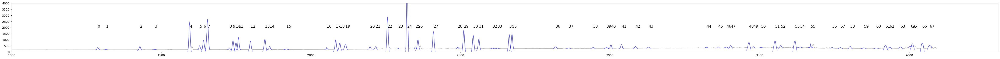

In [54]:
plot_maxes_lorntz_gauss(ArXe23_spectrum, maxes_ax23_lorentz_and_gauss[0], maxes_ax23_lorentz_and_gauss[1], maxes_ax23_lorentz_and_gauss[3], ymax = 4000, figwidth = 60)
# plot_maxes_lorntz(ArXe03_spectrum, maxes_ax03_lor[0], maxes_ax03_lor[1], ymax = 4000, figwidth = 60)

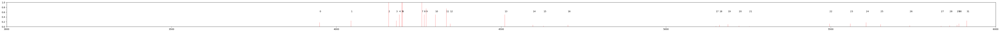

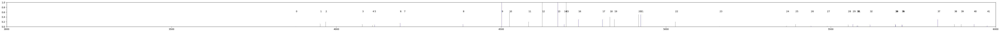

In [55]:
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 50)
plot_lines(Xe_lines, 'b', xmin = 3000)

In [56]:
# green line: 3576.0579981536525, O_I, 0.12059833743843225
pixels23ax_wgauss = make_pixels_array(maxes_ax23_lorentz_and_gauss, [0, 1, 2, 3, 4, 5, 9, 10, 11, 12, #13,
                                                       14, #15,
                                                       17, 18, 20, 21, 22, 24,
                                                25, 26, 27, 29, 30, 31, 34, 35, 36, 39, 41, 42, 43,
                                                44, 48, 51, 53, 54, 57, 58, 61, 62, 63, 65, 66])
pixels23ax_err_wgauss = make_pixels_err_array(maxes_ax23_lorentz_and_gauss, [0, 1, 2, 3, 4, 5, 9, 10, 11, 12, #13,
                                                               14, #15,
                                                               17, 18, 20, 21, 22,
                                                24, 25, 26, 27, 29, 30, 31, 34, 35, 36, 39, 41, 42, 43, 44, 48, 51, 53, 54, 57, 58, 61, 62, 63, 65, 66])

wavelengths23ax_wgauss = make_wavelength_array([[1, 0], [2, 2], [1, 1], [2, 3], [1, 2], [1, 3],
                                         [1, 7], [1, 8], [1, 9], [1, 10], #[1, 11],
                                          [1, 12],
                                         #[2, 8],
                                                [2, 9], [1, 13], [2, 11], [1, 14], [2, 12], [2, 13],
                                         [2, 14], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21],
                                         [2, 22], [1, 17], [1, 19], [1, 20], [1, 21],
                                         [2, 25], [1, 22], [1, 23], [1, 24], [2, 32], [2, 36], [1, 26], [2, 37],
                                         [1, 27], [1, 28], [1, 30], [1, 31]
                                         ])

poly4_params_aug23, poly4_covar_aug23 = opt.curve_fit(poly4_model, pixels23ax_wgauss, wavelengths23ax_wgauss, sigma = pixels23ax_err_wgauss)

residuals_withgauss = wavelengths23ax_wgauss - poly4_model(pixels23ax_wgauss, poly4_params_aug23[0],
                                 poly4_params_aug23[1], poly4_params_aug23[2],
                                 poly4_params_aug23[3], poly4_params_aug23[4])

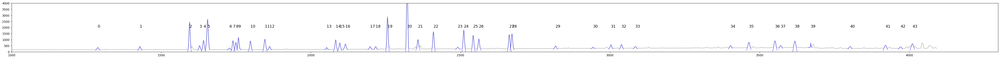

In [57]:
plot_maxes_lorntz(ArXe23_spectrum, maxes_ax23[0], maxes_ax23[1], ymax = 4000, figwidth = 60)

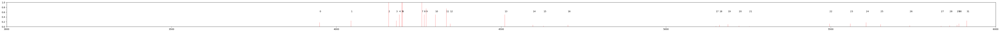

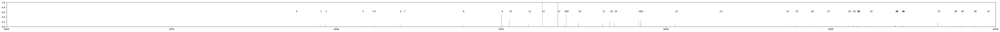

In [58]:
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 50)
plot_lines(Xe_lines, 'b', xmin = 3000, line_height = 5)

In [59]:
pixels23ax = make_pixels_array(maxes_ax23, [0, 1, 2, 3, #4,
                                                     7, 9, 10, #11,
                                                     12, 14, 15, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 40, 42, 43])

pixels23ax_err = make_pixels_err_array(maxes_ax23, [0, 1, 2, 3, #4,
                                                             7, 9, 10, #11,
                                                             12, 14, 15, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 40, 42, 43])

wavelengths23ax = make_wavelength_array([[1, 0], [1, 1], [1, 2], [1, 3],# [1, 4],
                                         [1, 7], [1, 9], [1, 10], #[1, 11],
                                         [1, 12], [2, 9], [1, 13],
                                         [2, 11], [1, 14], [2, 12], [2, 13], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21],
                                         [2, 22], [1, 19], [1, 20], [1, 22], [1, 23], [1, 24], [1, 26], [1, 28], [1, 30]
                                         ])

poly4_params_aug23, poly4_covar_aug23 = opt.curve_fit(poly4_model, pixels23ax, wavelengths23ax, sigma = pixels23ax_err)

residuals23 = wavelengths23ax - poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2],
                                 poly4_params_aug23[3], poly4_params_aug23[4])

In [117]:
# def check_symmetric(a, rtol=1e-05, atol=1e-08):
#     return np.allclose(a, a.T, rtol=rtol, atol=atol)

# check_symmetric(poly4_covar_aug23)

In [124]:
d = {'params': poly4_params_aug23, 'covar_col1': poly4_covar_aug23[0],
     'covar_col2': poly4_covar_aug23[1], 'covar_col3': poly4_covar_aug23[2],
     'covar_col4': poly4_covar_aug23[3], 'covar_col5': poly4_covar_aug23[4]}

df_aug23_params = pd.DataFrame(data=d)

d = {'pix23': pixels23ax}
df_aug23_pix = pd.DataFrame(data=d)

d = {'wavelengths23': wavelengths23ax}
df_aug23_waves = pd.DataFrame(data=d)

filename = 'aug23_calibration_poly4.csv'
df_aug23_params.to_csv(wave_cali_dir + filename, index=False)
print(f"Data has been written to {filename}")

filename = 'aug23_pixels.csv'
df_aug23_pix.to_csv(wave_cali_dir + filename, index=False)
print(f"Data has been written to {filename}")

filename = 'aug23_wavelengths.csv'
df_aug23_waves.to_csv(wave_cali_dir + filename, index=False)
print(f"Data has been written to {filename}")

In [60]:
# plt.figure(figsize = (12, 6))
# plt.scatter(pixels23ax, wavelengths23ax, color = 'k', label = 'data')
# plt.xlabel('Pixels')
# plt.ylabel('Wavelength (Angstroms)')

# plt.errorbar(pixels23ax, poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2],
#                                  poly4_params_aug23[3], poly4_params_aug23[4]), pixels23ax_err, color = 'b', linewidth = 1, label = '4th order poly fit')

# plt.scatter(3576.0654366492577, O_I, color = 'g') #3576.0579981536525 0.12059833743843225 green aug23rd 5577.3445 ‡ 0.0027
# # xx = np.linspace(0, 4127, 4128)
# # interp = make_interp_spline(pixels23ax_acc, wavelengths23ax_acc, k = 1)
# # plt.plot(xx, interp(xx), linewidth = 0.6)
# # xspl23 = interp(xx)
# plt.title('4th Order Polynomial Fit to Xenon Arc Spectrum')
# plt.legend()

#### Aug 23rd Residuals from Different Fits Plot

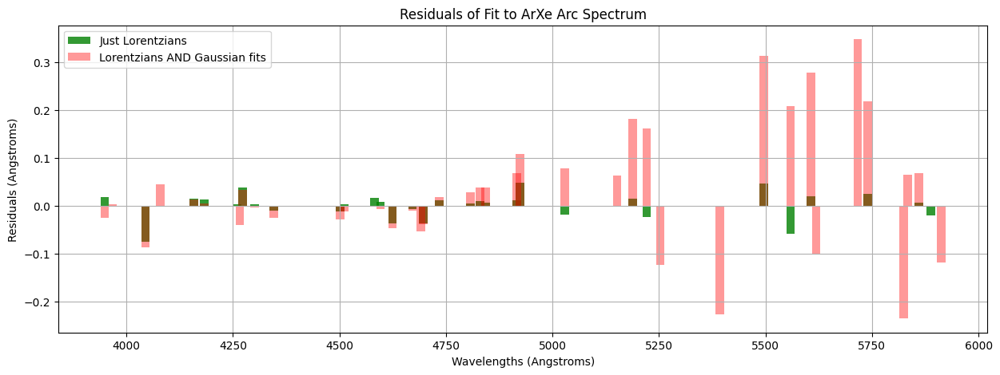

In [61]:
plt.figure(figsize = (15, 5))
# plt.xlabel('Pixels')
# plt.bar(pixels23ax, residuals23, width = 20, color = 'g', alpha = 0.8, label = 'Just Lorentzians')
# plt.bar(pixels23ax_wgauss, residuals_withgauss, width = 20, color = 'r', alpha = 0.3, label = 'Lorentzians AND Gaussian fits')
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(wavelengths23ax, residuals23, width = 20, color = 'g', alpha = 0.8, label = 'Just Lorentzians')
plt.bar(wavelengths23ax_wgauss, residuals_withgauss, width = 20, color = 'r', alpha = 0.4, label = 'Lorentzians AND Gaussian fits')
plt.ylabel('Residuals (Angstroms)')
plt.title('Residuals of Fit to ArXe Arc Spectrum')
plt.grid()
plt.legend()

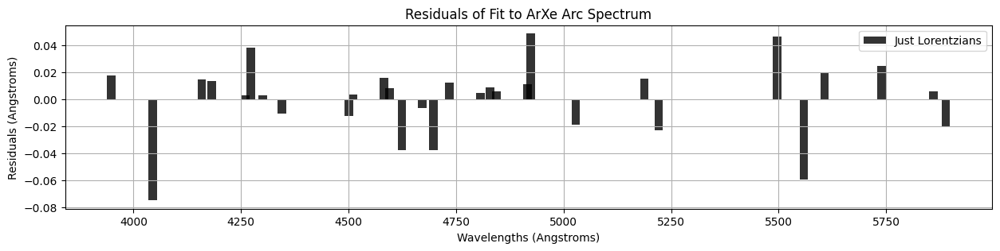

In [62]:
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(wavelengths23ax, residuals23, width = 20, color = 'k', alpha = 0.8, label = 'Just Lorentzians')
plt.ylabel('Residuals (Angstroms)')
plt.title('Residuals of Fit to ArXe Arc Spectrum')
plt.grid()
plt.legend()

### Aug 26th Calibration

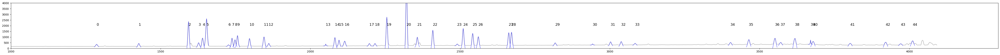

In [63]:
plot_maxes_lorntz(ArXe26_spectrum, maxes_ax26[0], maxes_ax26[1], ymax = 4000)

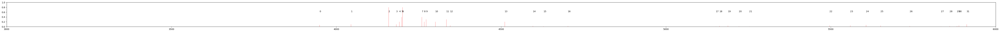

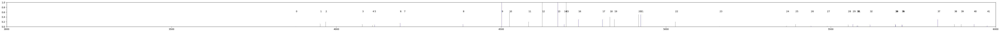

In [64]:
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 20)
plot_lines(Xe_lines, 'b', xmin = 3000)

In [65]:
pixels26ax = make_pixels_array(maxes_ax26, [0, 1, 2, 3, #4,
                                            7, 9, 10, #11,
                                            12, 14, 15, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 41, 43, 44])

pixels26ax_err = make_pixels_err_array(maxes_ax26, [0, 1, 2, 3, #4,
                                                    7, 9, 10, #11,
                                                    12, 14, 15, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 41, 43, 44])

wavelengths26ax = make_wavelength_array([[1, 0], [1, 1], [1, 2], [1, 3], #[1, 4],
                                         [1, 7], [1, 9], [1, 10], #[1, 11],
                                         [1, 12], [2, 9], [1, 13],
                                         [2, 11], [1, 14], [2, 12], [2, 13], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21],
                                         [2, 22], [1, 19], [1, 20], [1, 22], [1, 23], [1, 24], [1, 26], [1, 28], [1, 30]
                                         ])

poly4_params_aug26, poly4_covar_aug26 = opt.curve_fit(poly4_model, pixels26ax, wavelengths26ax, sigma = pixels26ax_err)

residuals26 = wavelengths26ax - poly4_model(pixels26ax, poly4_params_aug26[0],
                                 poly4_params_aug26[1], poly4_params_aug26[2],
                                 poly4_params_aug26[3], poly4_params_aug26[4])

In [116]:
def check_symmetric(a, rtol=1e-05, atol=1e-08):
    return np.allclose(a, a.T, rtol=rtol, atol=atol)

check_symmetric(poly4_covar_aug26)

True

### Aug 27th Calibration

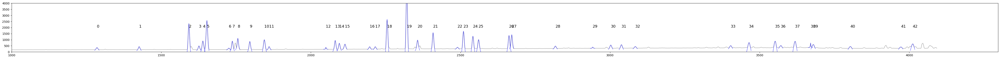

In [66]:
plot_maxes_lorntz(ArXe27_spectrum, maxes_ax27[0], maxes_ax27[1], ymax = 4000, figwidth = 60)

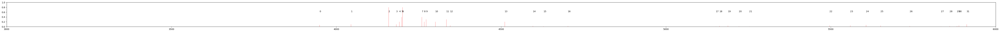

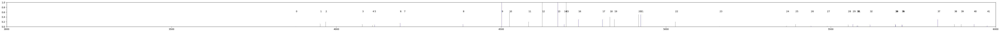

In [67]:
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 20)
plot_lines(Xe_lines, 'b', xmin = 3000)

In [68]:
pixels27ax = make_pixels_array(maxes_ax27, [0, 1, 2, 3, #4,
                                            7, 8, 9, #10,
                                            11, 13, 14, 16, 17, 18, 19, 20, 21, 23, 24, 25,
                                            26, 27, 28, 31, 32, 34, 35, 37, 40, 41, 42])

pixels27ax_err = make_pixels_err_array(maxes_ax27, [0, 1, 2, 3, #4,
                                                    7, 8, 9, #10,
                                                    11, 13, 14, 16, 17, 18, 19, 20, 21, 23,
                                            24, 25, 26, 27, 28, 31, 32, 34, 35, 37, 40, 41, 42])

wavelengths27ax = make_wavelength_array([[1, 0], [1, 1], [1, 2], [1, 3], #[1, 4],
                                         [1, 7], [1, 9], [1, 10], #[1, 11],
                                          [1, 12], [2, 9], [1, 13], [2, 11], [1, 14],
                                         [2, 12], [2, 13], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21], [2, 22], [1, 19],
                                          [1, 20], [1, 22], [1, 23], [1, 24], [1, 26], [1, 28], [1, 30]
                                         ])
# print(len(pixels27ax), len(pixels27ax_err), len(wavelengths27ax))
poly4_params_aug27, poly4_covar_aug27 = opt.curve_fit(poly4_model, pixels27ax, wavelengths27ax, sigma = pixels27ax_err)

residuals27 = wavelengths27ax - poly4_model(pixels27ax, poly4_params_aug27[0],
                                 poly4_params_aug27[1], poly4_params_aug27[2],
                                 poly4_params_aug27[3], poly4_params_aug27[4])

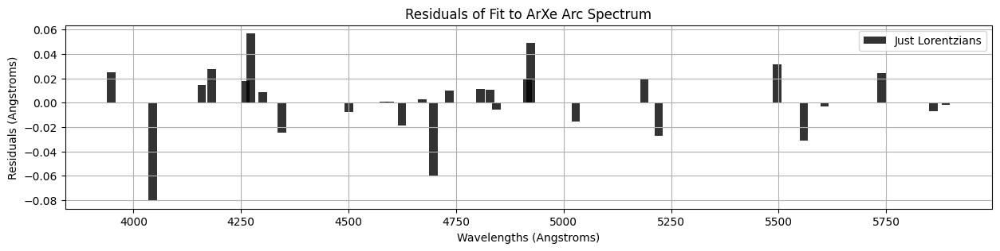

In [69]:
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(wavelengths27ax, residuals27, width = 20, color = 'k', alpha = 0.8, label = 'Just Lorentzians')
plt.ylabel('Residuals (Angstroms)')
plt.title('Residuals of Fit to ArXe Arc Spectrum')
plt.grid()
plt.legend()

In [70]:
print(h_delta)
print(calc_velo_err_lmfit(0.1, h_delta))

4101.734
7.308920032357046


### Oct 03 Calibration

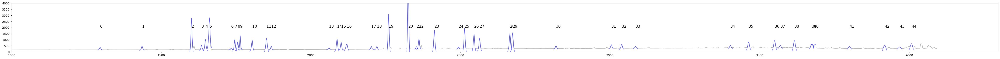

In [71]:
plot_maxes_lorntz(ArXe03_spectrum, maxes_ax03[0], maxes_ax03[1], ymax = 4000, figwidth = 60)

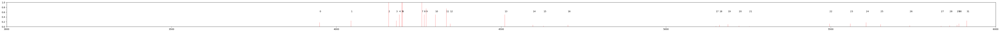

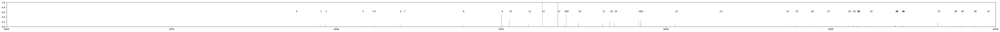

In [72]:
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 50)
plot_lines(Xe_lines, 'b', xmin = 3000, line_height = 5)

In [73]:
pixels03ax = make_pixels_array(maxes_ax03, [0, 1, 2, 3, #4,
                                            7, 9, 10, #11,
                                            12, 14, 15, 17, 18, 19, 20, 22, 23, 25,
                                            26, 27, 28, 29, 30,
                                            32, 33, 35, 36, 38,
                                            41, 43, 44])

pixels03ax_err = make_pixels_err_array(maxes_ax03, [0, 1, 2, 3,# 4,
                                                    7, 9, 10,# 11,
                                                    12, 14, 15, 17, 18, 19, 20, 22, 23, 25,
                                            26, 27, 28, 29, 30,
                                            32, 33, 35, 36, 38,
                                            41, 43, 44])

wavelengths03ax = make_wavelength_array([[1, 0], [1, 1], [1, 2], [1, 3], #[1, 4],
                                         [1, 7], [1, 9], [1, 10], #[1, 11],
                                         [1, 12], [2, 9], [1, 13], [2, 11], [1, 14],
                                         [2, 12], [2, 13], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21], [2, 22],
                                          [1, 19], [1, 20], [1, 22], [1, 23], [1, 24],
                                          [1, 26], [1, 28], [1, 30]
                                         ])
poly4_params_oct03, poly4_covar_oct03 = opt.curve_fit(poly4_model, pixels03ax, wavelengths03ax, sigma = pixels03ax_err)

residuals03 = wavelengths03ax - poly4_model(pixels03ax, poly4_params_oct03[0],
                                 poly4_params_oct03[1], poly4_params_oct03[2],
                                 poly4_params_oct03[3], poly4_params_oct03[4])

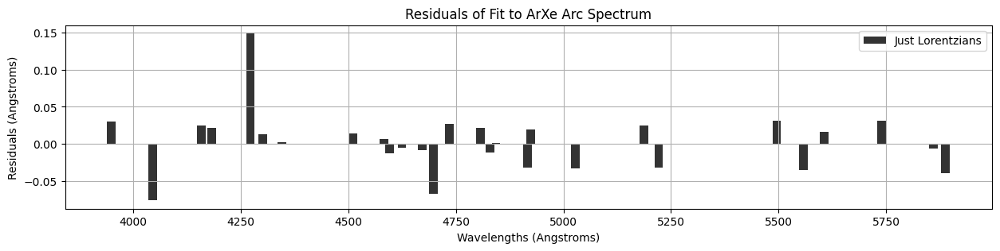

In [74]:
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(wavelengths03ax, residuals03, width = 20, color = 'k', alpha = 0.8, label = 'Just Lorentzians')
plt.ylabel('Residuals (Angstroms)')
plt.title('Residuals of Fit to ArXe Arc Spectrum')
plt.grid()
plt.legend()

### Oct 06 Calibration

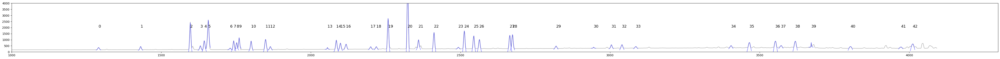

In [75]:
plot_maxes_lorntz(ArXe06_spectrum, maxes_ax06[0], maxes_ax06[1], ymax = 4000, figwidth = 60)

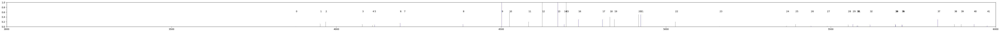

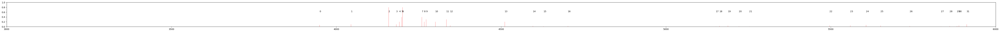

In [76]:
plot_lines(Xe_lines, 'b', xmin = 3000)
plot_lines(Ar_lines, 'r', xmin = 3000, line_height = 20)

In [77]:
pixels06ax = make_pixels_array(maxes_ax06, [0, 1, 2, 3, #4,
                                            7, 9, 10,# 11,
                                            12, 14, 15, 17, 18, 19, 20, 21, 22, 24,
                                            25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 40, 41, 42])

pixels06ax_err = make_pixels_err_array(maxes_ax06, [0, 1, 2, 3, #4,
                                                    7, 9, 10, #11,
                                                    12, 14, 15, 17, 18, 19, 20, 21, 22, 24,
                                            25, 26, 27, 28, 29, 32, 33, 35, 36, 38, 40, 41, 42])

wavelengths06ax = make_wavelength_array([[1, 0], [1, 1], [1, 2], [1, 3], #[1, 4],
                                         [1, 7], [1, 9], [1, 10],# [1, 11],
                                         [1, 12], [2, 9], [1, 13], [2, 11], [1, 14],
                                         [2, 12], [2, 13], [2, 15], [2, 16], [2, 17], [2, 18], [2, 19], [2, 20], [2, 21], [2, 22],
                                          [1, 19], [1, 20], [1, 22], [1, 23], [1, 24],
                                          [1, 26], [1, 28], [1, 30]
                                         ])

poly4_params_oct06, poly4_covar_oct06 = opt.curve_fit(poly4_model, pixels06ax, wavelengths06ax, sigma = pixels06ax_err)

residuals06 = wavelengths06ax - poly4_model(pixels06ax, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2],
                                 poly4_params_oct06[3], poly4_params_oct06[4])

### Write params, covariance matrices, pixels, and wavelengths to CSVs

In [ ]:
def data_to_csv(month, day, data_keyword, data, headers, directory):
  d = {}
  if len(headers) == 1:
    d.update({headers[0]: data})
  else:
    for i in range(len(headers)):
      d.update({headers[i]: data[i]})

  df = pd.DataFrame(data=d)

  filename = month + day + data_keyword + '.csv'
  df.to_csv(directory + filename, index=False)
  print(f"Data has been written to {filename}")

In [147]:
data_to_csv('aug', '23', 'params', poly4_params_aug23, ['params'], wave_cali_dir)
data_to_csv('aug', '26', 'params', poly4_params_aug26, ['params'], wave_cali_dir)
data_to_csv('aug', '27', 'params', poly4_params_aug27, ['params'], wave_cali_dir)
data_to_csv('oct', '03', 'params', poly4_params_oct03, ['params'], wave_cali_dir)
data_to_csv('oct', '06', 'params', poly4_params_oct06, ['params'], wave_cali_dir)

data_to_csv('aug', '23', 'covar', poly4_covar_aug23, ['covar1', 'covar2', 'covar3', 'covar4', 'covar5'], wave_cali_dir)
data_to_csv('aug', '26', 'covar', poly4_covar_aug26, ['covar1', 'covar2', 'covar3', 'covar4', 'covar5'], wave_cali_dir)
data_to_csv('aug', '27', 'covar', poly4_covar_aug27, ['covar1', 'covar2', 'covar3', 'covar4', 'covar5'], wave_cali_dir)
data_to_csv('oct', '03', 'covar', poly4_covar_oct03, ['covar1', 'covar2', 'covar3', 'covar4', 'covar5'], wave_cali_dir)
data_to_csv('oct', '06', 'covar', poly4_covar_oct06, ['covar1', 'covar2', 'covar3', 'covar4', 'covar5'], wave_cali_dir)

data_to_csv('aug', '23', 'pix', pixels23ax, ['pix'], wave_cali_dir)
data_to_csv('aug', '26', 'pix', pixels26ax, ['pix'], wave_cali_dir)
data_to_csv('aug', '27', 'pix', pixels27ax, ['pix'], wave_cali_dir)
data_to_csv('oct', '03', 'pix', pixels03ax, ['pix'], wave_cali_dir)
data_to_csv('oct', '06', 'pix', pixels06ax, ['pix'], wave_cali_dir)

data_to_csv('aug', '23', 'wave', wavelengths23ax, ['wave'], wave_cali_dir)
data_to_csv('aug', '26', 'wave', wavelengths26ax, ['wave'], wave_cali_dir)
data_to_csv('aug', '27', 'wave', wavelengths27ax, ['wave'], wave_cali_dir)
data_to_csv('oct', '03', 'wave', wavelengths03ax, ['wave'], wave_cali_dir)
data_to_csv('oct', '06', 'wave', wavelengths06ax, ['wave'], wave_cali_dir)

Data has been written to aug23params.csv
Data has been written to aug23covar.csv
Data has been written to aug23pix.csv
Data has been written to aug23wave.csv
Data has been written to aug26params.csv
Data has been written to aug26covar.csv
Data has been written to aug26pix.csv
Data has been written to aug26wave.csv
Data has been written to aug27params.csv
Data has been written to aug27covar.csv
Data has been written to aug27pix.csv
Data has been written to aug27wave.csv
Data has been written to oct03params.csv
Data has been written to oct03covar.csv
Data has been written to oct03pix.csv
Data has been written to oct03wave.csv
Data has been written to oct06params.csv
Data has been written to oct06covar.csv
Data has been written to oct06pix.csv
Data has been written to oct06wave.csv


## Find Night Differences in Calibration

### Calculate Night Difference Values

In [78]:
calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_26 = poly4_model(pixels26ax, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
calibration_diff_2326 = calibration_23 - calibration_26
# # difference between known wavelengths between nights (zero)
# line_wave_diff_2326 = wavelengths23ax - wavelengths26ax
# difdif_waves_calibration_2326 = line_wave_diff_2326 - calibration_diff_2326

calibration_26 = poly4_model(pixels26ax, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
calibration_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
calibration_diff_2627 = calibration_26 - calibration_27
# line_wave_diff_2627 = wavelengths26ax - wavelengths27ax
# difdif_waves_calibration_2627 = line_wave_diff_2627 - calibration_diff_2627

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
calibration_diff_2327 = calibration_23 - calibration_27
# line_wave_diff_2327 = wavelengths23ax - wavelengths27ax
# difdif_waves_calibration_2327 = line_wave_diff_2327 - calibration_diff_2327

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_03 = poly4_model(pixels03ax, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
calibration_diff_2303 = calibration_23 - calibration_03
# line_wave_diff_2303 = wavelengths23ax - wavelengths03ax
# difdif_waves_calibration_2303 = line_wave_diff_2303 - calibration_diff_2303

calibration_23 = poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
calibration_06 = poly4_model(pixels06ax, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
calibration_diff_2306 = calibration_23 - calibration_06
# line_wave_diff_2306 = wavelengths23ax - wavelengths06ax
# difdif_waves_calibration_2306 = line_wave_diff_2306 - calibration_diff_2306

In [79]:
xpix23 = np.arange(0, len(ArXe23_spectrum))
lambda_23 = poly4_model(xpix23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# lambda_25 = poly4_model(xpix23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
lambda_26 = poly4_model(xpix23, poly4_params_aug26[0], poly4_params_aug26[1], poly4_params_aug26[2], poly4_params_aug26[3], poly4_params_aug26[4])
lambda_27 = poly4_model(xpix23, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])
lambda_03 = poly4_model(xpix23, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
lambda_06 = poly4_model(xpix23, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# lambda_27 = poly4_model(pixels27ax, poly4_params_aug27[0], poly4_params_aug27[1], poly4_params_aug27[2], poly4_params_aug27[3], poly4_params_aug27[4])

In [155]:
len(ArXe23_spectrum)

4093

In [80]:
delta_lambda2327 = []
for i in range(len(xpix23)):
  delta_lambda2327.append(lambda_23[i] - lambda_27[i])

delta_lambda2303 = []
for i in range(len(xpix23)):
  delta_lambda2303.append(lambda_23[i] - lambda_03[i])

delta_lambda2703 = []
for i in range(len(xpix23)):
  delta_lambda2703.append(lambda_27[i] - lambda_03[i])

delta_lambda2306 = []
for i in range(len(xpix23)):
  delta_lambda2306.append(lambda_23[i] - lambda_06[i])

### Arc Line Differences Individual Plots

Text(0.5, 1.0, 'Night difference between arc lines calibrated with their respective night')

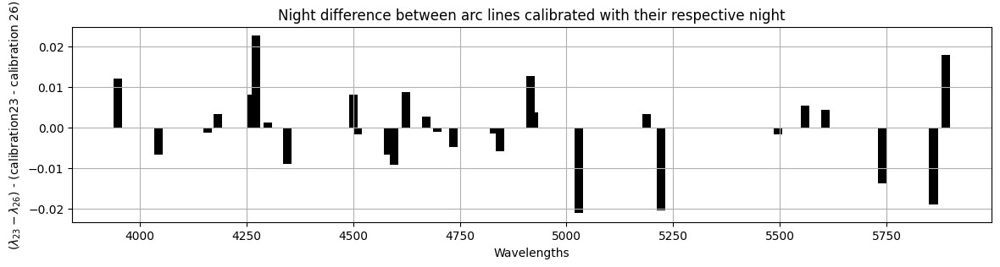

In [81]:
plt.figure(figsize = (14, 3))
# plt.scatter(wavelengths23ax, calibration_diff_2326, color = 'k')
plt.bar(wavelengths23ax, calibration_diff_2326, width = 20, color = 'k')
# plt.bar(wavelengths23ax, difdif_waves_calibration_2326, width = 20, color = 'k')
plt.grid()
plt.xlabel('Wavelengths')
plt.ylabel('$(\lambda_{23} - \lambda_{26})$ - (calibration23 - calibration 26)')
plt.title('Night difference between arc lines calibrated with their respective night')
# plt.title('Difference between (the differences of the same line on different days) AND (the difference between calibrations of those different days)')

In [82]:
# plt.figure(figsize = (14, 3))
# plt.bar(wavelengths26ax, calibration_diff_2627, width = 20, color = 'k')
# plt.grid()
# plt.xlabel('Wavelengths')
# plt.ylabel('$(\lambda_{26} - \lambda_{27})$ - (calibration26 - calibration 27)')
# plt.title('Night difference between arc lines calibrated with their respective night')
# # plt.title('Difference between (the differences of the same line on different days AND the difference between calibrations of those different days')

In [83]:
# plt.figure(figsize = (14, 3))
# plt.bar(wavelengths23ax, calibration_diff_2327, width = 20, color = 'k')
# plt.grid()
# plt.xlabel('Wavelengths')
# plt.ylabel('$(\lambda_{23} - \lambda_{27})$ - (calibration23 - calibration 27)')
# plt.title('Night difference between arc lines calibrated with their respective night')
# # plt.title('Difference between (the differences of the same line on different days AND the difference between calibrations of those different days')

In [84]:
# plt.figure(figsize = (14, 3))
# plt.bar(wavelengths23ax, calibration_diff_2303, width = 20, color = 'k')
# plt.grid()
# plt.xlabel('Wavelengths')
# plt.ylabel('$(\lambda_{23} - \lambda_{day2})$ - (calibration 23 - calibration day2)')
# plt.title('Night difference between arc lines calibrated with their respective night')
# # plt.title('Difference between (the differences of the same line on different days AND the difference between calibrations of those different days')

In [85]:
# plt.figure(figsize = (14, 3))
# plt.bar(wavelengths23ax, difdif_waves_calibration_2306, width = 20, color = 'k')
# plt.grid()
# plt.xlabel('Wavelengths')
# plt.ylabel('$(\lambda_{23} - \lambda_{day2})$ - (calibration 23 - calibration day2)')
# plt.title('Night difference between arc lines calibrated with their respective night')
# # plt.title('Difference between (the differences of the same line on different days AND the difference between calibrations of those different days')

### Night Difference Plots

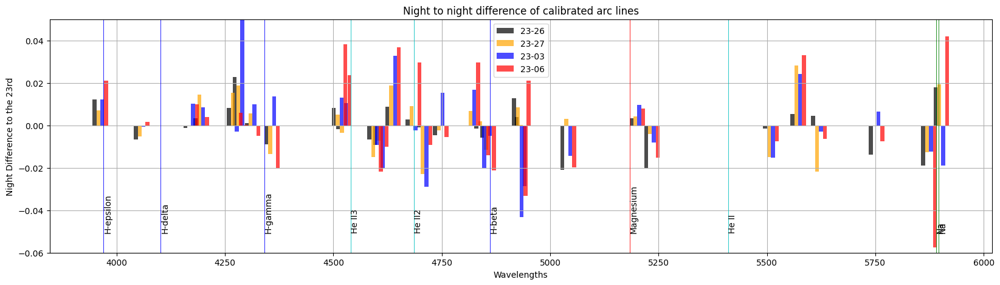

In [86]:
plt.figure(figsize = (20, 5))
arr = [calibration_diff_2326, calibration_diff_2327, calibration_diff_2303, calibration_diff_2306]
carr = ['k', 'orange', 'b', 'r']
labelarr = ['23-26', '23-27', '23-03', '23-06']
for i in np.arange(0, 4):
  barwidth = 9
  plt.bar(wavelengths23ax + i * barwidth, arr[i], width = barwidth, color = carr[i], alpha = 0.7, label = labelarr[i])
  # barwidth = 0.1
  # plt.bar(np.arange(0, len(wavelengths23ax)) + i * barwidth, arr[i], width = barwidth, color = carr[i], alpha = 0.8, label = labelarr[i])
plt.legend()
plt.grid()
plt.xlabel('Wavelengths')
plt.ylabel('Night Difference to the 23rd')
plt.title("Night to night difference of calibrated arc lines")
plt.ylim(-0.06, 0.05)
lines(labely = -0.05)

From this plot it seems that the 23rd is more similar to the other August nights and less so to the October nights.

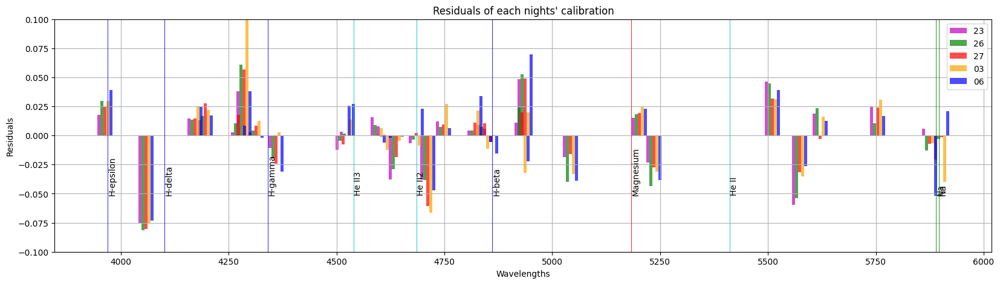

In [87]:
plt.figure(figsize = (20, 5))
arr = [residuals23, residuals26, residuals27, residuals03, residuals06]
carr = ['m', 'g', 'r', 'orange', 'b']
labelarr = ['23', '26', '27', '03', '06']
for i in np.arange(0, 5):
  barwidth = 7
  plt.bar(wavelengths23ax + i * barwidth, arr[i], width = barwidth, color = carr[i], alpha = 0.7, label = labelarr[i])
  # barwidth = 0.1
  # plt.bar(np.arange(0, len(wavelengths23ax)) + i * barwidth, arr[i], width = barwidth, color = carr[i], alpha = 0.8, label = labelarr[i])
plt.legend()
plt.grid()
plt.xlabel('Wavelengths')
plt.ylabel('Residuals')
plt.title("Residuals of each nights' calibration")
plt.ylim(-0.1, 0.1)
lines(labely = -0.05)

# Calibration Stars

## Initialize (Bias and zap our spectra/Import Drilling's spectra)

In [ ]:
BD28_23 = fits_overscan_median(datadir, 23, ['b.0031', 'b.0032'])
BD28_25 = fits_overscan_median(datadir, 25, ['b.0109', 'b.0110'])
BD28_27 = fits_overscan_median(datadir, 27, ['b.0302', 'b.0303'])
BD28_03 = fits_overscan_median(octdir, '03', ['b.0212', 'b.0213'], yearmonth = '2310')

# On October 6th, different star, G191B2B. Radial velocity on SIMBAD of 69 km/s
G191_06 = fits_overscan_median(octdir, '06', ['b.0544', 'b.0545'], yearmonth = '2310')

In [ ]:
# plot_limits_size(BD28_03, min = 0, max = 1000, ytop=595, ybottom=612)

In [ ]:
# plot_limits_size_line(BD28_27, min = 50, max = 1000, ytop = 595, ybottom = 615)

# BD28_23_rot = ndimage.rotate(BD28_23, -0.1, reshape = False)
# plot_limits_size(BD28_25, min = 200, max = 1000, xright = 4000, ytop = 595, ybottom = 620, figsizeheight=3)
# plot_limits_size(BD28_27, min = 200, max = 1000, xright = 4000, ytop = 595, ybottom = 620, figsizeheight=3)
# plot_limits_size(BD28_23_rot, min = 700, max = 1000, xright = 2500, ytop = 595, ybottom = 610, figsizeheight=3)

# BD28_25_rot = ndimage.rotate(BD28_25, -0.085, reshape = False)
# plot_limits_size(BD28_25, min = 100, max = 2000, xright = 2500, ytop = 595, ybottom = 620, figsizeheight=3)
# plot_limits_size(BD28_25_rot, min = 500, max = 2000, xright = 2500, ytop = 595, ybottom = 610, figsizeheight=3)

# plot_limits_size(G191_06, min = 0, max = 1000, xright = 4000, ytop = 595, ybottom = 610, figsizeheight = 3)

### Import Drilling Spectra

In [ ]:
# file f252.txt is worse than the others, probably don't want to use it
with open(BD28dir + 'BD+28_4211_f252.txt') as f:
  BD252lines = [line.rstrip('\n') for line in f]

BD252x = []
BD252y = []
for i in range(len(BD252lines)):
  BD252x.append(float(BD252lines[i][:6]))
  BD252y.append(float(BD252lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f253.txt') as f:
  BD253lines = [line.rstrip('\n') for line in f]

BD253x = []
BD253y = []
for i in range(len(BD253lines)):
  BD253x.append(float(BD253lines[i][:6]))
  BD253y.append(float(BD253lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f254.txt') as f:
  BD254lines = [line.rstrip('\n') for line in f]

BD254x = []
BD254y = []
for i in range(len(BD254lines)):
  BD254x.append(float(BD254lines[i][:6]))
  BD254y.append(float(BD254lines[i][10:]))

with open(BD28dir + 'BD+28_4211_f255.txt') as f:
  BD255lines = [line.rstrip('\n') for line in f]

BD255x = []
BD255y = []
for i in range(len(BD255lines)):
  BD255x.append(float(BD255lines[i][:6]))
  BD255y.append(float(BD255lines[i][10:]))

## BD28

### Drilling velocities of BD28

In [ ]:
# plt.figure(figsize = (14, 5))
# plt.plot(BD252x, BD252y, color = 'b', alpha = 0.6)
# plt.plot(BD253x, BD253y + np.full(len(BD253y), 0.3), color = 'r', alpha = 0.6)
# plt.plot(BD254x, BD254y + np.full(len(BD254y), 0.6), color = 'y', alpha = 0.6)
# plt.plot(BD255x, BD255y + np.full(len(BD255y), 0.9), color = 'g', alpha = 0.6)
# plt.xticks(np.linspace(4000, 5000, 21))
# plt.yticks(np.linspace(0, 2, 11))
# lines(4000, 5000)

In [ ]:
BD253_hbeta = fit_lorentzian_const(BD253y, BD253x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD253_heII2 = fit_lorentzian_const(BD253y, BD253x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD253_hgamma = fit_lorentzian_const(BD253y, BD253x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD253_hdelta = fit_lorentzian_const(BD253y, BD253x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

BD254_hbeta = fit_lorentzian_const(BD254y, BD254x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD254_heII2 = fit_lorentzian_const(BD254y, BD254x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD254_hgamma = fit_lorentzian_const(BD254y, BD254x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD254_hdelta = fit_lorentzian_const(BD254y, BD254x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

BD255_hbeta = fit_lorentzian_const(BD255y, BD255x, 4840.2, 4890.2, h_beta, plot = False, xmin = 4000, xmax = 5000)
BD255_heII2 = fit_lorentzian_const(BD255y, BD255x, 4670.0, 4710.2, He_II2, plot = False, xmin = 4000, xmax = 5000)
BD255_hgamma = fit_lorentzian_const(BD255y, BD255x, 4300.2, 4400.0, h_gamma, plot = False, xmin = 4000, xmax = 5000)
BD255_hdelta = fit_lorentzian_const(BD255y, BD255x, 4080.0, 4120.0, h_delta, plot = False, xmin = 4000, xmax = 5000)

In [ ]:
print("File 253:")
print('delta', BD253_hdelta)
print('gamma', BD253_hgamma)
print('heII2', BD253_heII2)
print('beta', BD253_hbeta)
print('')
print("File 254:")
print('delta', BD254_hdelta)
print('gamma', BD254_hgamma)
print('heII2', BD254_heII2)
print('beta', BD254_hbeta)
print('')
print("File 255:")
print('delta', BD255_hdelta)
print('gamma', BD255_hgamma)
print('heII2', BD255_heII2)
print('beta', BD255_hbeta)

File 253:
delta (-33.72167831889993, 3.947090983650502)
gamma (-13.792645996490007, 2.8366376811086074)
heII2 (10.09442909886006, 0.9120906151509425)
beta (27.95204970697551, 1.6449476912076724)

File 254:
delta (-26.451331924539822, 4.3436036172796815)
gamma (-20.114866335259887, 2.6832924953084216)
heII2 (-2.261163938591709, 0.9319341432544175)
beta (10.73070387955327, 2.0409169091474664)

File 255:
delta (-40.30161039524301, 4.923070989442648)
gamma (-23.48269444768302, 3.1813615646136917)
heII2 (3.6646868914020763, 1.2903847396549708)
beta (19.531876722800916, 1.9150488858472423)


### Grab spectra and x

In [ ]:
BD28_23_spectrum = grab_spectrum(np.flip(BD28_23, 1), top_row = 599, bottom_row = 609)
BD28_23_spectrum = BD28_23_spectrum / BD28_23_spectrum[700:3000].max()
x_BD_23 = cal_wave_4auto(BD28_23_spectrum, poly4_params_aug23)

BD28_25_spectrum = grab_spectrum(np.flip(BD28_25, 1), top_row = 600, bottom_row = 609)
BD28_25_spectrum = BD28_25_spectrum / BD28_25_spectrum[700:3000].max()

BD28_27_spectrum = grab_spectrum(np.flip(BD28_27, 1), top_row = 600, bottom_row = 612)
BD28_27_spectrum = BD28_27_spectrum / BD28_27_spectrum[700:3000].max()
x_BD_27 = cal_wave_4auto(BD28_27_spectrum, poly4_params_aug27)

BD28_03_spectrum = grab_spectrum(np.flip(BD28_03, 1), top_row = 596, bottom_row = 608)
BD28_03_spectrum = BD28_03_spectrum / BD28_03_spectrum[700:3000].max()
x_BD_03 = cal_wave_4auto(BD28_03_spectrum, poly4_params_oct03)

### plot lines in pixels

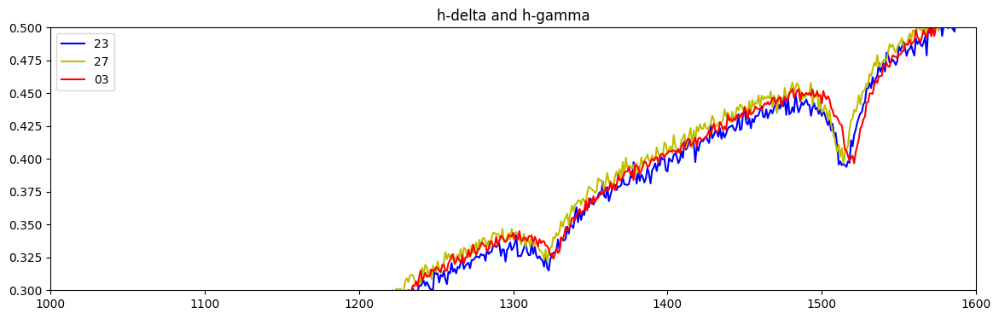

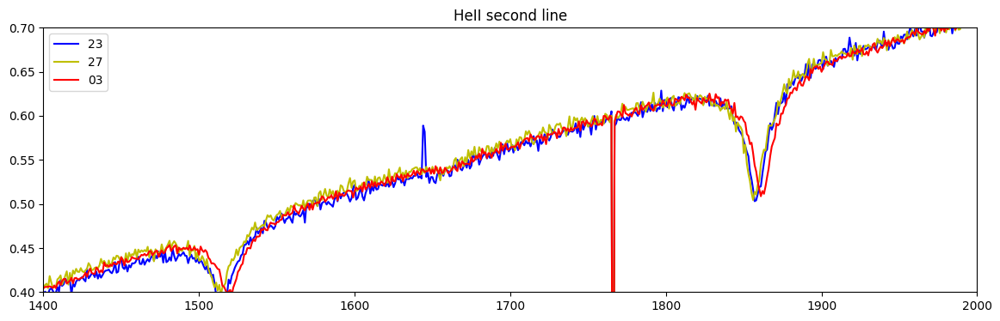

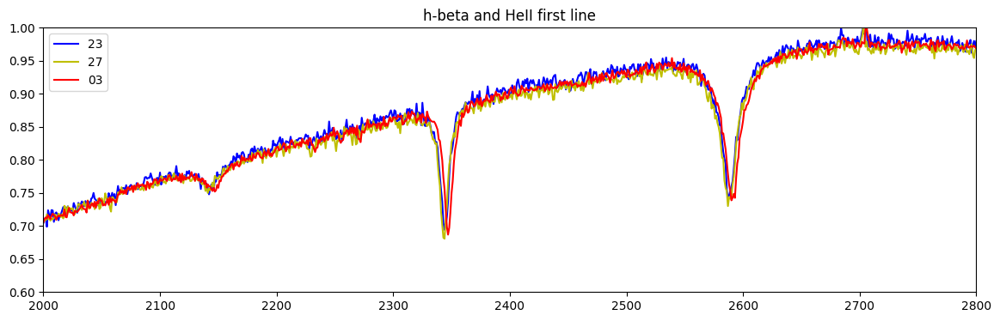

In [ ]:
# Compare spectra
plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.3, 0.5)
plt.xlim(1000, 1600)
plt.title('h-delta and h-gamma')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.4, 0.7)
plt.xlim(1400, 2000)
plt.title('HeII second line')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(BD28_23_spectrum, 'b', label='23')
plt.plot(BD28_27_spectrum, color = 'y', label='27')
plt.plot(BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.6, 1)
plt.xlim(2000, 2800)
# plt.ylim(0.2, 1)
# plt.xlim(3800, 5500)
plt.title('h-beta and HeII first line')
plt.legend()

### plot lines in wavelengths

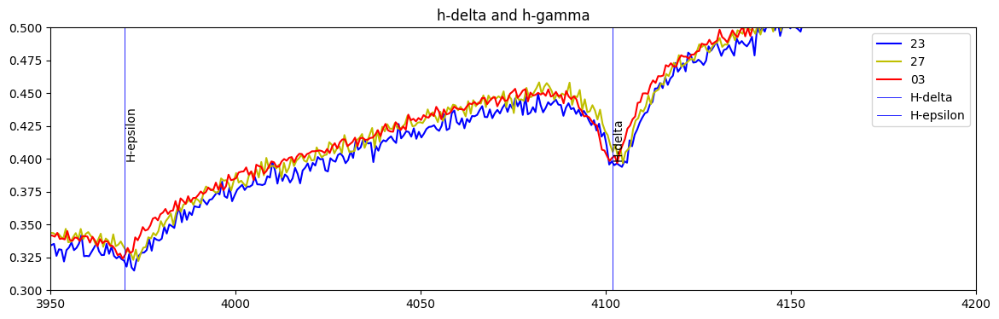

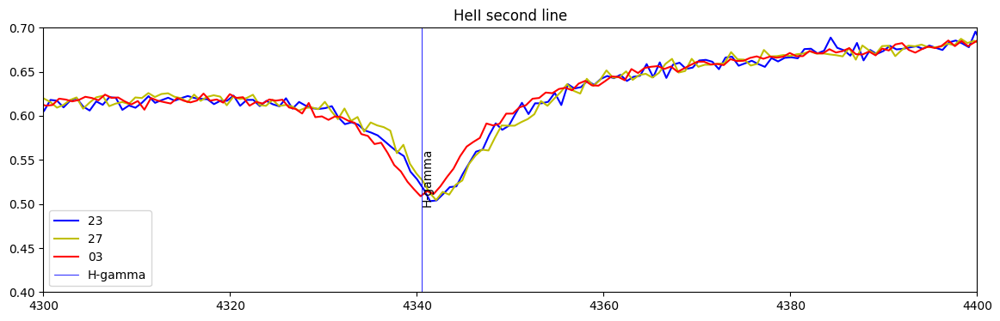

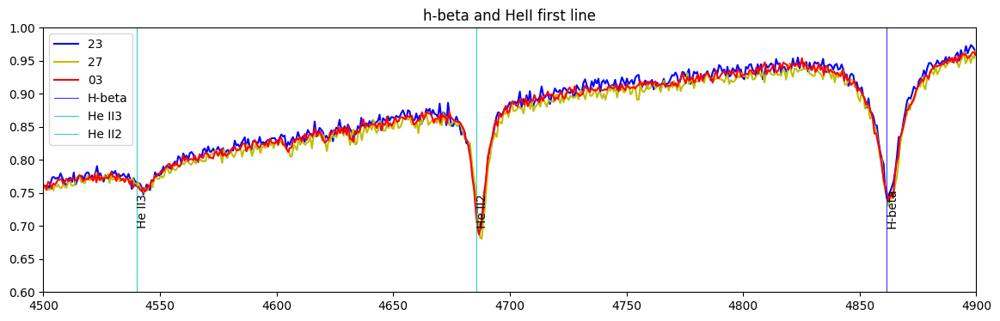

In [ ]:
# Compare spectra
plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.3, 0.5)
plt.xlim(3950, 4200)
lines(3950, 4200, 0.4)
plt.title('h-delta and h-gamma')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.4, 0.7)
plt.xlim(4300, 4400)
lines(4300, 4400, 0.5)
plt.title('HeII second line')
plt.legend()

plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, 'b', label='23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'y', label='27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='03')
plt.ylim(0.6, 1)
plt.xlim(4500, 4900)
lines(4500, 4900, 0.7)
# plt.ylim(0.2, 1)
# plt.xlim(3800, 5500)
plt.title('h-beta and HeII first line')
plt.legend()

### Fit BD28 absorption lines all nights with arcs

In [ ]:
BD23_HeII = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2900, 3800, poly4_params_aug23, He_II, plot = False)
BD23_hbeta = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2400, 2800, poly4_params_aug23, h_beta, plot = False)
BD23_HeII2 = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 2100, 2500, poly4_params_aug23, He_II2, plot = False)
BD23_HeII3 = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 1900, 2300, poly4_params_aug23, He_II3, plot = False)
BD23_hgamma = fit_lorentzian_lin(BD28_23_spectrum, x_BD_23, 1780, 1950, poly4_params_aug23, h_gamma, plot = False)
BD23_hdelta = fit_lorentzian_quad(BD28_23_spectrum, x_BD_23, 1200, 1700, poly4_params_aug23, h_delta, plot = False)
popt_BD23, covar_BD23 = opt.curve_fit(const, np.linspace(0, 5, 6), [BD23_hdelta[0], BD23_hgamma[0], BD23_HeII[0], BD23_HeII2[0], BD23_HeII3[0], BD23_hbeta[0]],
                                            sigma = [BD23_hdelta[1], BD23_hgamma[1], BD23_HeII[1], BD23_HeII2[1], BD23_HeII3[1], BD23_hbeta[1]])

BD23_HeII_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2900, 3800, poly4_params_aug23, He_II, plot = False)
BD23_hbeta_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2400, 2800, poly4_params_aug23, h_beta, plot = False)
BD23_HeII2_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 2100, 2500, poly4_params_aug23, He_II2, plot = False)
BD23_HeII3_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 1900, 2300, poly4_params_aug23, He_II3, plot = False)
BD23_hgamma_wave = fit_lorentzian_lin_wave(BD28_23_spectrum, x_BD_23, 1780, 1950, poly4_params_aug23, h_gamma, plot = False)
BD23_hdelta_wave = fit_lorentzian_quad_wave(BD28_23_spectrum, x_BD_23, 1200, 1700, poly4_params_aug23, h_delta, plot = False)
wave23 = np.array([BD23_hdelta_wave, BD23_hgamma_wave, BD23_HeII2_wave, BD23_HeII3_wave, BD23_HeII2_wave, BD23_hbeta_wave, BD23_HeII_wave])

BD23_HeII_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2900, 3800, He_II, plot = False)
BD23_hbeta_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2400, 2800, h_beta, plot = False)
BD23_HeII2_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 2100, 2500, He_II2, plot = False)
BD23_HeII3_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 1900, 2300, He_II3, plot = False, xmin=2000, xmax=2500)
BD23_hgamma_pix = fit_lorentzian_lin_pixel(BD28_23_spectrum, 1780, 1950, h_gamma, plot = False)
BD23_hdelta_pix = fit_lorentzian_quad_pixel(BD28_23_spectrum, 1200, 1700, h_delta, plot = False)
pix23 = np.array([BD23_hdelta_pix, BD23_hgamma_pix, BD23_HeII3_pix, BD23_HeII2_pix, BD23_hbeta_pix, BD23_HeII_pix])
# plt.scatter(pix23, wave23)

In [ ]:
BD25_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 2400, 2800, h_beta, plot = False)
BD25_HeII_pix =   fit_lorentzian_quad_pixel(BD28_25_spectrum, 2900, 3800, He_II, plot = False)
BD25_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 2100, 2500, He_II2, plot = False)
BD25_HeII3_pix =  fit_lorentzian_quad_pixel(BD28_25_spectrum, 1900, 2300, He_II2, plot = False, xmin=2000, xmax=3000)
BD25_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_25_spectrum, 1780, 1950, h_gamma, plot = False)
BD25_hdelta_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 1200, 1700, h_delta, plot = False)
pix25 = np.array([BD25_hdelta_pix, BD25_hgamma_pix, BD25_HeII2_pix, BD25_HeII3_pix, BD25_hbeta_pix, BD25_HeII_pix])

In [ ]:
BD27_hbeta =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2400, 2800, poly4_params_aug27, h_beta, plot = False)
BD27_HeII =   fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2900, 3800, poly4_params_aug27, He_II, plot = False)
BD27_HeII2 =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 2100, 2500, poly4_params_aug27, He_II2, plot = False)
BD27_HeII3 =  fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 1900, 2300, poly4_params_aug27, He_II3, plot = False)
BD27_hgamma =  fit_lorentzian_lin(BD28_27_spectrum, x_BD_27, 1780, 1950, poly4_params_aug27, h_gamma, plot = False)
BD27_hdelta = fit_lorentzian_quad(BD28_27_spectrum, x_BD_27, 1200, 1700, poly4_params_aug27, h_delta, plot = False)
popt_BD27, covar_BD27 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD27_hdelta[0], BD27_hgamma[0], BD27_HeII[0], BD27_HeII2[0], BD27_hbeta[0]],
                                            sigma = [BD27_hdelta[1], BD27_hgamma[1], BD27_HeII[1], BD27_HeII2[1], BD27_hbeta[1]])

BD27_hbeta_wave =  fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2400, 2800, poly4_params_aug27, h_beta, plot = False)
BD27_HeII_wave =   fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2900, 3800, poly4_params_aug27, He_II, plot = False)
BD27_HeII2_wave =  fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 2100, 2500, poly4_params_aug27, He_II2, plot = False)
BD27_hgamma_wave =  fit_lorentzian_lin_wave(BD28_27_spectrum, x_BD_27, 1780, 1950, poly4_params_aug27, h_gamma, plot = False)
BD27_hdelta_wave = fit_lorentzian_quad_wave(BD28_27_spectrum, x_BD_27, 1200, 1700, poly4_params_aug27, h_delta, plot = False)
wave27 = np.array([BD27_hdelta_wave, BD27_hgamma_wave, BD27_HeII2_wave, BD27_hbeta_wave, BD27_HeII_wave])

BD27_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_27_spectrum, 2400, 2800, h_beta, plot = False)
BD27_HeII_pix =   fit_lorentzian_quad_pixel(BD28_27_spectrum, 2900, 3800, He_II, plot = False)
BD27_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_27_spectrum, 2100, 2500, He_II2, plot = False)
BD27_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_27_spectrum, 1780, 1950, h_gamma, plot = False)
BD27_hdelta_pix = fit_lorentzian_quad_pixel(BD28_27_spectrum, 1200, 1700, h_delta, plot = False)
pix27 = np.array([BD27_hdelta_pix, BD27_hgamma_pix, BD27_HeII2_pix, BD27_hbeta_pix, BD27_HeII_pix])

In [ ]:
BD03_hbeta =  fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2400, 2800, poly4_params_oct03, h_beta, plot = False)
BD03_HeII =   fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2900, 3800, poly4_params_oct03, He_II, plot = False)
BD03_HeII2 =  fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 2100, 2500, poly4_params_oct03, He_II2, plot = False)
BD03_hgamma =  fit_lorentzian_lin(BD28_03_spectrum, x_BD_03, 1780, 1950, poly4_params_oct03, h_gamma, plot = False)
BD03_hdelta = fit_lorentzian_quad(BD28_03_spectrum, x_BD_03, 1200, 1700, poly4_params_oct03, h_delta, plot = False)
popt_BD03, covar_BD03 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD03_hdelta[0], BD03_hgamma[0], BD03_HeII[0], BD03_HeII2[0], BD03_hbeta[0]],
                                            sigma = [BD03_hdelta[1], BD03_hgamma[1], BD03_HeII[1], BD03_HeII2[1], BD03_hbeta[1]])

BD03_hbeta_wave =  fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2400, 2800, poly4_params_oct03, h_beta, plot = False)
BD03_HeII_wave =   fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2900, 3800, poly4_params_oct03, He_II, plot = False)
BD03_HeII2_wave =  fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 2100, 2500, poly4_params_oct03, He_II2, plot = False)
BD03_hgamma_wave =  fit_lorentzian_lin_wave(BD28_03_spectrum, x_BD_03, 1780, 1950, poly4_params_oct03, h_gamma, plot = False)
BD03_hdelta_wave = fit_lorentzian_quad_wave(BD28_03_spectrum, x_BD_03, 1200, 1700, poly4_params_oct03, h_delta, plot = False)
wave03 = np.array([BD03_hdelta_wave, BD03_hgamma_wave, BD03_HeII2_wave, BD03_hbeta_wave, BD03_HeII_wave])

BD03_hbeta_pix =  fit_lorentzian_quad_pixel(BD28_03_spectrum, 2400, 2800, h_beta, plot = False)
BD03_HeII_pix =   fit_lorentzian_quad_pixel(BD28_03_spectrum, 2900, 3800, He_II, plot = False)
BD03_HeII2_pix =  fit_lorentzian_quad_pixel(BD28_03_spectrum, 2100, 2500, He_II2, plot = False)
BD03_hgamma_pix =  fit_lorentzian_lin_pixel(BD28_03_spectrum, 1780, 2000, h_gamma, plot = False, xmin=1500, xmax=2500)
BD03_hdelta_pix = fit_lorentzian_quad_pixel(BD28_03_spectrum, 1200, 1700, h_delta, plot = False)
pix03 = np.array([BD03_hdelta_pix, BD03_hgamma_pix, BD03_HeII2_pix, BD03_hbeta_pix, BD03_HeII_pix])

In [ ]:
diff_wave2327 = wave23 - wave27
diff_wave2303 = wave23 - wave03
diff_wave2703 = wave27 - wave03

### Plot wavelength solution differences and absorption line pixel differences

Text(0.5, 1.0, 'Difference of absorption line wavelengths (23/27) vs pixel')

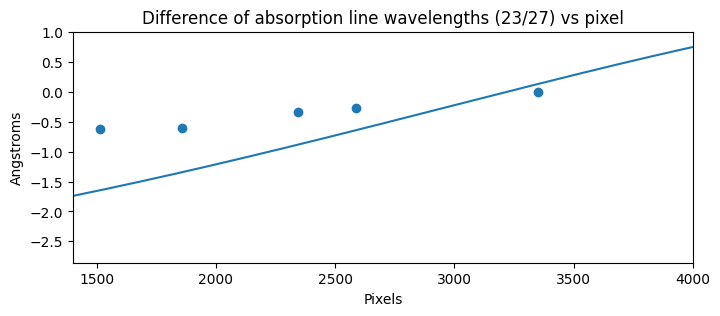

In [ ]:
plt.figure(figsize = (8, 3))
plt.scatter(pix23, diff_wave2327)
plt.plot(xpix23, delta_lambda2327)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (23/27) vs pixel')

Text(0.5, 1.0, 'Difference of absorption line wavelengths (23/03) vs pixel')

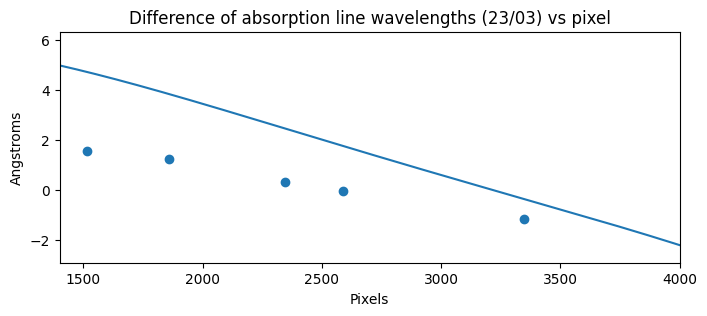

In [ ]:
plt.figure(figsize = (8, 3))
plt.scatter(pix23, diff_wave2303)
plt.plot(xpix23, delta_lambda2303)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (23/03) vs pixel')

Text(0.5, 1.0, 'Difference of absorption line wavelengths (27/03) vs pixel')

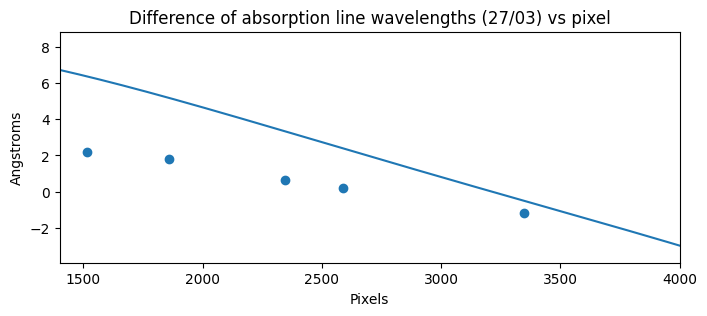

In [ ]:
plt.figure(figsize = (8, 3))
plt.scatter(pix27, diff_wave2703)
plt.plot(xpix23, delta_lambda2703)
plt.xlim(1400, 4000)
plt.xlabel('Pixels')
plt.ylabel('Angstroms')
plt.title('Difference of absorption line wavelengths (27/03) vs pixel')

In [ ]:
# plt.figure(figsize = (8, 3))
# plt.scatter(pix25, diff_wave2703)
# # plt.plot(xpix23, delta_lambda2703)
# plt.xlim(1400, 4000)
# plt.xlabel('Pixels')
# plt.ylabel('Angstroms')
# plt.title('Difference of absorption line wavelengths (27/03) vs pixel')

### Print BD28 Velocities

In [ ]:
print('On Aug 23rd:')
print('H-delta:', BD23_hdelta[0], '+-', BD23_hdelta[1])
print('H-gamma:', BD23_hgamma[0], '+-', BD23_hgamma[1])
print('He II (2):', BD23_HeII2[0], '+-', BD23_HeII2[1])
print('H-beta:', BD23_hbeta[0], '+-', BD23_hbeta[1])
print('He II:', BD23_HeII[0], '+-', BD23_HeII[1])
print(popt_BD23, '+-', np.sqrt(covar_BD23[0]))
print('')
print('On Aug 27th:')
print('H-delta:',   BD27_hdelta[0], '+-', BD27_hdelta[1])
print('H-gamma:',   BD27_hgamma[0], '+-', BD27_hgamma[1])
print('He II (2):', BD27_HeII2[0], '+-',  BD27_HeII2[1])
print('H-beta:',    BD27_hbeta[0], '+-',  BD27_hbeta[1])
print('He II:',     BD27_HeII[0], '+-',   BD27_HeII[1])
print(popt_BD27, '+-', np.sqrt(covar_BD27[0]))
print('')
print('On Oct 3rd:')
print('H-delta:',   BD03_hdelta[0], '+-', BD03_hdelta[1])
print('H-gamma:',   BD03_hgamma[0], '+-', BD03_hgamma[1])
print('He II (2):', BD03_HeII2[0], '+-',  BD03_HeII2[1])
print('H-beta:',    BD03_hbeta[0], '+-',  BD03_hbeta[1])
print('He II:',     BD03_HeII[0], '+-',   BD03_HeII[1])
print(popt_BD03, '+-', np.sqrt(covar_BD03[0]))

On Aug 23rd:
H-delta: 153.74607304147358 +- 18.62269985209422
H-gamma: 127.95347238187165 +- 6.805143603028736
He II (2): 96.8965211989341 +- 4.913368125686813
H-beta: 75.32933805543226 +- 5.293311547598539
He II: 69.66819382223714 +- 9.678328505054143
[94.88470539] +- [10.9869868]

On Aug 27th:
H-delta: 199.02744767890064 +- 18.039874126420276
H-gamma: 169.57742429053863 +- 7.06196668250169
He II (2): 117.71491632361476 +- 3.9988951960230734
H-beta: 91.32759484906785 +- 4.7759021599500935
He II: 69.53004778252743 +- 8.199028240422987
[113.67084859] +- [15.3995387]

On Oct 3rd:
H-delta: 40.2085125116361 +- 15.079150749762526
H-gamma: 43.98335894488602 +- 5.174621457117744
He II (2): 76.07903290189593 +- 3.9558109202927136
H-beta: 78.80429892747671 +- 4.065303942437336
He II: 134.12522146317923 +- 6.92841918069013
[76.17382078] +- [12.38722398]


### Divide Drilling and Our spectra/Fitting wavelength shift to Drilling

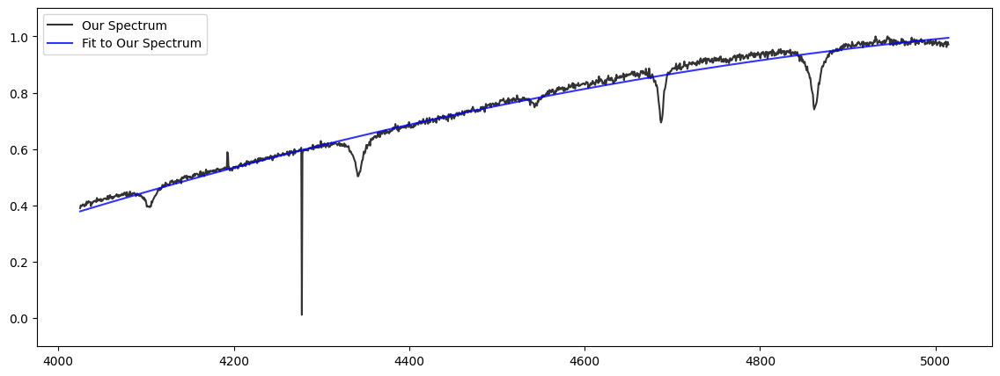

In [ ]:
plt.figure(figsize = (14, 5))
x = calibrate_wavelength_4th_order(BD28_23_spectrum, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
left = 1400
right = 2800
# select only on the central part of the spectra with the most prominent lines
xg = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
l = np.where(x == xg[0])[0][0]
r = np.where(x == xg[-1])[0][0]

a, b = opt.curve_fit(poly2_model, x[l:r], BD28_23_spectrum[left:right])
plt.plot(x[l:r], BD28_23_spectrum[left:right], color = 'k', alpha = 0.8, label = 'Our Spectrum')
plt.plot(x[l:r], poly2_model(x[l:r], a[0], a[1], a[2]), color = 'b', alpha = 0.8, label = 'Fit to Our Spectrum')
plt.ylim(-0.1, 1.1)
# plt.xlim(4000, 5000)
plt.legend()

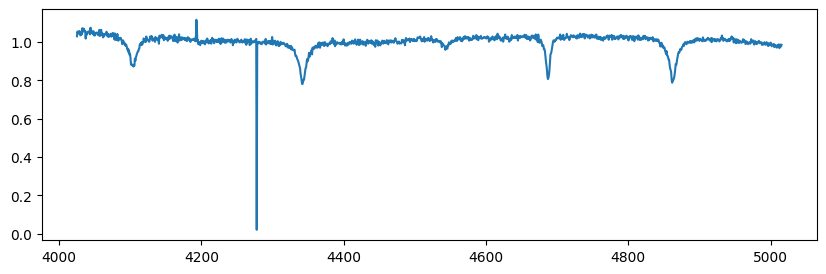

In [ ]:
flatBD23 = BD28_23_spectrum[left:right+1] / poly2_model(x[l:r+1], a[0], a[1], a[2])
plt.figure(figsize = (10, 3))
plt.plot(x[l:r+1], flatBD23)

In [ ]:
def calc_chi_squared(observed, observed_x, expected, expected_x, startleft, startright, step):

  chi_squared_list = []
  shift_list = []

  # loop over different redshifts
  # must start inside of
  for wave_shift in np.arange(startleft, startright, step):
    chi_squared = 0
    # shift the whole observed spectrum a certain redshift (this x is xg and a limited range)
    new_obs_x = observed_x + wave_shift

    # x_our_spectrum_new_redshift = calibrate_wavelength_4th_order_range(np.linspace(left, right, right - left + 1), poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
    # loop over each wavelength and sum chi squared
    for wavelength in new_obs_x:
      index_obs = np.where(new_obs_x == wavelength)[0][0]

      ## Find the nearest drilling index (expected)
      index_exp = np.argmin(np.abs(expected_x - new_obs_x[index_obs]))
      # print(index_exp, expected[index_exp], abs(observed[index_obs] - expected[index_exp]) / expected[index_exp])

      temp_chi_squared = abs(observed[index_obs] - expected[index_exp]) / expected[index_exp]
      if math.isfinite(temp_chi_squared) is True:
        chi_squared += temp_chi_squared


    chi_squared_list.append(chi_squared)
    shift_list.append(wave_shift)

  return (shift_list, chi_squared_list)

In [ ]:
test_chi = calc_chi_squared(flatBD23, xg, BD253y, BD253x, startleft=-3, startright=0, step=0.05)

<ipython-input-108-bae012f48774>:22: RuntimeWarning: divide by zero encountered in scalar divide
  temp_chi_squared = abs(observed[index_obs] - expected[index_exp]) / expected[index_exp]


Text(0, 0.5, 'Chi_squared')

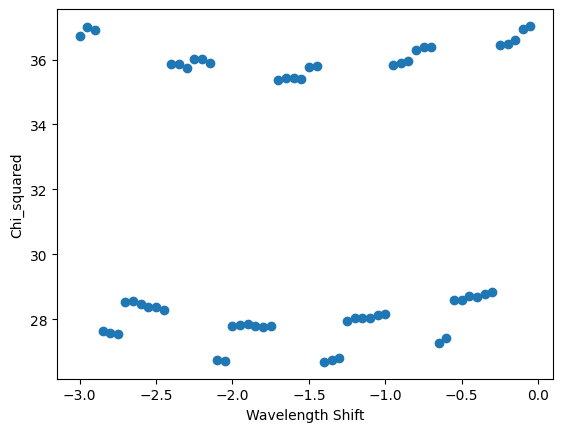

In [ ]:
plt.scatter(test_chi[0], test_chi[1])
plt.xlabel('Wavelength Shift')
plt.ylabel('Chi_squared')

In [ ]:
min_index = np.where(test_chi[1] == min(test_chi[1]))[0][0]
print(min_index)
print(test_chi[0][min_index])
print(calc_velo(h_beta + test_chi[0][min_index], h_beta))

32
-1.4000000000000057
-86.33575423185658


4128


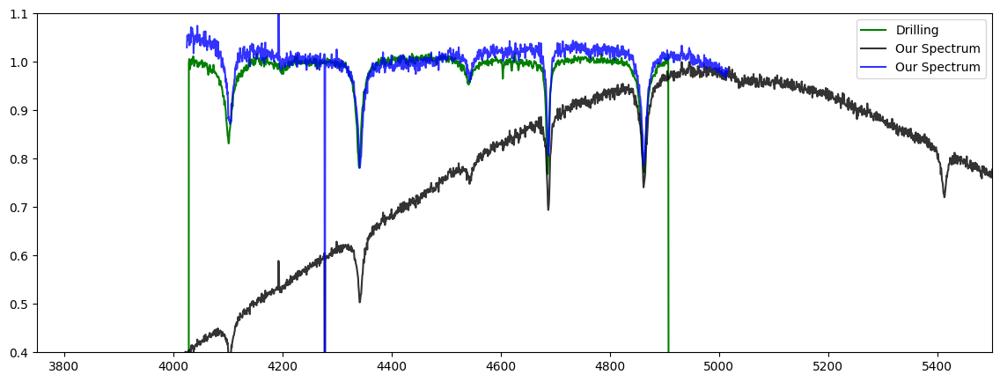

In [ ]:
plt.figure(figsize = (14, 5))
plt.plot(BD253x, BD253y, color = 'g', alpha = 1, label = 'Drilling')
x = calibrate_wavelength_4th_order(BD28_23_spectrum, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
print(len(x))
plt.plot(x, BD28_23_spectrum, color = 'k', alpha = 0.8, label = 'Our Spectrum')
plt.plot(xg, flatBD23, color = 'b', alpha = 0.8, label = 'Our Spectrum')
plt.ylim(0.4, 1.1)
# plt.xlim(4340, 4360)
# plt.xlim(4300, 4400)
# plt.xlim(4650, 4750)
# plt.xlim(4800, 4900)
# plt.xlim(4000, 5000)
plt.xlim(3750, 5500)
# lines(4000, 5000, labely = 0.5)
plt.legend()

(4840.0, 4900.0)

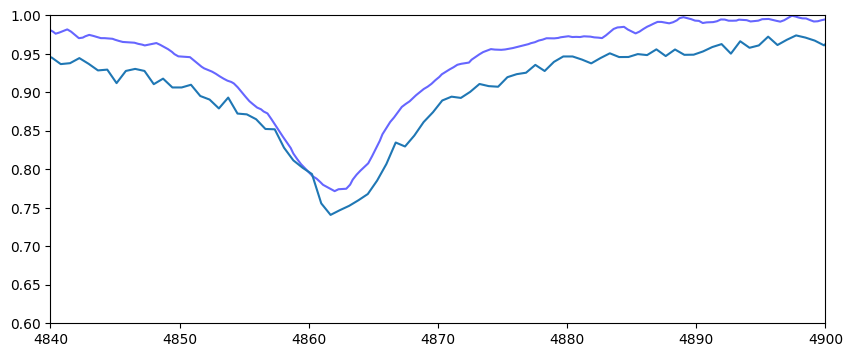

In [ ]:
plt.figure(figsize = (10, 4))
plt.plot(BD253x, BD253y, color = 'b', alpha = 0.6)
plt.plot(x, BD28_23_spectrum)
plt.ylim(0.6, 1.0)
plt.xlim(4840, 4900)
# lines(4840, 4900)

(4850.0, 4880.0)

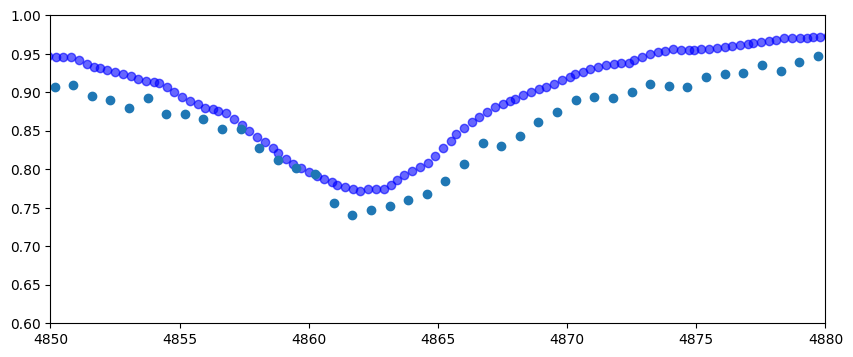

In [ ]:
plt.figure(figsize = (10, 4))
plt.scatter(BD253x, BD253y, color = 'b', alpha = 0.6)
plt.scatter(x, BD28_23_spectrum)
plt.ylim(0.6, 1.0)
plt.xlim(4850, 4880)
# lines(4840, 4900)

In [ ]:
plt.figure(figsize = (15, 3))
left_BD = 1402
right_BD = 2640
xx = np.linspace(x[left_BD], x[right_BD], 1000)
interp = make_interp_spline(x[left_BD: right_BD], BD28_23_spectrum[left_BD: right_BD])

# plt.plot(x, BD28_23_spectrum, alpha = 0.5)
# plt.plot(xx, interp(xx), color = 'r')
# plt.ylim(0, 1)
# print(BD253x[3040])

<Figure size 1500x300 with 0 Axes>

In [ ]:
plt.figure(figsize = (15, 3))
left_253 = 0
right_253 = 3040
xx_253 = np.linspace(BD253x[left_253], BD253x[right_253], 1000)
interp_253 = make_interp_spline(BD253x[left_253: right_253], BD253y[left_253: right_253])

# plt.plot(BD253x, BD253y, alpha = 0.5)
# plt.plot(xx_253, interp_253(xx_253), color = 'r')
# plt.ylim(0.7, 1.1)

<Figure size 1500x300 with 0 Axes>

(1.0, 3.0)

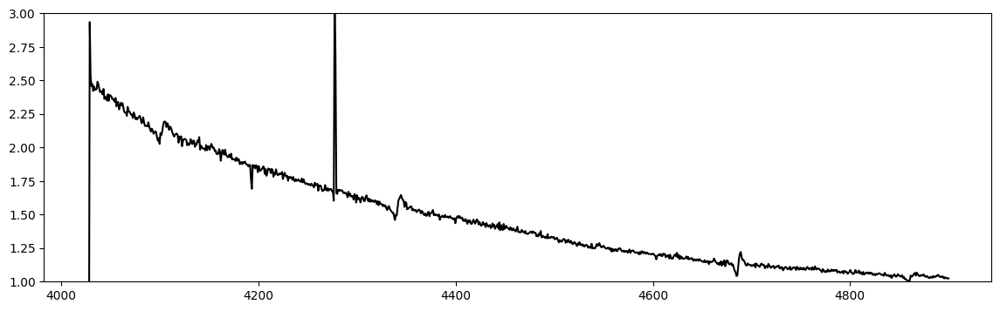

In [ ]:
plt.figure(figsize = (14, 4))
plt.plot(xx, interp_253(xx_253) / interp(xx), color = 'k')
plt.ylim(1, 3)

## Use Nights with Arcs to calibrate 25th

### Aug 25 BD28 pixels

In [ ]:
BD28_25_spectrum = grab_spectrum(np.flip(BD28_25, 1), top_row = 600, bottom_row = 609)
BD28_25_spectrum = BD28_25_spectrum / BD28_25_spectrum[700:3000].max()

BD25_HeII_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 2900, 3800, He_II, plot = False)
BD25_hbeta_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 2400, 2800, h_beta, plot = False)
BD25_HeII2_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 2100, 2500, He_II2, plot = False)
BD25_hgamma_pix = fit_lorentzian_lin_pixel(BD28_25_spectrum, 1780, 1950, h_gamma, plot = False, xmin=1600, xmax=1900, ymax=0.7, ymin=0.3)
BD25_hdelta_pix = fit_lorentzian_quad_pixel(BD28_25_spectrum, 1200, 1700, h_delta, plot = False, xmin=1400, xmax=1600, ymax=0.5, ymin=0.3)
# popt_BD25, covar_BD25 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_hdelta[0], BD25_hgamma[0], BD25_w2_HeII[0], BD25_w23_HeII2[0], BD25_w23_hbeta[0]],
#                                             sigma = [BD25_w23_hdelta[1], BD25_w23_hgamma[1], BD25_w23_HeII[1], BD25_w23_HeII2[1], BD25_w23_hbeta[1]])
pix25 = np.array([BD25_hdelta_pix, BD25_hgamma_pix, BD25_HeII2_pix, BD25_hbeta_pix, BD25_HeII_pix])
pix_residuals25 = pix23 - pix25

[1513.01925922 1855.94796077 2342.15970913 2586.31723339 3346.97144596]
[1513.74606205 1857.24336768 2343.39963441 2587.72292349 3348.80481059]


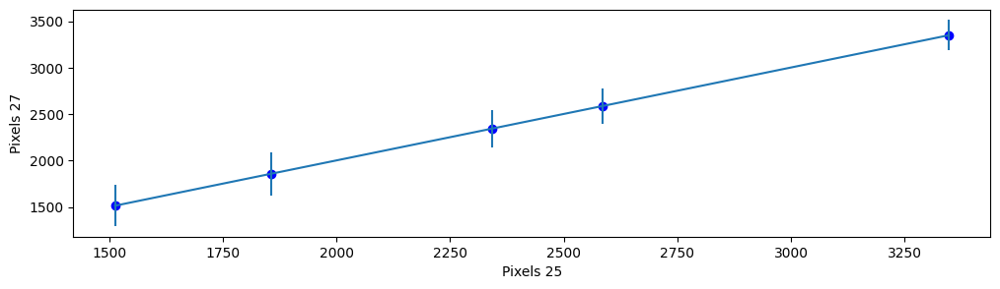

In [ ]:
plt.figure(figsize = (12, 3))
plt.xlabel('Pixels 25')
plt.ylabel('Pixels 27')
plt.scatter(pix25, pix27, color = 'blue')
plt.errorbar(pix25, pix27, yerr=pix_residuals25 * 1e2)
print(pix25)
print(pix27)

[1513.01925922 1855.94796077 2342.15970913 2586.31723339 3346.97144596]
[1515.23877247 1858.29671894 2344.17549989 2588.24849224 3348.62306765]


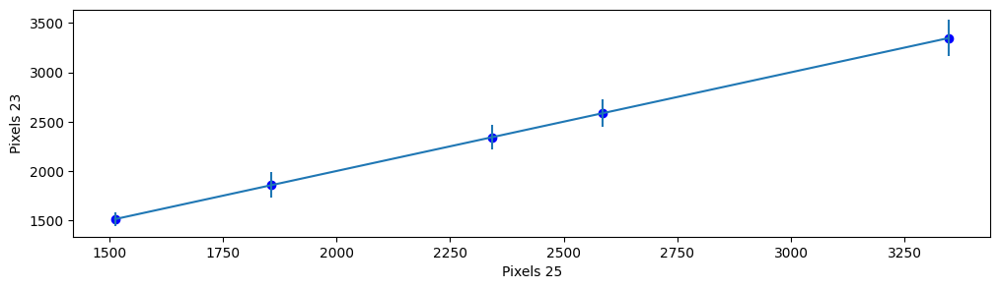

In [ ]:
pix_residuals2725 = pix27 - pix25
plt.figure(figsize = (12, 3))
# plt.scatter(pixels03ax, wavelengths03ax, color = 'k')
# plt.plot(pixels23ax, poly4_model(pixels23ax, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4]), color = 'k', linewidth = 1)
plt.xlabel('Pixels 25')
plt.ylabel('Pixels 27')
plt.scatter(pix25, pix23, color = 'blue')
plt.errorbar(pix25, pix23, yerr=pix_residuals2725 * 1e2)
print(pix25)
print(pix23)

[1513.01925922 1855.94796077 2342.15970913 2586.31723339 3346.97144596]
[1519.82893624 1862.02771052 2347.14047329 2590.75032026 3349.71028462]


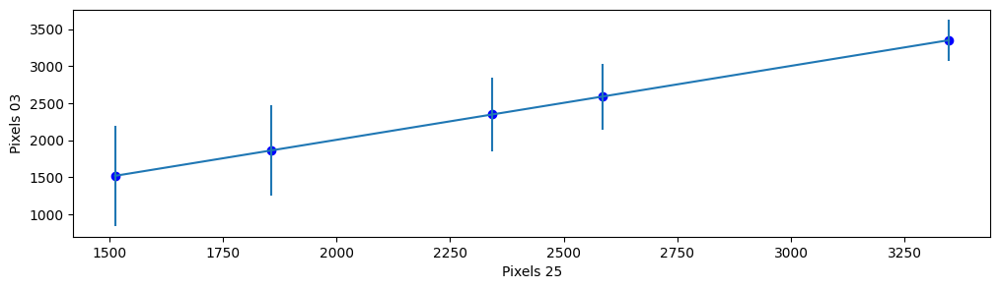

In [ ]:
pix_residuals0325 = pix03 - pix25
plt.figure(figsize = (12, 3))
plt.xlabel('Pixels 25')
plt.ylabel('Pixels 03')
plt.scatter(pix25, pix03, color = 'blue')
plt.errorbar(pix25, pix03, yerr=abs(pix_residuals0325) * 1e2)
print(pix25)
print(pix03)

### Create fits of pixels from the 25th into pixels of nights with arcs

In [ ]:
params_pix_2523_lin, covar_2523_lin = opt.curve_fit(linear_model, pix25, pix23)
params_pix_2523, covar_2523 = opt.curve_fit(poly4_model, pix25, pix23)
print(params_pix_2523)

params_pix_2527_lin, covar_2527_lin = opt.curve_fit(linear_model, pix25, pix27)
params_pix_2527, covar_2527 = opt.curve_fit(poly4_model, pix25, pix27)

params_pix_2503_lin, covar_2503_lin = opt.curve_fit(linear_model, pix25, pix03)
params_pix_2503, covar_2503 = opt.curve_fit(poly4_model, pix25, pix03)

[-1.06338779e-12  1.04483846e-08 -3.76449656e-05  1.05849429e+00
 -3.07223395e+01]


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


#### Plots of fit residuals

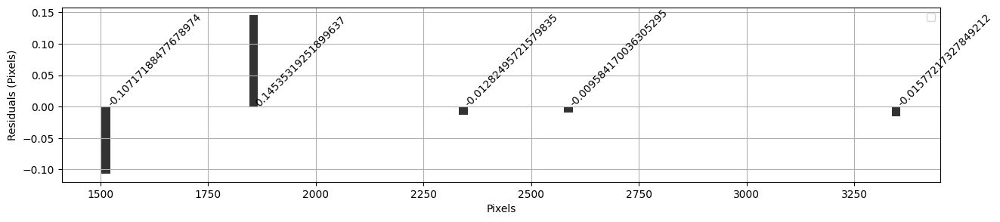

In [ ]:
residuals25 = pix23 - linear_model(pix25, params_pix_2523_lin[0], params_pix_2523_lin[1])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)#, label = 'Just Lorentzians')
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
# plt.title('Residuals of ')
# plt.ylim(-3, 3)
plt.grid()

plt.legend()
for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

# pix25 = np.array([BD25_hdelta_pix, BD25_hgamma_pix, BD25_HeII2_pix, BD25_hbeta_pix, BD25_HeII_pix])

Linear Fit doesn't work very well ^

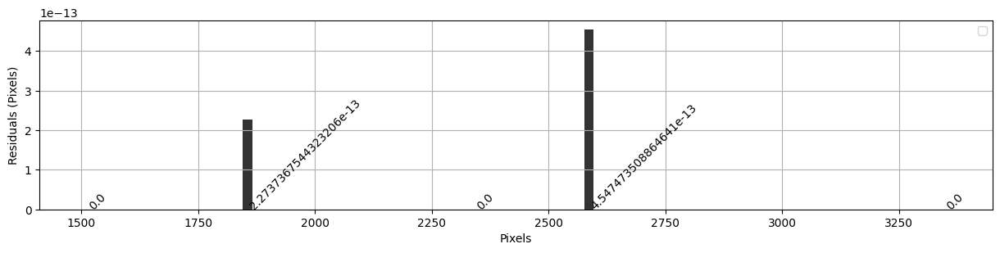

In [ ]:
residuals25 = pix23 - poly4_model(pix25, params_pix_2523[0], params_pix_2523[1], params_pix_2523[2], params_pix_2523[3], params_pix_2523[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)#, label = 'Just Lorentzians')
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
# plt.title('Residuals of ')
# plt.ylim(-3, 3)
plt.grid()

plt.legend()
for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

4th order polynomial works very well ^

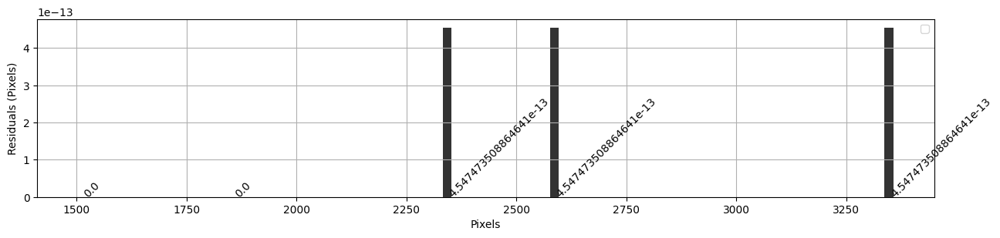

In [ ]:
residuals25 = pix27 - poly4_model(pix25, params_pix_2527[0], params_pix_2527[1], params_pix_2527[2], params_pix_2527[3], params_pix_2527[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)#, label = 'Just Lorentzians')
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
# plt.title('Residuals of ')
# plt.ylim(-3, 3)
plt.grid()

plt.legend()
for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

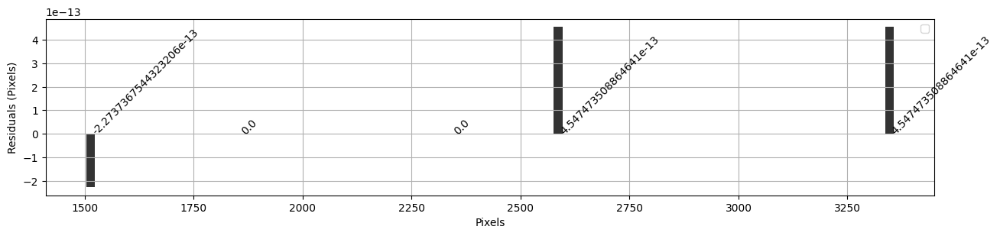

In [ ]:
residuals25 = pix03 - poly4_model(pix25, params_pix_2503[0], params_pix_2503[1], params_pix_2503[2], params_pix_2503[3], params_pix_2503[4])
plt.figure(figsize = (15, 3))
plt.xlabel('Wavelengths (Angstroms)')
plt.bar(pix25, residuals25, width = 20, color = 'k', alpha = 0.8)#, label = 'Just Lorentzians')
plt.ylabel('Residuals (Pixels)')
plt.xlabel('Pixels')
# plt.title('Residuals of ')
# plt.ylim(-3, 3)
plt.grid()

plt.legend()
for i in range(len(pix25)):
  plt.text(pix25[i], 0, residuals25[i], rotation=45)

### Now start with a 25th spectrum (in pixels), convert to 23rd/27th/3rd spectrum (also in pixels), then finally use the 23rd's/27th's/3rd's arc spectrum to convert to wavelength.

In [ ]:
# plt.plot(BD28_25_spectrum, color = 'b')
# plt.xlim(4120, 4150)

In [ ]:
x_pixels_25to23 = calibrate_wavelength_4th_order(BD28_25_spectrum, params_pix_2523[0], params_pix_2523[1], params_pix_2523[2], params_pix_2523[3], params_pix_2523[4])
x_pixels_25to27 = calibrate_wavelength_4th_order(BD28_25_spectrum, params_pix_2527[0], params_pix_2527[1], params_pix_2527[2], params_pix_2527[3], params_pix_2527[4])
x_pixels_25to03 = calibrate_wavelength_4th_order(BD28_25_spectrum, params_pix_2503[0], params_pix_2503[1], params_pix_2503[2], params_pix_2503[3], params_pix_2503[4])
# plt.plot(x_pixels_25to23, BD28_25_spectrum, color = 'b')

In [ ]:
x_waves_25_from_23 = calibrate_wavelength_4th_order_range(x_pixels_25to23, poly4_params_aug23[0],
                                                          poly4_params_aug23[1], poly4_params_aug23[2],
                                                          poly4_params_aug23[3], poly4_params_aug23[4])

x_waves_25_from_27 = calibrate_wavelength_4th_order_range(x_pixels_25to27, poly4_params_aug27[0],
                                                          poly4_params_aug27[1], poly4_params_aug27[2],
                                                          poly4_params_aug27[3], poly4_params_aug27[4])

x_waves_25_from_03 = calibrate_wavelength_4th_order_range(x_pixels_25to03, poly4_params_oct03[0],
                                                          poly4_params_oct03[1], poly4_params_oct03[2],
                                                          poly4_params_oct03[3], poly4_params_oct03[4])

#### Plots of spectra using different night calibrations

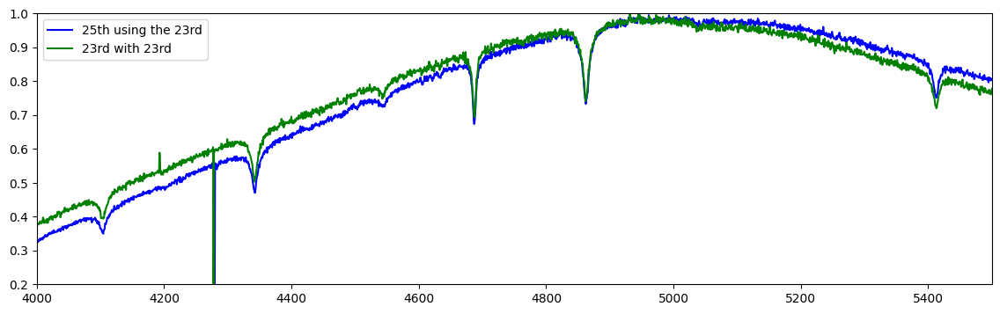

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_23, BD28_25_spectrum, 'b', label='25th using the 23rd')
plt.plot(x_BD_23, BD28_23_spectrum, color = 'g', label='23rd with 23rd')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

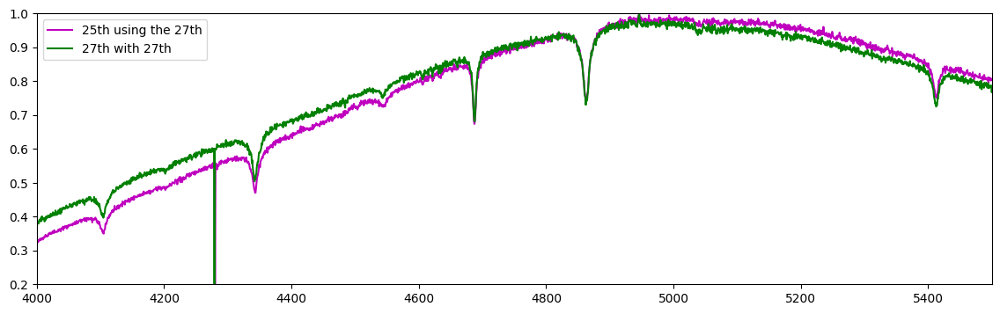

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_27, BD28_25_spectrum, 'm', label='25th using the 27th')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'g', label='27th with 27th')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

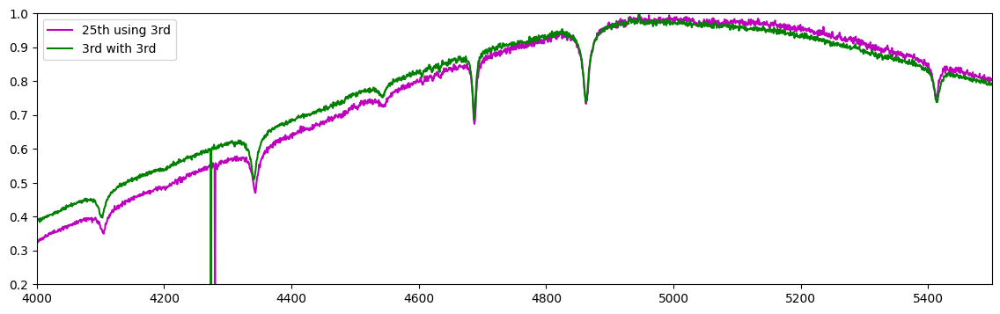

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(x_waves_25_from_27, BD28_25_spectrum, 'm', label='25th using 3rd')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'g', label='3rd with 3rd')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

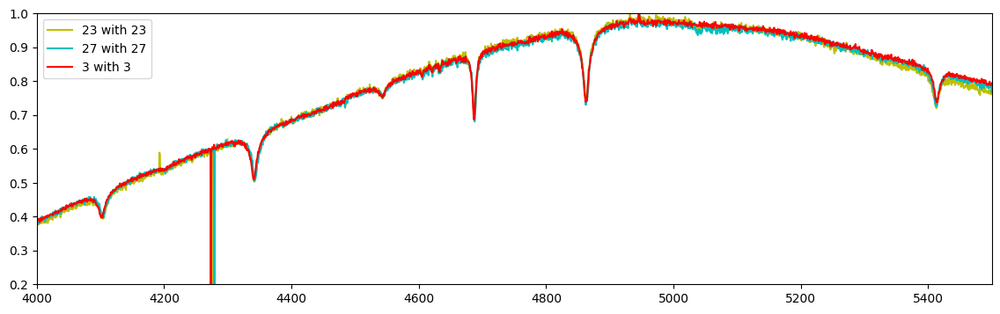

In [ ]:
plt.figure(figsize=(14, 4))
plt.plot(x_BD_23, BD28_23_spectrum, color = 'y', label='23 with 23')
plt.plot(x_BD_27, BD28_27_spectrum, color = 'c', label='27 with 27')
plt.plot(x_BD_03, BD28_03_spectrum, color = 'r', label='3 with 3')
plt.ylim(0.2, 1)
plt.xlim(4000, 5500)
plt.legend()

### Finally... calculate velocities

In [ ]:
BD25_23_hbeta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_23, 2400, 2800, poly4_params_aug23, params_pix_2523, h_beta, plot = False)
BD25_23_HeII = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_23, 2900, 3800, poly4_params_aug23, params_pix_2523, He_II, plot = False)
BD25_23_HeII2 = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_23, 2100, 2500, poly4_params_aug23, params_pix_2523, He_II2, plot = False)
BD25_23_hgamma = fit_lorentzian_lin_blackhawk(BD28_25_spectrum, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = False)
BD25_23_hdelta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_23, 1200, 1700, poly4_params_aug23, params_pix_2523, h_delta, plot = False)
popt_BD25_23, covar_BD25_23 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_23_hdelta[0], BD25_23_hgamma[0], BD25_23_HeII[0], BD25_23_HeII2[0], BD25_23_hbeta[0]],
                                            sigma = [BD25_23_hdelta[1], BD25_23_hgamma[1], BD25_23_HeII[1], BD25_23_HeII2[1], BD25_23_hbeta[1]])

BD25_27_hbeta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False)
BD25_27_HeII = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_27, 2900, 3800, poly4_params_aug27, params_pix_2527, He_II, plot = False)
BD25_27_HeII2 = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_27, 2100, 2500, poly4_params_aug27, params_pix_2527, He_II2, plot = False)
BD25_27_hgamma = fit_lorentzian_lin_blackhawk(BD28_25_spectrum, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False)
BD25_27_hdelta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_27, 1200, 1700, poly4_params_aug27, params_pix_2527, h_delta, plot = False)
popt_BD25_27, covar_BD25_27 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_27_hdelta[0], BD25_27_hgamma[0], BD25_27_HeII[0], BD25_27_HeII2[0], BD25_27_hbeta[0]],
                                            sigma = [BD25_27_hdelta[1], BD25_27_hgamma[1], BD25_27_HeII[1], BD25_27_HeII2[1], BD25_27_hbeta[1]])

BD25_03_hbeta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
BD25_03_HeII = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_03, 2900, 3800, poly4_params_oct03, params_pix_2503, He_II, plot = False)
BD25_03_HeII2 = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_03, 2100, 2500, poly4_params_oct03, params_pix_2503, He_II2, plot = False)
BD25_03_hgamma = fit_lorentzian_lin_blackhawk(BD28_25_spectrum, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = False)
BD25_03_hdelta = fit_lorentzian_quad_blackhawk(BD28_25_spectrum, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False)
popt_BD25_03, covar_BD25_03 = opt.curve_fit(const, np.linspace(0, 4, 5), [BD25_03_HeII[0], BD25_03_HeII2[0], BD25_03_hbeta[0]],
                                            sigma = [BD25_03_HeII[1], BD25_03_HeII2[1], BD25_03_hbeta[1]])

In [ ]:
print('H-delta:', BD25_23_hdelta[0], '+-', BD25_23_hdelta[1])
print('H-gamma:', BD25_23_hgamma[0], '+-', BD25_23_hgamma[1])
print('He II (2):', BD25_23_HeII2[0], '+-', BD25_23_HeII2[1])
print('H-beta:', BD25_23_hbeta[0], '+-', BD25_23_hbeta[1])
print('He II:', BD25_23_HeII[0], '+-', BD25_23_HeII[1])
print(popt_BD25_23, '+-', np.sqrt(covar_BD25_23[0]))
print('')
print('H-delta:', BD25_27_hdelta[0], '+-', BD25_27_hdelta[1])
print('H-gamma:', BD25_27_hgamma[0], '+-', BD25_27_hgamma[1])
print('He II (2):', BD25_27_HeII2[0], '+-', BD25_27_HeII2[1])
print('H-beta:', BD25_27_hbeta[0], '+-', BD25_27_hbeta[1])
print('He II:', BD25_27_HeII[0], '+-', BD25_27_HeII[1])
print(popt_BD25_27, '+-', np.sqrt(covar_BD25_27[0]))
print('')
print('H-delta:', BD25_03_hdelta[0], '+-', BD25_03_hdelta[1])
print('H-gamma:', BD25_03_hgamma[0], '+-', BD25_03_hgamma[1])
print('He II (2):', BD25_03_HeII2[0], '+-', BD25_03_HeII2[1])
print('H-beta:', BD25_03_hbeta[0], '+-', BD25_03_hbeta[1])
print('He II:', BD25_03_HeII[0], '+-', BD25_03_HeII[1])
print(popt_BD25_03, '+-', np.sqrt(covar_BD25_03[0]))

H-delta: 153.70879043711062 +- 16.759920759731465
H-gamma: 127.94096401410889 +- 6.360000420144999
He II (2): 96.89899349461153 +- 4.049502366130727
H-beta: 75.3356996453601 +- 4.207779721207457
He II: 69.63376929050546 +- 7.849132959999055
[92.63427273] +- [10.4456999]

H-delta: 198.84456724816525 +- 16.77777489235782
H-gamma: 169.56734160706387 +- 6.3557239284962055
He II (2): 117.71904847660939 +- 4.047131656541292
H-beta: 91.33765218354165 +- 4.206742684122401
He II: 69.44058206783616 +- 7.821076848001049
[113.35270843] +- [15.9110792]

H-delta: 44.62900638058872 +- 15.221086509623545
H-gamma: 44.52920709788675 +- 6.374363240958194
He II (2): 76.07964665774317 +- 4.059240265699918
H-beta: 78.80409653985605 +- 4.216299567143924
He II: 134.11515084908163 +- 7.884975756458911
[84.24885154] +- [13.10811443]


## G191 Calibration Star

In [ ]:
G191_06_spectrum = grab_spectrum(np.flip(G191_06, 1), top_row = 597, bottom_row = 605)
G191_06_spectrum = G191_06_spectrum / G191_06_spectrum[700:3000].max()
x = calibrate_wavelength_4th_order(G191_06_spectrum, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# plt.figure(figsize = (12, 4))
# plt.plot(x, G191_06_spectrum)
# plt.ylim(-0.1, 1.1)
# # plt.xlim(4600, 5000)
# lines(3500, 6000)
# # lines(5500, 5600)
# # plt.xlim(5500, 5600)
# # plt.ylim(0.6, 0.9)

In [ ]:
# plt.figure(figsize = (12, 3))
# plt.plot(G191_06_spectrum)
# plt.grid()

In [ ]:
G6_hbeta = fit_lorentzian_quad(G191_06_spectrum, x, 2400, 2800, poly4_params_oct06, h_beta, plot = False, xmin = 4500, xmax = 5500)
G6_hgamma = fit_lorentzian_lin(G191_06_spectrum, x, 1780, 1950, poly4_params_oct06, h_gamma, plot = False)
G6_hdelta = fit_lorentzian_lin(G191_06_spectrum, x, 1300, 1650, poly4_params_oct06, h_delta, plot = False)
# G6_hdelta = fit_lorentzian_lin(G191_06_spectrum, x, 1200, 1700, poly4_params_oct06, h_delta, plot = False)
G6_heps = fit_lorentzian_lin(G191_06_spectrum, x, 1200, 1400, poly4_params_oct06, h_epsilon, plot = False)
# popt_G6, covar_G6 = opt.curve_fit(const, np.linspace(0, 3, 4), [G6_heps[0], G6_hdelta[0], G6_hgamma[0], G6_hbeta[0]],
#                                             sigma = [G6_heps[1], G6_hdelta[1], G6_hgamma[1], G6_hbeta[1]])

In [ ]:
print('H-epsilon:', G6_heps[0], '+-', G6_heps[1])
print('H-delta:', G6_hdelta[0], '+-', G6_hdelta[1])
print('H-gamma:', G6_hgamma[0], '+-', G6_hgamma[1])
print('H-beta:', G6_hbeta[0], '+-', G6_hbeta[1])
# print(popt_BD03, '+-', np.sqrt(covar_BD03[0]))

H-epsilon: 363.28034505741977 +- 49.950084201690046
H-delta: 305.35712429731603 +- 39.61507862486611
H-gamma: 162.72918214404342 +- 17.332415050295772
H-beta: 107.96354210550057 +- 12.26329431520937


In [ ]:
green_params06_G6, green_covar06_G6 = opt.curve_fit(Lorentzian_lin, np.arange(5550, 5600), G191_06_spectrum[3550: 3600], p0 = [0, 2, 5577, 0, 1])
# A, sigma, center, c, d
print(green_params06_G6, np.sqrt(green_covar06_G6[2][2]))
# green06_G6_wave = green_params06_G6[2]

[-2.56548848e-01  2.60282847e+00  5.57920346e+03 -5.75214020e-04
  3.85959759e+00] 0.1759216267934056


In [ ]:
print(O_I)

5577.3387


In [ ]:
print(calc_velo_err_lmfit(green_params06_G6[2] - O_I, O_I))
print(calc_velo(green_params06_G6[2], O_I))

100.23458454547485
100.23458454551894


(0.6, 1.0)

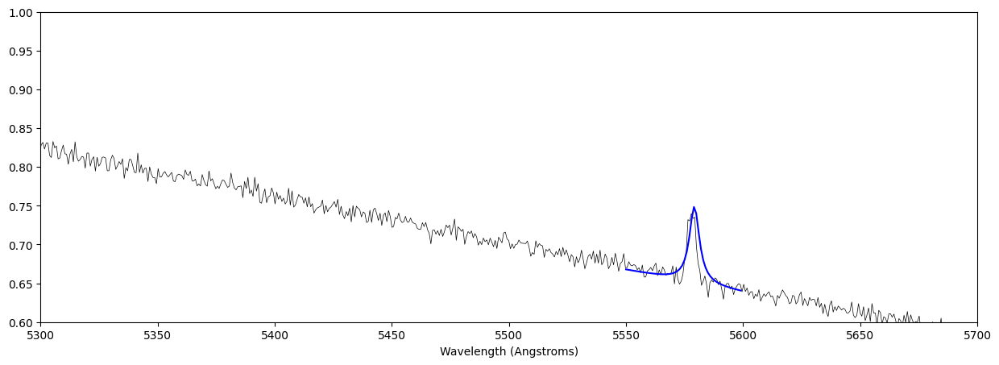

In [ ]:
plt.figure(figsize = (15, 5))
# plt.plot(spectrum2, linewidth = 0.5, color = 'k')
plt.plot(x, G191_06_spectrum, linewidth = 0.5, color = 'k')
# plt.plot(np.arange(3550, 3600), Lorentzian_lin(np.arange(3550, 3600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_G6[0], green_params06_G6[1], green_params06_G6[2], green_params06_G6[3], green_params06_G6[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
# plt.xlim(3500, 3800)
# lines(5300, 5700)
plt.xlim(5300, 5700)
plt.ylim(0.6, 1)

# Flats (August)

"We took twilight sky flats, with the slit and disperser in, in order to get an image of how the slit and disperser illuminate the chip. However, the twilight flats have sky features, which make them unsuitable for using for flat fielding. So, we also took instrument ("MIS") calibration flats, but the illumination pattern is not ideal, so we'll have to use the sky flats or the dome flats to correct. I walk through this process in this step."

## August Twilight Flats

In [ ]:
# twilight_flat_aug23 = fits_overscan_normalize_median(datadir, '23', ['b.0066', 'b.0067', 'b.0068'])
# twilight_flat_aug25 = fits_overscan_normalize_median(datadir, '25', ['b.0073', 'b.0074', 'b.0075'])
twilight_flat_aug23 = fits_overscan_median(datadir, '23', ['b.0066', 'b.0067', 'b.0068'])
twilight_flat_aug25 = fits_overscan_median(datadir, '25', ['b.0073', 'b.0074', 'b.0075'])

In [ ]:
# basic_plot(twilight_flat_aug23, min = 0, max = 10000)
# basic_plot(twilight_flat_aug25, min = 0, max = 3)

## August MIS (Instrument) Flats

In [ ]:
# MIS_flat_aug23 = fits_overscan_normalize_median(datadir, '23', ['b.0005', 'b.0006', 'b.0007', 'b.0008', 'b.0009', 'b.0010',
#                                                         'b.0011', 'b.0012', 'b.0013', 'b.0014'])
# MIS_flat_aug26 = fits_overscan_normalize_median(datadir, '26', ['b.0167', 'b.0168', 'b.0169', 'b.0170', 'b.0171', 'b.0172', 'b.0173',
#                                                         'b.0174', 'b.0175', 'b.0176', 'b.0177', 'b.0178', 'b.0179', 'b.0180', 'b.0181',
#                                                         'b.0182', 'b.0183', 'b.0184', 'b.0185', 'b.0186'])
MIS_flat_aug23 = fits_overscan_median(datadir, '23', ['b.0005', 'b.0006', 'b.0007', 'b.0008', 'b.0009', 'b.0010',
                                                        'b.0011', 'b.0012', 'b.0013', 'b.0014'])
MIS_flat_aug26 = fits_overscan_median(datadir, '26', ['b.0167', 'b.0168', 'b.0169', 'b.0170', 'b.0171', 'b.0172', 'b.0173',
                                                        'b.0174', 'b.0175', 'b.0176', 'b.0177', 'b.0178', 'b.0179', 'b.0180', 'b.0181',
                                                        'b.0182', 'b.0183', 'b.0184', 'b.0185', 'b.0186'])

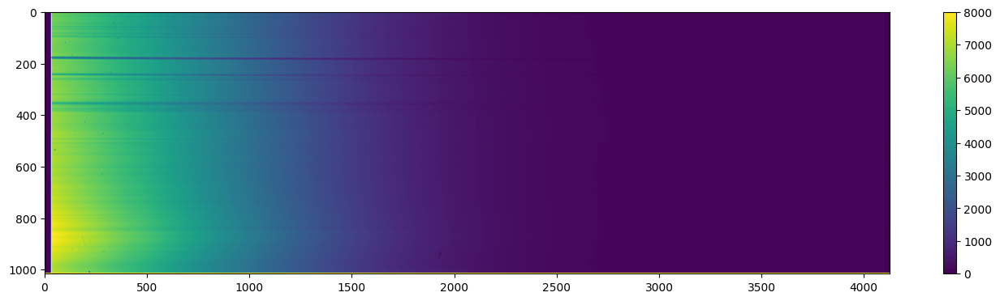

In [ ]:
basic_plot(MIS_flat_aug23, min = 0, max = 8000)
# basic_plot(MIS_flat_aug26, min = 0, max = 8000)
# basic_plot(MIS_flat_aug27, min = 0, max = 15)

## Combine August Flats

In [ ]:
MIS_block_avg_aug23 = np.average(MIS_flat_aug23, axis = 0)
twilight_block_avg_aug23 = np.average(twilight_flat_aug23, axis = 0)

twilight_quotient_aug23 = twilight_block_avg_aug23 / MIS_block_avg_aug23

In [ ]:
# plt.figure(figsize = (15, 4))
# plt.plot(twilight_quotient_aug23, color = 'k')
x = calibrate_wavelength_4th_order(twilight_quotient_aug23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 4))
plt.plot(x, twilight_quotient_aug23, color = 'k')
plt.xlim(4000, 5500)

In [ ]:
# x = np.arange(len(twilight_quotient_aug23))
# params, covar = opt.curve_fit(poly4_model, x, twilight_quotient_aug23)
# plt.plot(twilight_quotient_aug23)
# plt.plot(x, poly4_model(x, params[0], params[1], params[2], params[3], params[4]))

In [ ]:
x = np.arange(len(twilight_quotient_aug23))
params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_aug23, p0 = [12.69, 633, 2211, 1])
plt.plot(twilight_quotient_aug23, alpha = 0.4)
plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1)

In [ ]:
# x = np.arange(len(twilight_quotient_aug23))
# xx = np.linspace(0, len(twilight_quotient_aug23), 13)
# plt.plot(twilight_quotient_aug23, alpha = 0.4)

# from scipy.interpolate import make_interp_spline
# interp = make_interp_spline(x, twilight_quotient_aug23)
# plt.plot(xx, interp(xx))

In [ ]:
# plt.scatter(xx, interp(xx))
# interp2 = make_interp_spline(xx, interp(xx))
# plt.plot(x, interp2(x))

In [ ]:
# from scipy.interpolate import make_lsq_spline, BSpline, splrep

# # spl = make_lsq_spline(x, twilight_quotient_aug23, t, k)

# xx = np.linspace(0, len(twilight_quotient_aug23), 4128)#4128, 25
# tck = splrep(x, twilight_quotient_aug23, s=0)
# tck_4 = splrep(x, twilight_quotient_aug23, s=100)
# tck_3 = splrep(x, twilight_quotient_aug23, s=2000)
# tck_s = splrep(x, twilight_quotient_aug23, s=len(x))

# # x = np.arange(len(twilight_quotient_aug23))
# # xx = np.linspace(0, len(twilight_quotient_aug23), 25)
# plt.plot(twilight_quotient_aug23, alpha = 0.4)
# # plt.plot(xx, BSpline(*tck_4)(xx), color = 'k')
# # plt.plot(xx, BSpline(*tck)(xx), color = 'g')
# # plt.plot(xx, BSpline(*tck_s)(xx), color = 'r')
# plt.plot(xx, BSpline(*tck_3)(xx), color = 'b', alpha = 1)

In [ ]:
smooth_quotient_aug23 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
                                                  params_gauss[2], params_gauss[3],
                                                  )] * len(twilight_flat_aug23[:, 0]))
# print(smooth_quotient_aug23)
basic_plot(smooth_quotient_aug23, min = 0, max = 10)

In [ ]:
# smooth_quotient_aug23_spline = np.vstack([interp2(x)] * len(twilight_flat_aug23[:, 0]))
# # print(smooth_quotient_aug23)
# basic_plot(smooth_quotient_aug23_spline, min = 0, max = 10)

In [ ]:
flat_balanced_aug23 = MIS_flat_aug23 * smooth_quotient_aug23
flat_balanced_aug23 = flat_balanced_aug23 / (np.median(flat_balanced_aug23))
basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [ ]:
# flat_balanced_aug23 = MIS_flat_aug23 * smooth_quotient_aug23_spline
# flat_balanced_aug23 = flat_balanced_aug23 / (np.median(flat_balanced_aug23))
# basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [ ]:
MIS_block_avg_aug26 = np.average(MIS_flat_aug26, axis = 0)
twilight_block_avg_aug25 = np.average(twilight_flat_aug25, axis = 0)

twilight_quotient_aug25 = twilight_block_avg_aug25 / MIS_block_avg_aug26

In [ ]:
x = np.arange(len(twilight_quotient_aug25))
params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_aug25, p0 = [12.69, 633, 2211, 1])
plt.plot(twilight_quotient_aug25, alpha = 0.4)
plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1)

In [ ]:
smooth_quotient_aug25 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
                                                  params_gauss[2], params_gauss[3],
                                                  )] * len(twilight_flat_aug25[:, 0]))
# basic_plot(smooth_quotient_aug25, min = 0, max = 10)
flat_balanced_aug25 = MIS_flat_aug26 * smooth_quotient_aug25
flat_balanced_aug25 = flat_balanced_aug25 / (np.median(flat_balanced_aug25))
# basic_plot(flat_balanced_aug23, min = 0, max = 2)

In [ ]:
# # x = np.arange(len(twilight_quotient_aug23))
# xx = np.linspace(0, len(twilight_quotient_aug25), 25)
# plt.plot(twilight_quotient_aug25, alpha = 0.4)

# from scipy.interpolate import make_interp_spline
# interp = make_interp_spline(x, twilight_quotient_aug25)
# plt.plot(xx, interp(xx))

In [ ]:
# plt.scatter(xx, interp(xx))
# interp2 = make_interp_spline(xx, interp(xx))
# plt.plot(x, interp2(x))

In [ ]:
# smooth_quotient_aug25 = np.vstack([interp2(x)] * len(twilight_flat_aug25[:, 0]))
# # basic_plot(smooth_quotient_aug25, min = 0, max = 10)
# flat_balanced_aug25 = MIS_flat_aug26 * smooth_quotient_aug25
# flat_balanced_aug25 = flat_balanced_aug25 / (np.median(flat_balanced_aug25))
# # basic_plot(flat_balanced_aug23, min = 0, max = 2)

# October Flats

## October Twilight Flats

In [ ]:
# twilight_flat_oct03 = fits_overscan_normalize_median(octdir, '03', ['b.0195', 'b.0196', 'b.0197'], 2310)
# twilight_flat_oct06 = fits_overscan_normalize_median(octdir, '06', ['b.0523', 'b.0524', 'b.0525'], 2310)
twilight_flat_oct03 = fits_overscan_median(octdir, '03', ['b.0195', 'b.0196', 'b.0197'], 2310)
twilight_flat_oct06 = fits_overscan_median(octdir, '06', ['b.0523', 'b.0524', 'b.0525'], 2310)

In [ ]:
# basic_plot(twilight_flat_oct03, min = 0, max = 3)
# basic_plot(twilight_flat_oct06, min = 0, max = 3)

## October MIS (Instrument) Flats

In [ ]:
# MIS_flat_oct03 = fits_overscan_normalize_median(octdir, '03', ['b.0266', 'b.0267', 'b.0268', 'b.0269', 'b.0270', 'b.0271',
#                                                         'b.0272', 'b.0273'], 2310)
# MIS_flat_oct06 = fits_overscan_normalize_median(octdir, '06', ['b.0505', 'b.0506', 'b.0507', 'b.0508', 'b.0509', 'b.0510',
#                                                         'b.0511', 'b.0512', 'b.0513'], 2310)

MIS_flat_oct03 = fits_overscan_median(octdir, '03', ['b.0266', 'b.0267', 'b.0268', 'b.0269', 'b.0270', 'b.0271',
                                                        'b.0272', 'b.0273'], 2310)
MIS_flat_oct06 = fits_overscan_median(octdir, '06', ['b.0505', 'b.0506', 'b.0507', 'b.0508', 'b.0509', 'b.0510',
                                                        'b.0511', 'b.0512', 'b.0513'], 2310)

In [ ]:
# basic_plot(MIS_flat_oct03, min = 0, max = 15)
# basic_plot(MIS_flat_oct06, min = 0, max = 15)

## Combine October Flats

In [ ]:
MIS_block_avg_oct03 = np.average(MIS_flat_oct03, axis = 0)
twilight_block_avg_oct03 = np.average(twilight_flat_oct03, axis = 0)

twilight_quotient_oct03 = twilight_block_avg_oct03 / MIS_block_avg_oct03
x = np.arange(len(twilight_quotient_oct03))

In [ ]:
x = np.arange(len(twilight_quotient_oct03))
params_gauss, covar = opt.curve_fit(gaussian_model, x, twilight_quotient_oct03, p0 = [12.69, 633, 2211, 1])
plt.plot(twilight_quotient_oct03, alpha = 0.4)
plt.plot(x, gaussian_model(x, params_gauss[0], params_gauss[1], params_gauss[2], params_gauss[3]), alpha = 1)

In [ ]:
smooth_quotient_oct03 = np.vstack([gaussian_model(x, params_gauss[0], params_gauss[1],
                                                  params_gauss[2], params_gauss[3],
                                                  )] * len(twilight_flat_oct03[:, 0]))
# print(smooth_quotient_aug23)
basic_plot(smooth_quotient_oct03, min = 0, max = 10)

In [ ]:
flat_balanced_oct03 = MIS_flat_oct03 * smooth_quotient_oct03
flat_balanced_oct03 = flat_balanced_oct03 / (np.median(flat_balanced_oct03))
basic_plot(flat_balanced_oct03, min = 0, max = 2)

# Testing cosmic zapping functions (GCC1)

In [ ]:
# grism1_overscan_zap = median_for_cosmic_zapping(datadir, 23, ['b.0035', 'b.0036'])

In [ ]:
# grism1 = median_fits(datadir, 23, ['b.0035', 'b.0036'])
# grism1_overscan = subtract_overscan(grism1)
# basic_plot(grism1_overscan, min = 0, max = 10)

In [ ]:
# test_std_zap = zap_two_std(datadir, 23, ['b.0035', 'b.0036'])

In [ ]:
# basic_plot(test_std_zap, min = 0, max = 10)

In [ ]:
test_short_zap = zap_two(datadir, 23, ['b.0035', 'b.0036'], 15)

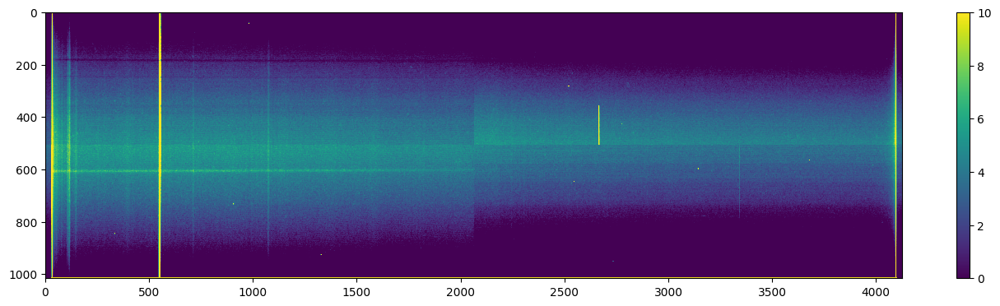

In [ ]:
basic_plot(test_short_zap, min = 0, max = 10)

(3700.0, 6000.0)

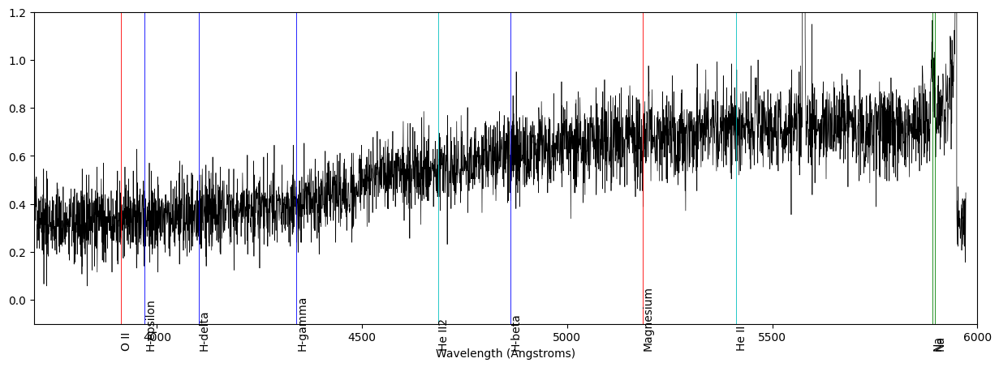

In [ ]:
spectrum1 = grab_spectrum(test_short_zap, 603, 610)
spectrum1 = np.flip(spectrum1 / spectrum1[700:1000].max(), 0)
x = calibrate_wavelength_4th_order(spectrum1, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 5))
plt.plot(x, spectrum1, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 6000)
plt.xlim(3700, 6000)

In [ ]:
min_zap = min_zapping(datadir, 23, ['b.0035', 'b.0036'])

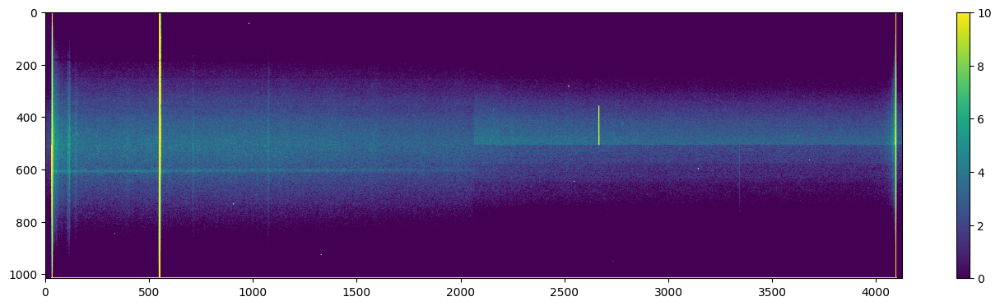

In [ ]:
basic_plot(min_zap, min = 0, max = 10)

In [ ]:
zap1 = min_zapping(datadir, 23, ['b.0035'])
zap2 = min_zapping(datadir, 23, ['b.0036'])

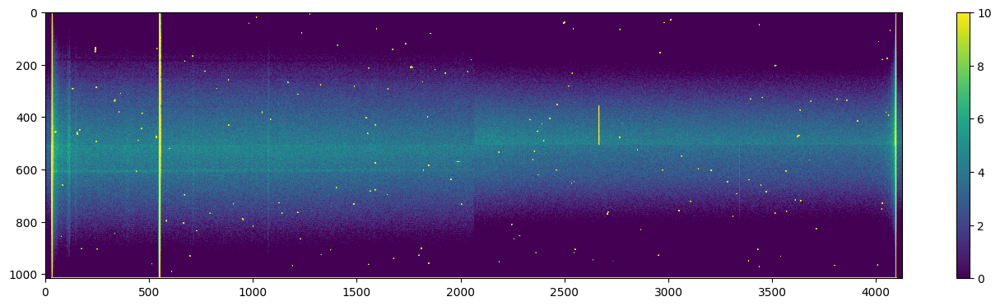

In [ ]:
basic_plot(zap1, min = 0, max = 10)

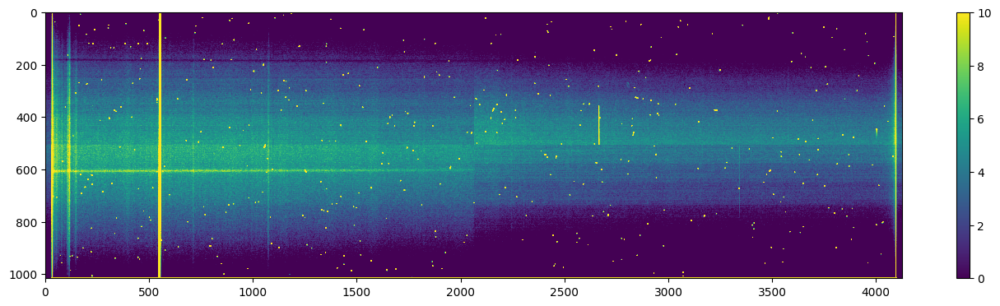

In [ ]:
basic_plot(zap2, min = 0, max = 10)

# Test Spectra Smoothing

In [ ]:
def smooth_spectrum(spectrum, len, length):
  smooth = np.zeros(length)
  i = 0
  while (i < length):
    avg = 0
    avg = np.mean(spectrum[i: (i + len)])
    for j in range(len):
      if ((i + j) < length):
        smooth[i+j] = avg
    i += len
  return smooth

In [ ]:
grism2 = min_zapping(datadir, 23, ['b.0043', 'b.0044'])
# plot_limits_size(grism2, min = 0, max = 20, ytop = 580, ybottom = 630,
#                  marker = False, markerx = 2055, markery = 610,
#                  markeralpha = 0.4, markersize = 15)
spectrum2 = grab_spectrum(np.flip(grism2, 1), 607, 611)
spectrum2 = spectrum2 / spectrum2[700:3000].max()

x = calibrate_wavelength_4th_order(spectrum2, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 5))
plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.3)
plt.xlabel('Wavelength (Angstroms)')

In [ ]:
spectrum2_smoothed = smooth_spectrum(spectrum2, 3, len(spectrum2))

In [ ]:
two_hbeta_v = fit_voigt_lin(spectrum2, x, 2500, 2750, poly4_params_aug23, h_beta, xmin = 4500, xmax = 5000)
print(two_hbeta_v[0], '+-', two_hbeta_v[1])

In [ ]:
two_hbeta_v = fit_voigt_lin(spectrum2_smoothed, x, 2500, 2750, poly4_params_aug23, h_beta, xmin = 4500, xmax = 5000)
print(two_hbeta_v[0], '+-', two_hbeta_v[1])

In [ ]:
two_hbeta_l = fit_lorentzian_lin(spectrum2_smoothed, x, 2500, 2750, poly4_params_aug23, h_beta, xmin = 4500, xmax = 5000)
print(two_hbeta_l[0], '+-', two_hbeta_l[1])

In [ ]:
x = calibrate_wavelength_4th_order(spectrum2, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 5))
plt.plot(x, spectrum2_smoothed / spectrum2_smoothed[700:3000].max(), linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.3)
plt.xlabel('Wavelength (Angstroms)')
plt.xlim(3500, 6000)

# GCC1

## With 23rd (Too Faint)

In [ ]:
# light1 = fit_to_array(datadir, 23, 'b.0033')
# overscan1 = subtract_overscan(light1)
# plot_limits_size(overscan1, min = 70, max = 130, marker = True, markerx = 2050, markery = 585, markeralpha = 0.5, markersize = 7)

In [ ]:
# light1 = fit_to_array(datadir, 25, 'b.0117')
# overscan1 = subtract_overscan(light1)
# plot_limits_size(overscan1, min = 70, max = 130, marker = False, markerx = 2050, markery = 585, markeralpha = 0.5, markersize = 7)

In [ ]:
# grism1 = fits_overscan_median(datadir, 23, ['b.0035', 'b.0036'])
# plot_limits_size(grism1, min = 0, max = 10)

In [ ]:
# grism1 = fits_overscan_median(datadir, 25, ['b.0119', 'b.0120'])
# plot_limits_size(grism1, min = 0, max = 10)

In [ ]:
# grism1_23 = zap_two_std(datadir, 23, ['b.0035', 'b.0036'])

In [ ]:
# plot_limits_size(grism1_23, min = 0, max = 10, ytop = 580, ybottom = 630, marker = False, markerx = 2050, markery = 585, markeralpha = 0.6, markersize = 7)

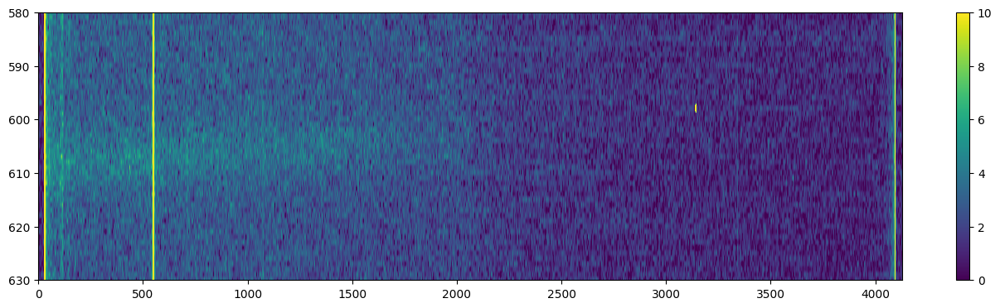

In [ ]:
grism1_23 = min_zapping(datadir, 23, ['b.0035', 'b.0036'])
plot_limits_size(grism1_23, min = 0, max = 10,
                 ytop = 580, ybottom = 630)

## Using 25th spectrum

### Bias, zap, scale pixels

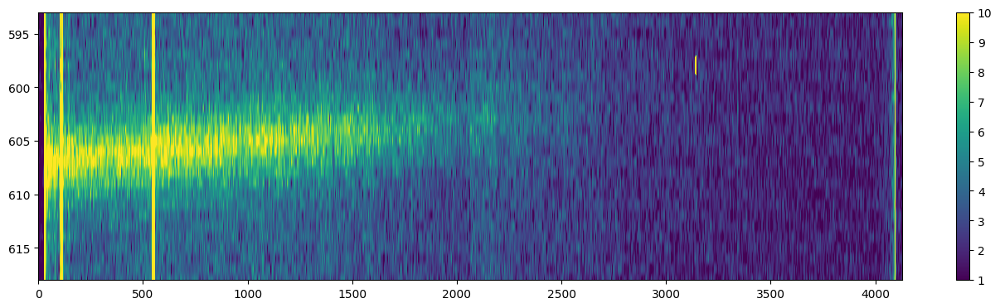

In [ ]:
grism1_25 = min_zapping(datadir, 25, ['b.0119', 'b.0120'])
plot_limits_size(grism1_25, min = 1, max = 10, ytop = 593, ybottom = 618)

In [ ]:
spectrum1_25 = grab_spectrum(np.flip(grism1_25, 1), 601, 609)
spectrum1_25 = spectrum1_25 / spectrum1_25[700:3000].max()

In [ ]:
x_pixels_25to23 = cal_wave_4auto(spectrum1_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum1_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum1_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

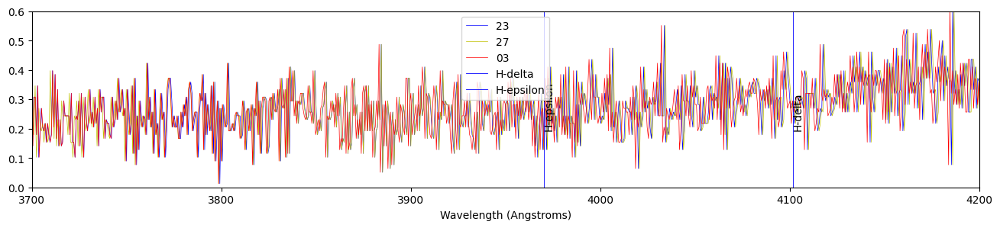

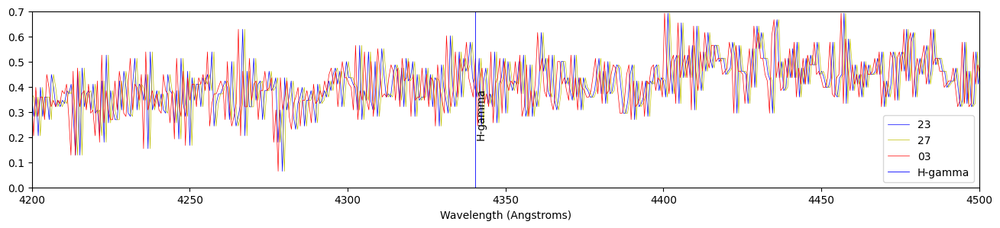

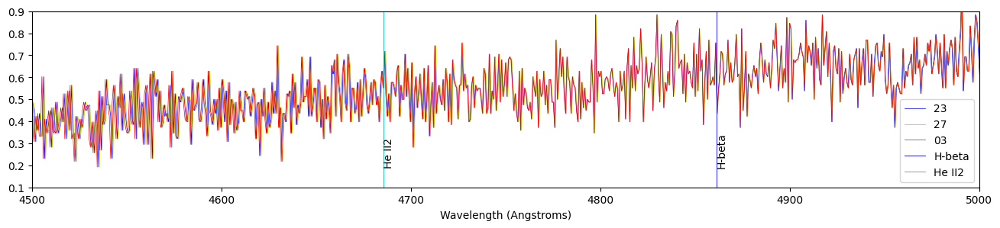

In [ ]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.6)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.7)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum1_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum1_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum1_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

### Calculate velocities

In [ ]:
# gcc1_25_23_hbeta =  fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
# # gcc1_25_23_hgamma = fit_lorentzian_lin_blackhawk(spectrum1_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_23_hdelta = fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
# popt_gcc1_25_23, covar_gcc1_25_23 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc1_25_23_hdelta[0], gcc1_25_23_hbeta[0]],
#                                             sigma = [gcc1_25_23_hdelta[1], gcc1_25_23_hbeta[1]])

# gcc1_25_27_hbeta =  fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
# # gcc1_25_27_hgamma = fit_lorentzian_lin_blackhawk(spectrum1_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_27_hdelta = fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=3900, xmax=4300)
# popt_gcc1_25_27, covar_gcc1_25_27 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc1_25_27_hdelta[0], gcc1_25_27_hgamma[0], gcc1_25_27_hbeta[0]],
#                                             sigma = [gcc1_25_27_hdelta[1], gcc1_25_27_hgamma[1], gcc1_25_27_hbeta[1]])

# gcc1_25_03_hbeta =  fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
# # gcc1_25_03_hgamma = fit_lorentzian_lin_blackhawk(spectrum1_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc1_25_03_hdelta = fit_lorentzian_quad_blackhawk(spectrum1_25, x_waves_25_from_03, 1400, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=3900, xmax=4300)
# popt_gcc1_25_03, covar_gcc1_25_03 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc1_25_03_hbeta[0]],
#                                             sigma = [gcc1_25_03_hbeta[1]])

## Print velocities

In [ ]:
# print('H-delta:', gcc1_25_23_hdelta[0], '+-', gcc1_25_23_hdelta[1])
# # print('H-gamma:', gcc1_25_23_hgamma[0], '+-', gcc1_25_23_hgamma[1])
# print('He II (2):', gcc1_25_23_HeII2[0], '+-', gcc1_25_23_HeII2[1])
# print('H-beta:', gcc1_25_23_hbeta[0], '+-', gcc1_25_23_hbeta[1])
# print('He II:', gcc1_25_23_HeII[0], '+-', gcc1_25_23_HeII[1])
# print(popt_gcc1_25_23, '+-', np.sqrt(covar_gcc1_25_23[0]))
# print('')
# print('H-delta:', gcc1_25_27_hdelta[0], '+-', gcc1_25_27_hdelta[1])
# # print('H-gamma:', gcc1_25_27_hgamma[0], '+-', gcc1_25_27_hgamma[1])
# print('He II (2):', gcc1_25_27_HeII2[0], '+-', gcc1_25_27_HeII2[1])
# print('H-beta:', gcc1_25_27_hbeta[0], '+-', gcc1_25_27_hbeta[1])
# print('He II:', gcc1_25_27_HeII[0], '+-', gcc1_25_27_HeII[1])
# print(popt_gcc1_25_27, '+-', np.sqrt(covar_gcc1_25_27[0]))
# print('')
# print('H-delta:', gcc1_25_03_hdelta[0], '+-', gcc1_25_03_hdelta[1])
# # print('H-gamma:', gcc1_25_03_hgamma[0], '+-', gcc1_25_03_hgamma[1])
# print('He II (2):', gcc1_25_03_HeII2[0], '+-', gcc1_25_03_HeII2[1])
# print('H-beta:', gcc1_25_03_hbeta[0], '+-', gcc1_25_03_hbeta[1])
# print('He II:', gcc1_25_03_HeII[0], '+-', gcc1_25_03_HeII[1])
# print(popt_gcc1_25_03, '+-', np.sqrt(covar_gcc1_25_03[0]))

# Old GCC 2 (ff)

## Flat Fielding

In [ ]:
a = grism2 / (flat_balanced_aug23)
# plot_limits_size(a, min = 0, max = 100, ytop = 590, ybottom = 625)
spectrum2_ff = grab_spectrum(a, 607, 611)
# plt.figure(figsize = (12, 3))
# plt.plot((spectrum2_ff / spectrum2_ff[100:500].max()), linewidth = 0.7, color = 'b')
# plt.ylim(-0.2, 1.2)

NameError: ignored

In [ ]:
cal_spec_plot(spectrum2, flat = flat_balanced_aug23)

NameError: ignored

In [ ]:
# x = calibrate_wavelength(spectrum2_ff, 2.43, 1580)
x = calibrate_wavelength(spectrum2_ff, 1.69, 5015)
plt.figure(figsize = (14, 5))
plt.plot(x, spectrum2_ff / spectrum2_ff[400:500].max(), linewidth = 0.8, color = 'g')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines()
# plt.xlim(4950, 8000)
# plt.xlim(5500, 7000)
# find telluric
plt.legend()

In [ ]:
a = grism2 / (flat_balanced_aug23)
# plot_limits_size(a, min = 0, max = 100, ytop = 590, ybottom = 625)
spectrum2_ff = grab_spectrum(a, 607, 611)
# plt.figure(figsize = (12, 3))
# plt.plot((spectrum2_ff / spectrum2_ff[100:500].max()), linewidth = 0.7, color = 'b')
# plt.ylim(-0.2, 1.2)

In [ ]:
x = calibrate_wavelength(spectrum2_ff, 1.69, 5015)
plt.figure(figsize = (14, 5))
plt.plot(x, spectrum2_ff / spectrum2_ff[400:500].max(), linewidth = 0.8, color = 'g')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines()
# plt.xlim(4950, 8000)
# plt.xlim(5500, 7000)
# find telluric
plt.legend()

In [ ]:
slit_norm2 = grism2 / (twilight_flat_aug23 / np.median(twilight_flat_aug23))

In [ ]:
# plot_limits_size(slit_norm2, min = 0, max = 20)

In [ ]:
spectrum2 = grab_spectrum(slit_norm2, 607, 611)
# plt.figure(figsize = (12, 3))
# plt.plot(spectrum2 / spectrum2[700:2000].max(), linewidth = 0.7, color = 'b')
# plt.ylim(-0.2, 1.2)

In [ ]:
mis_slit_norm2 = grism2 / (MIS_flat_aug23 / np.median(MIS_flat_aug23)) / (twilight_flat_aug23 / np.median(twilight_flat_aug23))

In [ ]:
# plot_limits_size(mis_slit_norm2, min = 0, max = 20)

In [ ]:
spectrum2 = grab_spectrum(mis_slit_norm2, 607, 611)
plt.figure(figsize = (14, 4))
plt.plot(spectrum2 / spectrum2[100:1000].max(), linewidth = 0.7, color = 'b')
plt.ylim(-0.2, 1.2)

# GCC2

## Bias, Zap, Calibrate

In [ ]:
grism2 = min_zapping(datadir, 23, ['b.0043', 'b.0044'])
# plot_limits_size(grism2, min = 10, max = 50, ytop = 600, ybottom = 615)
# grism2_rot = ndimage.rotate(grism2, -0.04, reshape = False)
# plot_limits_size(BD28_23, min = 500, max = 1000, xright = 2500, ytop = 595, ybottom = 620, figsizeheight=3)
# plot_limits_size(grism2_rot, min = 10, max = 50, ytop = 600, ybottom = 615)

In [ ]:
spectrum2 = grab_spectrum(np.flip(grism2, 1), 606, 611)
spectrum2 = spectrum2 / spectrum2[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum2, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
# plt.figure(figsize = (15, 5))
# plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(-0.1, 1.2)
# lines(3700, 5500)
# plt.xlim(3700, 5500)

## 5577 Green line

In [ ]:
green_params23_2, green_covar23_2 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum2[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# A, sigma, center, c, d
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_2_pixel = green_params23_2[2]
green_params23_2, green_covar23_2 = opt.curve_fit(Lorentzian_lin, np.arange(5570, 5580), spectrum2[3570: 3580], p0 = [0, 2, 5575, 0, 1])
green23_2_wave = green_params23_2[2]
print(green_params23_2, np.sqrt(green_covar23_2[2][2]))

[-6.51222414e+01  6.93886766e+00  5.57687638e+03 -2.30332667e-01
  1.27901301e+03] 2.197331937106561


(0.0, 4.0)

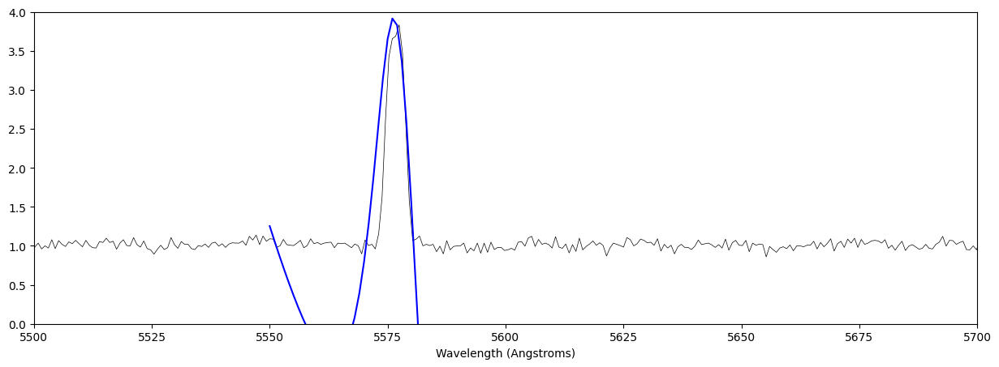

In [ ]:
plt.figure(figsize = (15, 5))
# plt.plot(spectrum2, linewidth = 0.5, color = 'k')
plt.plot(x, spectrum2, linewidth = 0.5, color = 'k')
# plt.plot(np.arange(3550, 3600), Lorentzian_lin(np.arange(3550, 3600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params23_2[0], green_params23_2[1], green_params23_2[2], green_params23_2[3], green_params23_2[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
# plt.xlim(3500, 3800)
# lines(5300, 5700)
plt.xlim(5500, 5700)
plt.ylim(0, 4)

In [ ]:
print(calc_velo(green23_2_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_2[2][2]), O_I))

-24.850835615315635 +- 118.11072948951036


## Velocities

In [ ]:
# plot_pix(spectrum2)

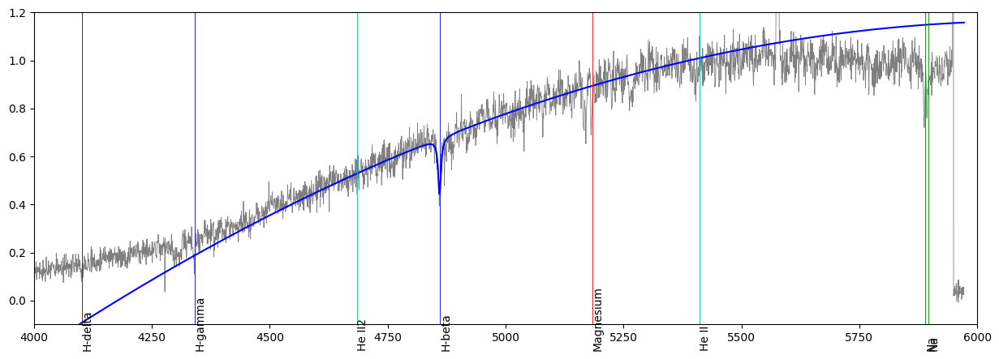

In [ ]:
aug2_heps = fit_lorentzian_lin(spectrum2, x, 1300, 1400, poly4_params_aug23, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = False)
# print(aug2_heps[0], '+-', aug2_heps[1])
aug2_hdelta = fit_lorentzian_lin(spectrum2, x, 1480, 1540, poly4_params_aug23, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = False)
# print(aug2_hdelta[0], '+-', aug2_hdelta[1])
aug2_hgamma = fit_lorentzian_lin(spectrum2, x, 1840, 1880, poly4_params_aug23, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = False)
# print(aug2_hgamma[0], '+-', aug2_hgamma[1])
aug2_hbeta = fit_lorentzian_quad(spectrum2, x, 2400, 2800, poly4_params_aug23, h_beta, xmin = 4000, xmax = 6000, ymax = 1.2, plot = True, figwidth=15, figheight=5)
# print(aug2_hbeta[0], '+-', aug2_hbeta[1])

In [ ]:
print('H-epsilon:', aug2_heps[0], '+-', aug2_heps[1])
print('H-delta:', aug2_hdelta[0], '+-', aug2_hdelta[1])
print('H-gamma:', aug2_hgamma[0], '+-', aug2_hgamma[1])
print('H-beta:', aug2_hbeta[0], '+-', aug2_hbeta[1])

# popt, covar = opt.curve_fit(const, np.linspace(0, 3, 4), [aug2_heps[0], aug2_hdelta[0], aug2_hgamma[0], aug2_hbeta[0]], sigma = [aug2_heps[1], aug2_hdelta[1], aug2_hgamma[1], aug2_hbeta[1]])
popt, covar = opt.curve_fit(const, np.linspace(0, 2, 3), [aug2_hdelta[0], aug2_hgamma[0], aug2_hbeta[0]], sigma = [aug2_hdelta[1], aug2_hgamma[1], aug2_hbeta[1]])
print(popt, '+-', np.sqrt(covar[0]))

H-epsilon: -101.48582642216542 +- 74.47291402390549
H-delta: -71.58301795451997 +- 19.778724607466174
H-gamma: -43.936611792330964 +- 20.27328139734184
H-beta: -80.46949267679513 +- 21.661136452392956
[-64.79623237] +- [10.92567277]


In [ ]:
print('H-epsilon:', aug2_heps[0], '+-', aug2_heps[1])
print('H-delta:', aug2_hdelta[0], '+-', aug2_hdelta[1])
print('H-gamma:', aug2_hgamma[0], '+-', aug2_hgamma[1])
print('H-beta:', aug2_hbeta[0], '+-', aug2_hbeta[1])
print(popt, '+-', np.sqrt(covar[0]))

H-epsilon: -101.48582642216542 +- 74.47291402390549
H-delta: -71.58301795451997 +- 19.778724607466174
H-gamma: -43.936611792330964 +- 20.27328139734184
H-beta: -80.46949267679513 +- 21.661136452392956
[-64.79623237] +- [10.92567277]


# GCC3

## Bias, zap, scale pixels

In [ ]:
grism3_25 = min_zapping(datadir, 25, ['b.0139', 'b.0140'])

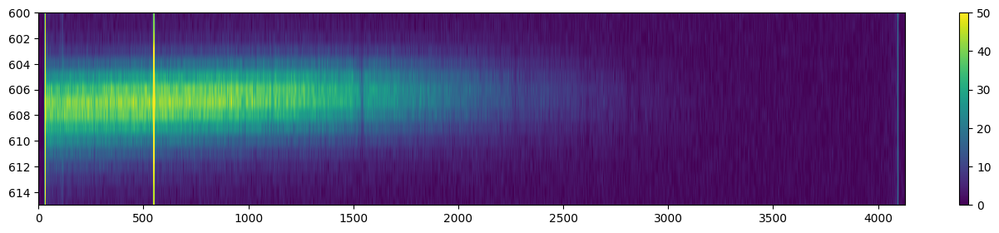

In [ ]:
plot_limits_size(grism3_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [ ]:
spectrum3_25 = grab_spectrum(np.flip(grism3_25, 1), 605, 610)
spectrum3_25 = spectrum3_25 / spectrum3_25[700:3000].max()

In [ ]:
x_pixels_25to23 = cal_wave_4auto(spectrum3_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum3_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum3_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

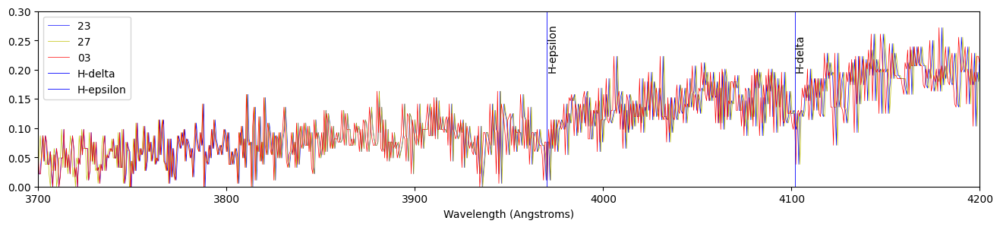

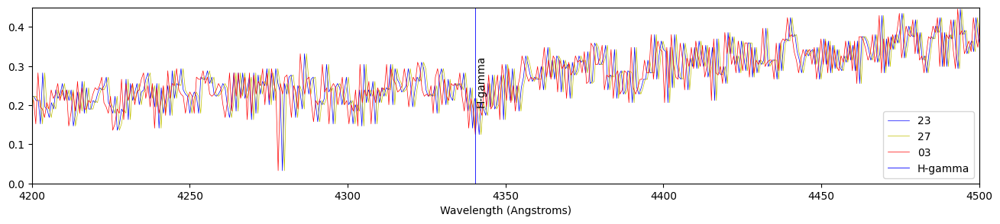

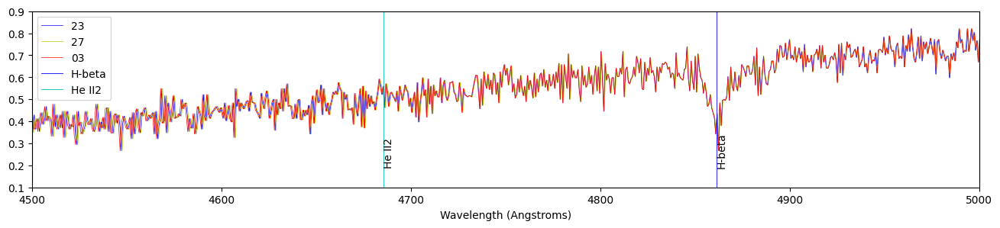

In [ ]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum3_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum3_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum3_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines that GCC3 has: hbeta, hgamma, hdelta, hepsilon

## Calculate velocities

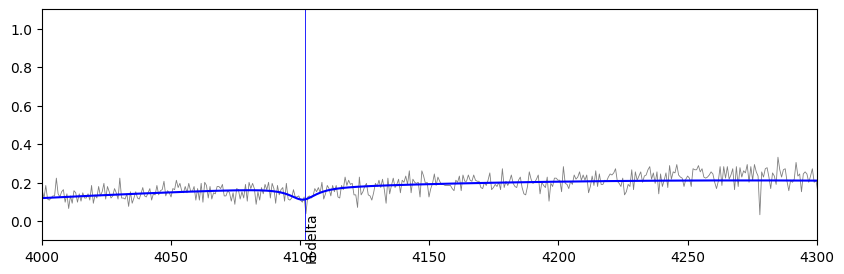

In [ ]:
gcc3_25_23_hbeta =  fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
gcc3_25_23_hgamma = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = False, xmin=4100, xmax=4600)
gcc3_25_23_hdelta = fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc3_25_23_hepsilon = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_23, covar_gcc3_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc3_25_23_hepsilon[0], gcc3_25_23_hdelta[0], gcc3_25_23_hgamma[0], #gcc3_25_23_HeII[0], gcc3_25_23_HeII2[0],
                                                                                gcc3_25_23_hbeta[0]],
                                            sigma = [gcc3_25_23_hepsilon[1], gcc3_25_23_hdelta[1], gcc3_25_23_hgamma[1], #gcc3_25_23_HeII[1], gcc3_25_23_HeII2[1],
                                                     gcc3_25_23_hbeta[1]])

gcc3_25_27_hbeta =  fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
gcc3_25_27_hgamma = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
gcc3_25_27_hdelta = fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4300)
gcc3_25_27_hepsilon = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_27, 1250, 1400, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_27, covar_gcc3_25_27 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc3_25_27_hepsilon[0], gcc3_25_27_hdelta[0], gcc3_25_27_hgamma[0], #gcc3_25_27_HeII[0], gcc3_25_27_HeII2[0],
                                                                                gcc3_25_27_hbeta[0]],
                                            sigma = [gcc3_25_27_hepsilon[1], gcc3_25_27_hdelta[1], gcc3_25_27_hgamma[1], #gcc3_25_27_HeII[1], gcc3_25_27_HeII2[1],
                                                     gcc3_25_27_hbeta[1]])

gcc3_25_03_hbeta =  fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
gcc3_25_03_hgamma = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = False)
gcc3_25_03_hdelta = fit_lorentzian_quad_blackhawk(spectrum3_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4300)
gcc3_25_03_hepsilon = fit_lorentzian_lin_blackhawk(spectrum3_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc3_25_03, covar_gcc3_25_03 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc3_25_03_hepsilon[0], gcc3_25_03_hdelta[0], gcc3_25_03_hgamma[0], #gcc3_25_03_HeII[0], gcc3_25_03_HeII2[0],
                                                                                gcc3_25_03_hbeta[0]],
                                            sigma = [gcc3_25_03_hepsilon[1], gcc3_25_03_hdelta[1], gcc3_25_03_hgamma[1], #gcc3_25_03_HeII[1], gcc3_25_03_HeII2[1],
                                                     gcc3_25_03_hbeta[1]])

## Print Velocities

In [ ]:
print('H-epsilon:',   gcc3_25_23_hepsilon[0], '+-', gcc3_25_23_hepsilon[1])
print('H-delta:',     gcc3_25_23_hdelta[0], '+-', gcc3_25_23_hdelta[1])
print('H-gamma:',     gcc3_25_23_hgamma[0], '+-', gcc3_25_23_hgamma[1])
print('H-beta:',      gcc3_25_23_hbeta[0], '+-',  gcc3_25_23_hbeta[1])
print(popt_gcc3_25_23, '+-', np.sqrt(covar_gcc3_25_23[0]))
print('')
print('H-epsilon:',   gcc3_25_27_hepsilon[0], '+-', gcc3_25_27_hepsilon[1])
print('H-delta:',     gcc3_25_27_hdelta[0], '+-', gcc3_25_27_hdelta[1])
print('H-gamma:',     gcc3_25_27_hgamma[0], '+-', gcc3_25_27_hgamma[1])
print('H-beta:',      gcc3_25_27_hbeta[0], '+-',  gcc3_25_27_hbeta[1])
print(popt_gcc3_25_27, '+-', np.sqrt(covar_gcc3_25_27[0]))
print('')
print('H-epsilon:',   gcc3_25_03_hepsilon[0], '+-', gcc3_25_03_hepsilon[1])
print('H-delta:', gcc3_25_03_hdelta[0], '+-', gcc3_25_03_hdelta[1])
print('H-gamma:', gcc3_25_03_hgamma[0], '+-', gcc3_25_03_hgamma[1])
print('H-beta:',    gcc3_25_03_hbeta[0], '+-',  gcc3_25_03_hbeta[1])
print(popt_gcc3_25_03, '+-', np.sqrt(covar_gcc3_25_03[0]))

H-epsilon: -7.332338728954656 +- 65.01040115136536
H-delta: 101.23154924921499 +- 57.92647364936461
H-gamma: 91.94458293079286 +- 54.993633345949576
H-beta: 27.913903983965913 +- 25.01073116972417
[41.99012026] +- [19.33521005]

H-epsilon: 20.616496816351365 +- 65.19280085634809
H-delta: 146.32670890160995 +- 58.00412077580083
H-gamma: 133.58835232481067 +- 54.936592275134544
H-beta: 42.968820643960534 +- 24.26438861943143
[64.62372189] +- [25.02013629]

H-epsilon: -7.332338728954656 +- 65.01040115136536
H-delta: -44.611958051859844 +- 90.48587914266689
H-gamma: 8.432371704464172 +- 55.10479381099432
H-beta: 30.337139074099593 +- 24.316420484634055
[19.71186787] +- [11.29869607]


It looks like h-beta is the most aligned among all spectrum calibrated with the 23rd, 27th, and 3rd. So we might want to only use that line.

# GCC4

## Bias, Zap, scale pixels

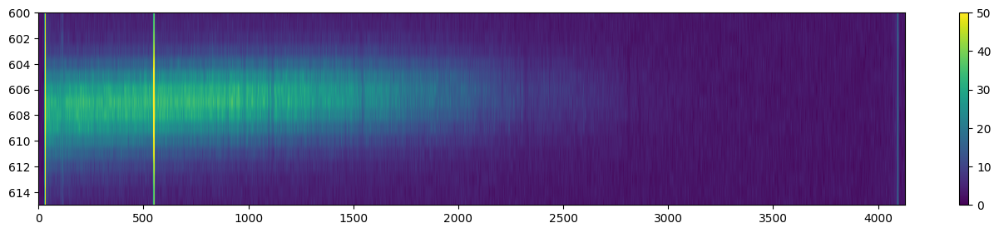

In [ ]:
grism4_25 = zap_median(datadir, 25, ['b.0143', 'b.0144', 'b.0145'])
plot_limits_size(grism4_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [ ]:
spectrum4_25 = grab_spectrum(np.flip(grism4_25, 1), 604, 611)
spectrum4_25 = spectrum4_25 / spectrum4_25[700:3000].max()

x_pixels_25to23 = cal_wave_4auto(spectrum4_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum4_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum4_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots

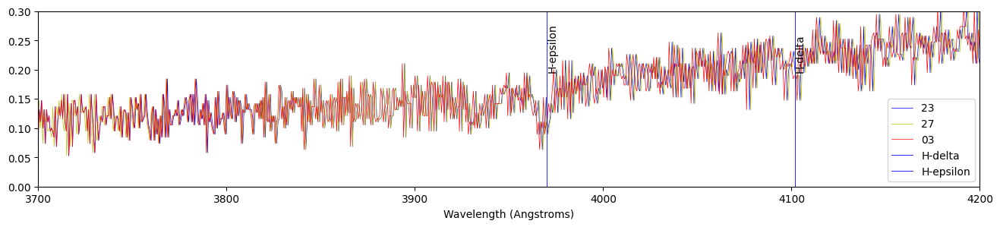

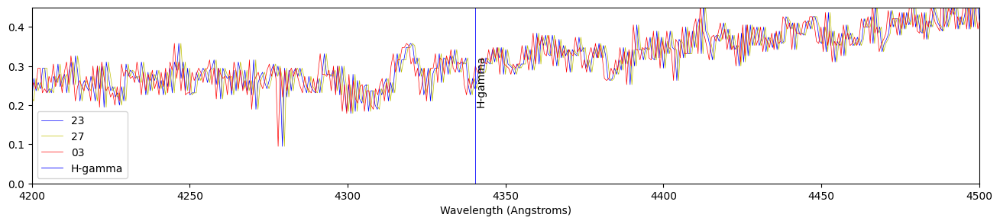

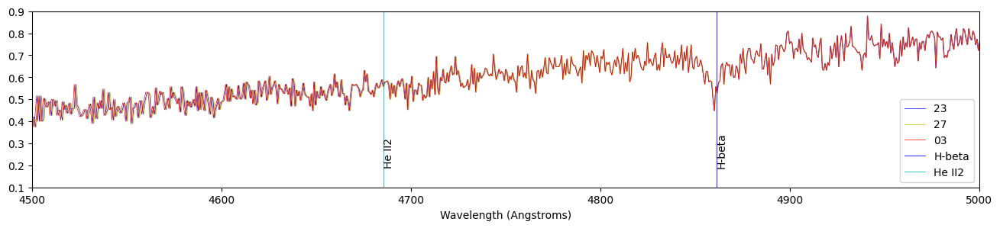

In [ ]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum4_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum4_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum4_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines that GCC4 has: hbeta, hgamma, hdelta, and hepsilon

## Calculate velocities

In [ ]:
gcc4_25_23_hbeta =    fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc4_25_23_hgamma =   fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_23, 1810, 1910, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
gcc4_25_23_hdelta =   fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_23, 1450, 1550, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc4_25_23_hepsilon = fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_23, 1250, 1350, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc4_25_23, covar_gcc4_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc4_25_23_hepsilon[0], gcc4_25_23_hdelta[0], #gcc4_25_23_hgamma[0],
                                                                                gcc4_25_23_hbeta[0]],
                                            sigma = [gcc4_25_23_hepsilon[1], gcc4_25_23_hdelta[1], #gcc4_25_23_hgamma[1],
                                                     gcc4_25_23_hbeta[1]])

gcc4_25_27_hbeta =  fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc4_25_27_hgamma = fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_27, 1810, 1910, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
gcc4_25_27_hdelta = fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_27, 1450, 1550, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4200)
gcc4_25_27_hepsilon = fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_27, 1250, 1350, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc4_25_27, covar_gcc4_25_27 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc4_25_27_hepsilon[0], gcc4_25_27_hdelta[0], #gcc4_25_27_hgamma[0],
                                                                                gcc4_25_27_hbeta[0]],
                                            sigma = [gcc4_25_27_hepsilon[1], gcc4_25_27_hdelta[1], #gcc4_25_27_hgamma[1],
                                                     gcc4_25_27_hbeta[1]])

gcc4_25_03_hbeta =  fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
# gcc4_25_03_hgamma = fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True, xmin=4000, xmax=4500)
gcc4_25_03_hdelta = fit_lorentzian_quad_blackhawk(spectrum4_25, x_waves_25_from_03, 1450, 1550, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4200)
gcc4_25_03_hepsilon = fit_lorentzian_lin_blackhawk(spectrum4_25, x_waves_25_from_03, 1250, 1400, poly4_params_oct03, params_pix_2503, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc4_25_03, covar_gcc4_25_03 = opt.curve_fit(const, np.linspace(0, 3, 4), [gcc4_25_03_hepsilon[0], gcc4_25_03_hdelta[0], #gcc4_25_03_hgamma[0],
                                                                                gcc4_25_03_hbeta[0]],
                                            sigma = [gcc4_25_03_hepsilon[1], gcc4_25_03_hdelta[1], #gcc4_25_03_hgamma[1],
                                                     gcc4_25_03_hbeta[1]])

## Print Velocities

In [ ]:
print('H-epsilon:',   gcc4_25_23_hepsilon[0], '+-', gcc4_25_23_hepsilon[1])
print('H-delta:',     gcc4_25_23_hdelta[0], '+-', gcc4_25_23_hdelta[1])
# print('H-gamma:',     gcc4_25_23_hgamma[0], '+-', gcc4_25_23_hgamma[1])
print('H-beta:',      gcc4_25_23_hbeta[0], '+-',  gcc4_25_23_hbeta[1])
print(popt_gcc4_25_23, '+-', np.sqrt(covar_gcc3_25_23[0]))
print('')
print('H-epsilon:',   gcc4_25_27_hepsilon[0], '+-', gcc4_25_27_hepsilon[1])
print('H-delta:',     gcc4_25_27_hdelta[0], '+-', gcc4_25_27_hdelta[1])
# print('H-gamma:',     gcc4_25_27_hgamma[0], '+-', gcc4_25_27_hgamma[1])
print('H-beta:',      gcc4_25_27_hbeta[0], '+-',  gcc4_25_27_hbeta[1])
print(popt_gcc4_25_27, '+-', np.sqrt(covar_gcc4_25_27[0]))
print('')
print('H-epsilon:',   gcc4_25_03_hepsilon[0], '+-', gcc4_25_03_hepsilon[1])
print('H-delta:', gcc4_25_03_hdelta[0], '+-', gcc4_25_03_hdelta[1])
# print('H-gamma:', gcc4_25_03_hgamma[0], '+-', gcc4_25_03_hgamma[1])
print('H-beta:',    gcc4_25_03_hbeta[0], '+-',  gcc4_25_03_hbeta[1])
print(popt_gcc4_25_03, '+-', np.sqrt(covar_gcc4_25_03[0]))

H-epsilon: -126.40684241615402 +- 44.55882048648963
H-delta: 45.22439306858173 +- 108.43027526431798
H-beta: -66.44193138502744 +- 29.32987171537718
[-78.26476404] +- [19.33521005]

H-epsilon: -98.79124657320436 +- 44.70245824533946
H-delta: 90.43908465303286 +- 108.53256958766701
H-beta: -39.81157531047112 +- 33.56720279642112
[-52.34345629] +- [31.64469096]

H-epsilon: -241.51132947193045 +- 41.95892349720234
H-delta: -68.32023394566947 +- 108.47821617033009
H-beta: -52.621253577495736 +- 33.637225442383944
[-123.30367287] +- [64.05019797]


# GCC 5

## Bias, zap, scale pixels

In [ ]:
# light5 = fit_to_array(datadir, 25, 'b.0146')
# light_overscan5 = subtract_overscan(light5)
# # plot_limits_size(light_overscan5, min = 40,
# #                  marker = True, markerx = 2065, markery = 585, markeralpha = 0.3)

In [ ]:
# slit5 = fit_to_array(datadir, 25, 'b.0147')
# slit_overscan5 = subtract_overscan(slit5)
# # plot_limits_size(slit_overscan5, min = 0, max = 40,
# #                  marker = True, markerx = 2065, markery = 585, markeralpha = 0.3)

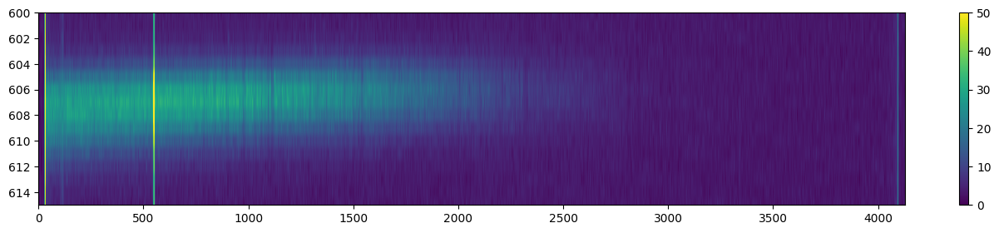

In [ ]:
grism5_25 = zap_median(datadir, 25, ['b.0148', 'b.0149', 'b.0150'])
plot_limits_size(grism5_25, min = 0, max = 50, ytop = 600, ybottom = 615, figsizeheight = 3)

In [ ]:
spectrum5_25 = grab_spectrum(np.flip(grism5_25, 1), 604, 611)
spectrum5_25 = spectrum5_25 / spectrum5_25[700:3000].max()

x_pixels_25to23 = cal_wave_4auto(spectrum5_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum5_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum5_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption line plots GCC5_25

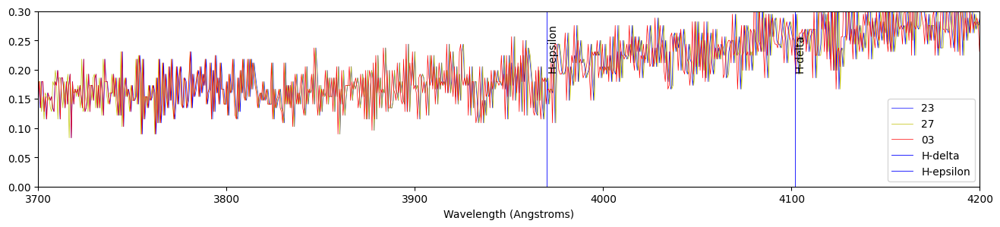

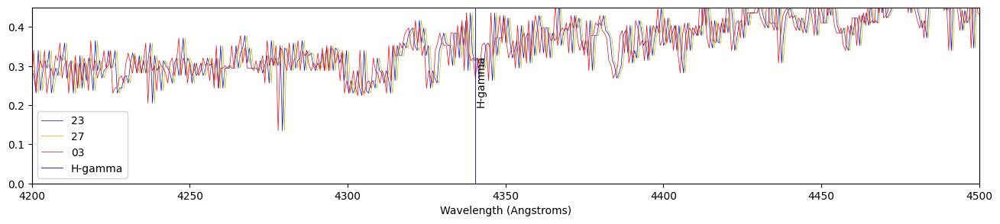

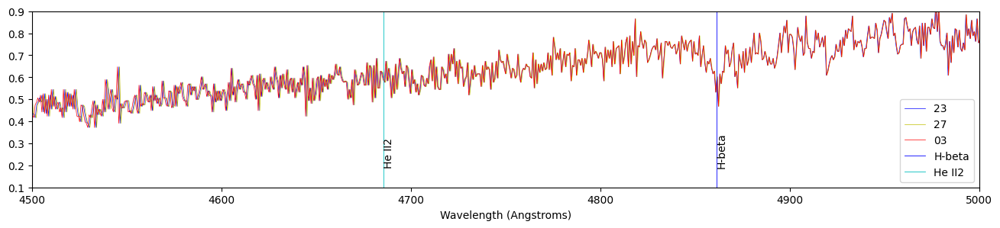

In [ ]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum5_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum5_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum5_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

Absorption lines GCC5 has: magnesium, hbeta, hgamma, hepsilon

## Calculate Velocities

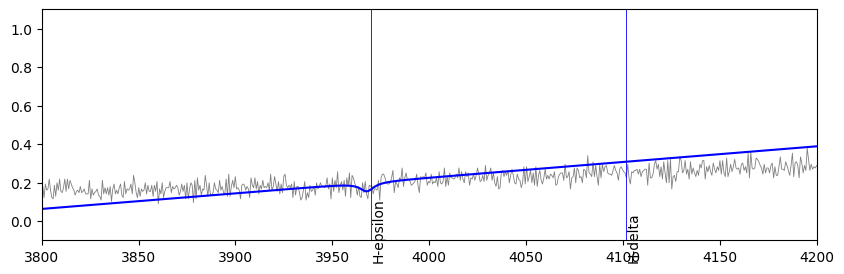

In [ ]:
gcc5_25_23_mag =      fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_23, 3020, 3080, poly4_params_aug23, params_pix_2523, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_23_hbeta =    fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_23, 2400, 2800, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc5_25_23_hgamma =   fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_23, 1810, 1910, poly4_params_aug23, params_pix_2523, h_gamma, plot = True, xmin=4100, xmax=4600)
# gcc5_25_23_hdelta =   fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc5_25_23_hepsilon = fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_23, 1250, 1350, poly4_params_aug23, params_pix_2523, h_epsilon, plot = True, xmin=3800, xmax=4200)
popt_gcc5_25_23, covar_gcc5_25_23 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_23_hepsilon[0], #gcc5_25_23_hdelta[0], gcc5_25_23_hgamma[0],
                                                                                gcc5_25_23_hbeta[0], gcc5_25_23_mag[0]],
                                            sigma = [gcc5_25_23_hepsilon[1], #gcc5_25_23_hdelta[1], gcc5_25_23_hgamma[1],
                                                     gcc5_25_23_hbeta[1], gcc5_25_23_mag[1]])

gcc5_25_27_mag =    fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_27, 3020, 3080, poly4_params_aug27, params_pix_2527, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_27_hbeta =  fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
# gcc5_25_27_hgamma = fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_27, 1810, 1910, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
# gcc5_25_27_hdelta = fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4200)
gcc5_25_27_hepsilon = fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_27, 1250, 1350, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc5_25_27, covar_gcc5_25_27 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_27_hepsilon[0], #gcc4_25_27_hdelta[0], gcc5_25_27_hgamma[0],
                                                                                gcc5_25_27_hbeta[0], gcc5_25_27_mag[0]],
                                            sigma = [gcc5_25_27_hepsilon[1], #gcc4_25_27_hdelta[1], gcc5_25_27_hgamma[1],
                                                     gcc5_25_27_hbeta[1], gcc5_25_27_mag[1]])

gcc5_25_03_mag =    fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_03, 3020, 3080, poly4_params_oct03, params_pix_2503, magnesium, plot = False, xmin=5000, xmax=5500)
gcc5_25_03_hbeta =  fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
# gcc4_25_03_hgamma = fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = True)
# gcc4_25_03_hdelta = fit_lorentzian_quad_blackhawk(spectrum5_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = True)
gcc5_25_03_hepsilon = fit_lorentzian_lin_blackhawk(spectrum5_25, x_waves_25_from_03, 1250, 1350, poly4_params_oct03, params_pix_2503, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc5_25_03, covar_gcc5_25_03 = opt.curve_fit(const, np.linspace(0, 2, 3), [gcc5_25_03_hepsilon[0], #gcc5_25_03_hdelta[0], gcc5_25_03_hgamma[0],
                                                                                gcc5_25_03_hbeta[0], gcc5_25_03_mag[0]],
                                            sigma = [gcc5_25_03_hepsilon[1], #gcc5_25_03_hdelta[1], gcc5_25_03_hgamma[1],
                                                                                gcc5_25_03_hbeta[1], gcc5_25_03_mag[1]])

## Print Velocities

In [ ]:
print('H-epsilon:',   gcc5_25_23_hepsilon[0], '+-', gcc5_25_23_hepsilon[1])
# print('H-delta:',     gcc5_25_23_hdelta[0], '+-', gcc5_25_23_hdelta[1])
# print('H-gamma:',     gcc5_25_23_hgamma[0], '+-', gcc5_25_23_hgamma[1])
print('H-beta:',      gcc5_25_23_hbeta[0], '+-',  gcc5_25_23_hbeta[1])
print('Magnesium:',   gcc5_25_23_mag[0], '+-',    gcc5_25_23_mag[1])
print(popt_gcc5_25_23, '+-', np.sqrt(covar_gcc5_25_23[0]))
print('')
print('H-epsilon:',   gcc5_25_27_hepsilon[0], '+-', gcc5_25_27_hepsilon[1])
# print('H-delta:',     gcc5_25_27_hdelta[0], '+-', gcc5_25_27_hdelta[1])
# print('H-gamma:',     gcc5_25_27_hgamma[0], '+-', gcc5_25_27_hgamma[1])
print('H-beta:',      gcc5_25_27_hbeta[0], '+-',  gcc5_25_27_hbeta[1])
print('Magnesium:',   gcc5_25_27_mag[0], '+-',    gcc5_25_27_mag[1])
print(popt_gcc5_25_27, '+-', np.sqrt(covar_gcc5_25_27[0]))
print('')
print('H-epsilon:',   gcc5_25_03_hepsilon[0], '+-', gcc5_25_03_hepsilon[1])
# print('H-delta:', gcc4_25_03_hdelta[0], '+-', gcc4_25_03_hdelta[1])
# print('H-gamma:', gcc4_25_03_hgamma[0], '+-', gcc4_25_03_hgamma[1])
print('H-beta:',    gcc5_25_03_hbeta[0], '+-',  gcc5_25_03_hbeta[1])
print('Magnesium:',    gcc5_25_03_mag[0], '+-',  gcc5_25_03_mag[1])
print(popt_gcc5_25_03, '+-', np.sqrt(covar_gcc5_25_03[0]))

H-epsilon: -168.40339815022264 +- 117.23110387945617
H-beta: 53.280895233130444 +- 39.756403150113755
Magnesium: 11.11112740707841 +- 16.675392130382846
[14.27685545] +- [19.95776126]

H-epsilon: -140.96661211041373 +- 117.49749198445971
H-beta: 69.2780952166335 +- 39.744209937438086
Magnesium: 24.49933919798272 +- 16.668410642800627
[28.30043017] +- [19.25002702]

H-epsilon: -275.7458772486559 +- 116.891053152392
H-beta: 56.71825787144635 +- 39.84111780629403
Magnesium: 46.62299956149856 +- 16.70572584892428
[42.60247604] +- [29.776042]


# GCC6 23

In [ ]:
# light6_1 = fit_to_array(datadir, 23, 'b.0037')
# light_overscan6 = subtract_overscan(light6_1)
# plot_limits_size(light_overscan6, min = 70, max = 150,
#                  marker = True, markerx = 2240, markery = 600, markeralpha = 0.3)

In [ ]:
# slit6_1 = fit_to_array(datadir, 23, 'b.0038')
# slit_overscan6_1 = subtract_overscan(slit6_1)
# plot_limits_size(slit_overscan6_1, min = 0, max = 40)

In [ ]:
grism6_23 = fits_overscan_median(datadir, 23, ['b.0039', 'b.0040'])
# plot_limits_size(grism6_23, min = 0, max = 10, marker = True, markerx = 2240, markery = 600, markeralpha = 0.3)

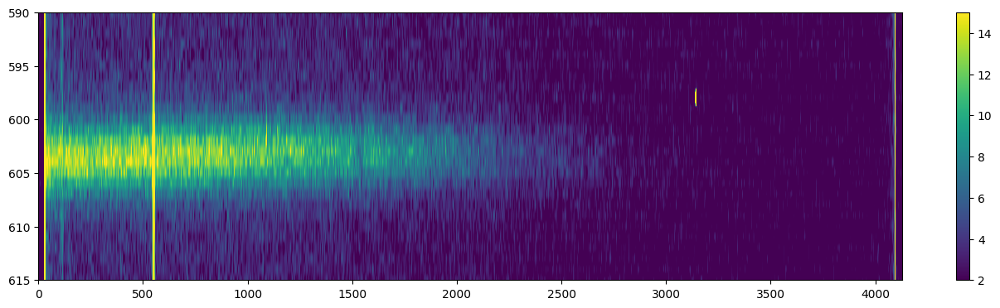

In [ ]:
grism6_23 = min_zapping(datadir, 23, ['b.0039', 'b.0040'])
# plot_limits_size(grism6_23, min = 0, max = 10)
plot_limits_size(grism6_23, min = 2, max = 15, ytop = 590, ybottom = 615)

(3700.0, 5500.0)

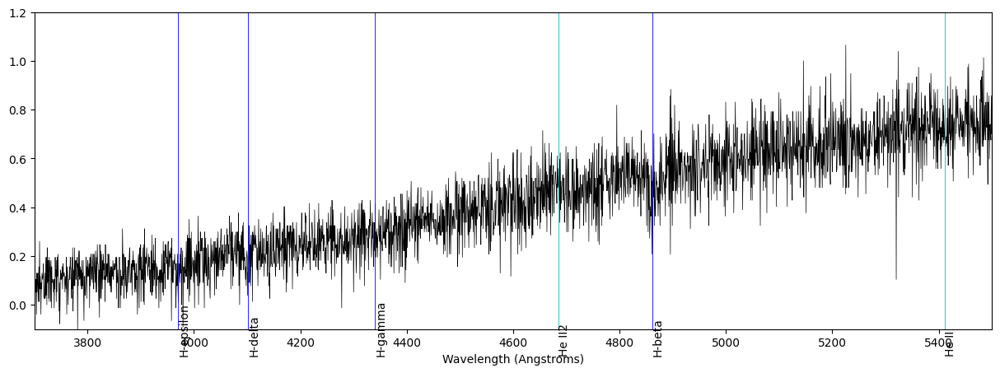

In [ ]:
spectrum6_23 = grab_spectrum(np.flip(grism6_23, 1), 602, 607)
spectrum6_23 = spectrum6_23 / spectrum6_23[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum6_23, poly4_params_aug23[0], poly4_params_aug23[1], poly4_params_aug23[2], poly4_params_aug23[3], poly4_params_aug23[4])
plt.figure(figsize = (15, 5))
plt.plot(x, spectrum6_23, linewidth = 0.5, color = 'k')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 5500)
plt.xlim(3700, 5500)

In [ ]:
# plot_pix(spectrum6_23, xmin = 1250, xmax = 1400)
# plt.xticks(np.linspace(1250, 1400, 7))

-297.9482705671818 +- 19.11778461468616
-99.2782238608746 +- 170.1748867569269
-199.83397401451163 +- 23.414355082483155
98.82232825057257 +- 177.1864917566303


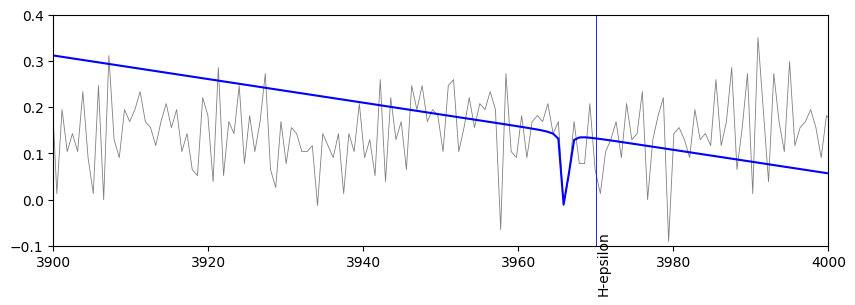

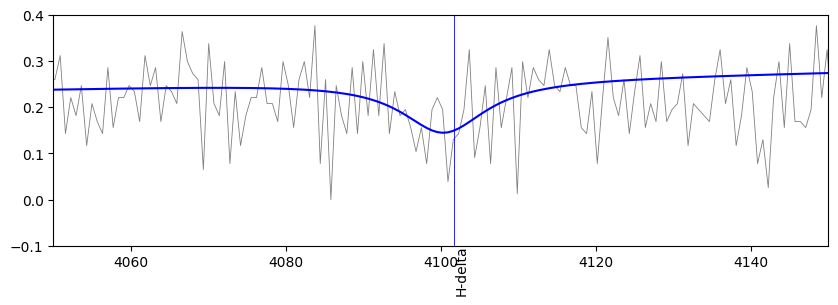

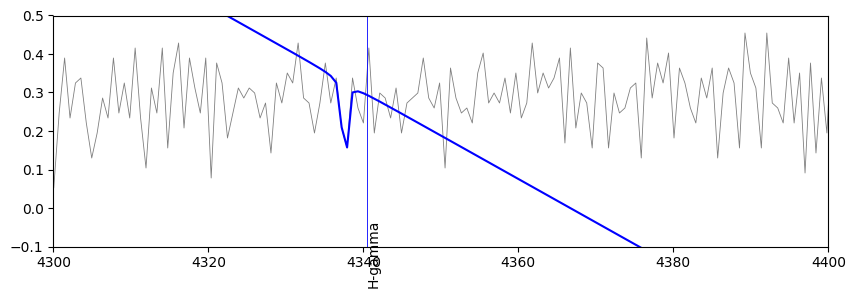

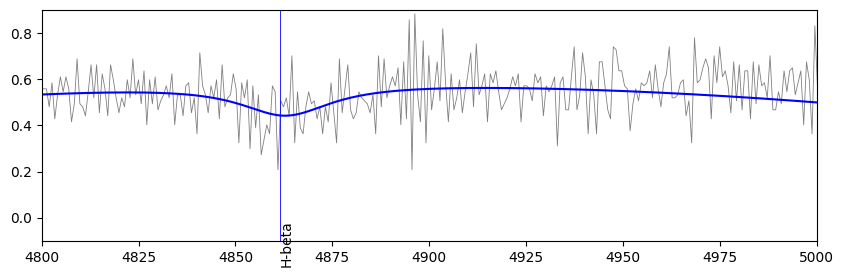

In [ ]:
aug6_23_heps = fit_lorentzian_lin(spectrum6_23, x, 1295, 1335, poly4_params_aug23, h_epsilon, xmin = 3900, xmax = 4000, ymax = 0.4, plot = True)
print(aug6_23_heps[0], '+-', aug6_23_heps[1])
aug6_23_hdelta = fit_lorentzian_lin(spectrum6_23, x, 1490, 1530, poly4_params_aug23, h_delta, xmin = 4050, xmax = 4150, ymax = 0.4, plot = True)
print(aug6_23_hdelta[0], '+-', aug6_23_hdelta[1])
aug6_23_hgamma = fit_lorentzian_lin(spectrum6_23, x, 1850, 1860, poly4_params_aug23, h_gamma, xmin = 4300, xmax = 4400, ymax = 0.5, plot = True)
print(aug6_23_hgamma[0], '+-', aug6_23_hgamma[1])
aug6_23_hbeta = fit_lorentzian_quad(spectrum6_23, x, 2400, 2700, poly4_params_aug23, h_beta, xmin = 4800, xmax = 5000, ymax = 0.9, plot = True)
print(aug6_23_hbeta[0], '+-', aug6_23_hbeta[1])

# GCC6 25

## Bias, zap, scale pixels

In [ ]:
# light6_2 = fit_to_array(datadir, 25, 'b.0133')
# light_overscan6 = subtract_overscan(light6_2)
# plot_limits_size(light_overscan6, min = 60, max = 130,
#                  marker = True, markerx = 2190, markery = 530, markeralpha = 0.3)

In [ ]:
# slit6_2 = fit_to_array(datadir, 25, 'b.0134')
# slit_overscan6_2 = subtract_overscan(slit6_2)
# plot_limits_size(slit_overscan6_2, min = 0, max = 40)

In [ ]:
# grism6_25 = fits_overscan_median(datadir, 25, ['b.0135', 'b.0136'])
# plot_limits_size(grism6_25, min = 0, max = 10)

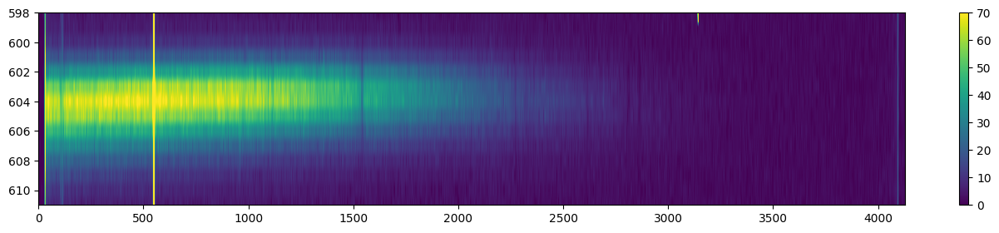

In [ ]:
grism6_25 = min_zapping(datadir, 25, ['b.0135', 'b.0136'])
plot_limits_size(grism6_25, min = 0, max = 70, ytop = 598, ybottom = 611, figsizeheight = 3)

In [ ]:
spectrum6_25 = grab_spectrum(np.flip(grism6_25, 1), 600, 608)
spectrum6_25 = spectrum6_25 / spectrum6_25[700:3000].max()

In [ ]:
x_pixels_25to23 = cal_wave_4auto(spectrum6_25, params_pix_2523)
x_pixels_25to27 = cal_wave_4auto(spectrum6_25, params_pix_2527)
x_pixels_25to03 = cal_wave_4auto(spectrum6_25, params_pix_2503)

x_waves_25_from_23 = cal_wave_4auto_range(x_pixels_25to23, poly4_params_aug23)
x_waves_25_from_27 = cal_wave_4auto_range(x_pixels_25to27, poly4_params_aug27)
x_waves_25_from_03 = cal_wave_4auto_range(x_pixels_25to03, poly4_params_oct03)

## Absorption lines plots

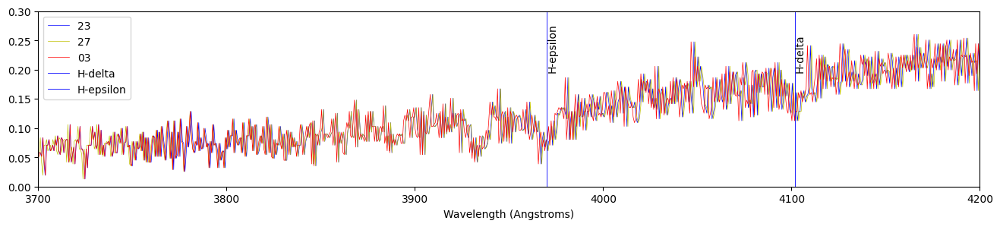

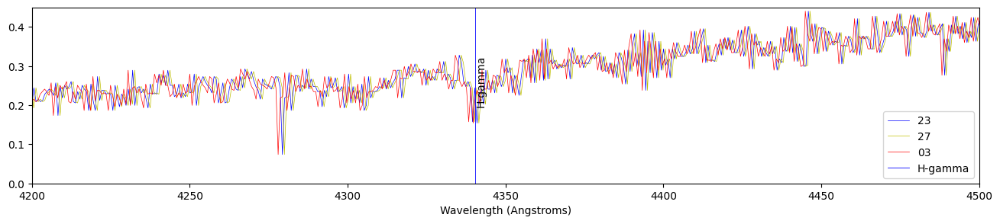

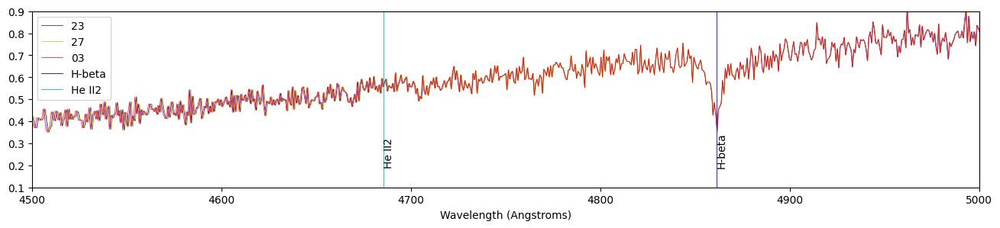

In [ ]:
plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(3700, 4200, 0.2)
plt.xlim(3700, 4200)
plt.ylim(0.0, 0.3)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4200, 4500, 0.2)
plt.xlim(4200, 4500)
plt.ylim(0.0, 0.45)
plt.legend()

plt.figure(figsize = (16, 3))
plt.plot(x_waves_25_from_23, spectrum6_25, linewidth = 0.5, color = 'b', label='23')
plt.plot(x_waves_25_from_27, spectrum6_25, linewidth = 0.5, color = 'y', label='27')
plt.plot(x_waves_25_from_03, spectrum6_25, linewidth = 0.5, color = 'r', label='03')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(-0.1, 1.2)
lines(4500, 5000, 0.2)
plt.xlim(4500, 5000)
plt.ylim(0.1, 0.9)
plt.legend()

## Calculate Velocities

In [ ]:
gcc6_25_23_mag =    fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_23, 3020, 3080, poly4_params_aug23, params_pix_2523, magnesium, plot = False, xmin=5000, xmax=5500)
gcc6_25_23_hbeta =  fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_23, 2500, 2700, poly4_params_aug23, params_pix_2523, h_beta, plot = False, xmin=4700, xmax=5100)
gcc6_25_23_hgamma = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_23, 1780, 1950, poly4_params_aug23, params_pix_2523, h_gamma, plot = False, xmin=4100, xmax=4600)
gcc6_25_23_hdelta = fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_23, 1400, 1600, poly4_params_aug23, params_pix_2523, h_delta, plot = False, xmin=3900, xmax=4300) # 1200, 1700
gcc6_25_23_hepsilon = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc6_25_23, covar_gcc6_25_23 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_23_hepsilon[0], gcc6_25_23_hdelta[0], gcc6_25_23_hgamma[0],
                                                                                gcc6_25_23_hbeta[0], gcc6_25_23_mag[0]],
                                            sigma = [gcc6_25_23_hepsilon[1], gcc6_25_23_hdelta[1], gcc6_25_23_hgamma[1],
                                                     gcc6_25_23_hbeta[1], gcc6_25_23_mag[1]])

gcc6_25_27_mag =    fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_27, 3020, 3080, poly4_params_aug27, params_pix_2527, magnesium, plot = False, xmin=5000, xmax=5500)
gcc6_25_27_hbeta =  fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_27, 2400, 2800, poly4_params_aug27, params_pix_2527, h_beta, plot = False, xmin=4700, xmax=5100)
gcc6_25_27_hgamma = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_27, 1780, 1950, poly4_params_aug27, params_pix_2527, h_gamma, plot = False, xmin=3900, xmax=4300)
gcc6_25_27_hdelta = fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_27, 1400, 1600, poly4_params_aug27, params_pix_2527, h_delta, plot = False, xmin=4000, xmax=4300)
gcc6_25_27_hepsilon = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_27, 1250, 1400, poly4_params_aug27, params_pix_2527, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc6_25_27, covar_gcc6_25_27 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_27_hepsilon[0], gcc3_25_27_hdelta[0], gcc3_25_27_hgamma[0],
                                                                                gcc6_25_27_hbeta[0], gcc6_25_27_mag[0]],
                                            sigma = [gcc6_25_27_hepsilon[1], gcc6_25_27_hdelta[1], gcc6_25_27_hgamma[1],
                                                     gcc6_25_27_hbeta[1], gcc6_25_27_mag[1]])

gcc6_25_03_mag =    fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_03, 3020, 3080, poly4_params_oct03, params_pix_2503, magnesium, plot = False, xmin=5000, xmax=5500)
gcc6_25_03_hbeta =  fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_03, 2400, 2800, poly4_params_oct03, params_pix_2503, h_beta, plot = False)
gcc6_25_03_hgamma = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_03, 1780, 1950, poly4_params_oct03, params_pix_2503, h_gamma, plot = False)
gcc6_25_03_hdelta = fit_lorentzian_quad_blackhawk(spectrum6_25, x_waves_25_from_03, 1300, 1700, poly4_params_oct03, params_pix_2503, h_delta, plot = False, xmin=4000, xmax=4300)
gcc6_25_03_hepsilon = fit_lorentzian_lin_blackhawk(spectrum6_25, x_waves_25_from_23, 1250, 1400, poly4_params_aug23, params_pix_2523, h_epsilon, plot = False, xmin=3800, xmax=4200)
popt_gcc6_25_03, covar_gcc6_25_03 = opt.curve_fit(const, np.linspace(0, 4, 5), [gcc6_25_03_hepsilon[0], gcc6_25_03_hdelta[0], gcc6_25_03_hgamma[0],
                                                                                gcc6_25_03_hbeta[0], gcc6_25_03_mag[0]],
                                            sigma = [gcc6_25_03_hepsilon[1], gcc6_25_03_hdelta[1], gcc6_25_03_hgamma[1],
                                                     gcc6_25_03_hbeta[1], gcc6_25_03_mag[1]])

## Print Velocities

In [ ]:
print('H-epsilon:',   gcc6_25_23_hepsilon[0], '+-', gcc6_25_23_hepsilon[1])
print('H-delta:',     gcc6_25_23_hdelta[0], '+-',   gcc6_25_23_hdelta[1])
print('H-gamma:',     gcc6_25_23_hgamma[0], '+-',   gcc6_25_23_hgamma[1])
print('H-beta:',      gcc6_25_23_hbeta[0], '+-',    gcc6_25_23_hbeta[1])
print('Magnesium:',   gcc6_25_23_mag[0], '+-',      gcc6_25_23_mag[1])
print(popt_gcc6_25_23, '+-', np.sqrt(covar_gcc6_25_23[0]))
print('')
print('H-epsilon:',   gcc6_25_27_hepsilon[0], '+-', gcc6_25_27_hepsilon[1])
print('H-delta:',     gcc6_25_27_hdelta[0], '+-',   gcc6_25_27_hdelta[1])
print('H-gamma:',     gcc6_25_27_hgamma[0], '+-',   gcc6_25_27_hgamma[1])
print('H-beta:',      gcc6_25_27_hbeta[0], '+-',    gcc6_25_27_hbeta[1])
print('Magnesium:',   gcc6_25_27_mag[0], '+-',      gcc6_25_27_mag[1])
print(popt_gcc6_25_27, '+-', np.sqrt(covar_gcc6_25_27[0]))
print('')
print('H-epsilon:',   gcc6_25_03_hepsilon[0], '+-', gcc6_25_03_hepsilon[1])
print('H-delta:',     gcc6_25_03_hdelta[0], '+-',   gcc6_25_03_hdelta[1])
print('H-gamma:',     gcc6_25_03_hgamma[0], '+-',   gcc6_25_03_hgamma[1])
print('H-beta:',      gcc6_25_03_hbeta[0], '+-',    gcc6_25_03_hbeta[1])
print('Magnesium:',   gcc6_25_03_mag[0], '+-',      gcc6_25_03_mag[1])
print(popt_gcc6_25_03, '+-', np.sqrt(covar_gcc6_25_03[0]))

H-epsilon: -42.20224371572005 +- 61.051749597254556
H-delta: 65.51385700235132 +- 63.535185882985495
H-gamma: 30.781709884935953 +- 29.824347583247096
H-beta: 7.637845741598863 +- 16.36115327551899
Magnesium: 0.7352587374903881 +- 18.650450420024494
[8.50331212] +- [8.21857423]

H-epsilon: -14.36024781756428 +- 61.23826969220987
H-delta: 110.59556437277553 +- 63.592467710701655
H-gamma: 72.48078845370813 +- 29.802184508790166
H-beta: 29.351054402151444 +- 18.645938585902122
Magnesium: 14.128876567261184 +- 18.64475500373259
[41.63909735] +- [23.02479648]

H-epsilon: -42.20224371572005 +- 61.051749597254556
H-delta: -47.43919622610796 +- 69.53298812479377
H-gamma: -52.84750653603489 +- 29.90815964622128
H-beta: 16.692123655060584 +- 18.685769585316415
Magnesium: 36.2282995898118 +- 18.68451609021182
[9.7472632] +- [16.45268509]


# Oct GC 1

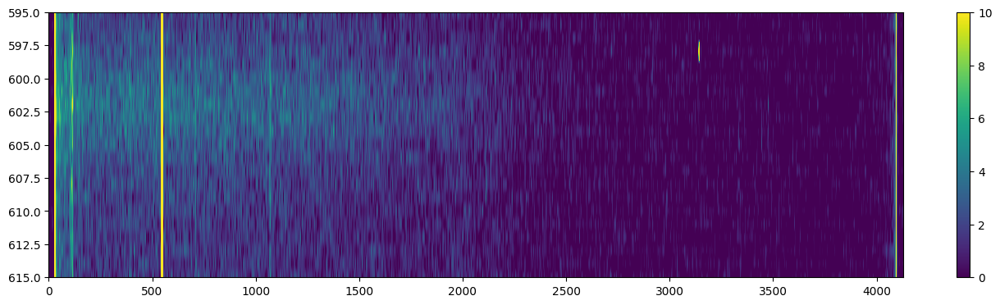

In [ ]:
zap_1_oct03 = min_zapping(octdir, '03', ['b.0221', 'b.0223'], yearmonth = 2310)
plot_limits_size(zap_1_oct03, min = 0, max = 10, ytop = 595, ybottom = 615)

(3500.0, 6000.0)

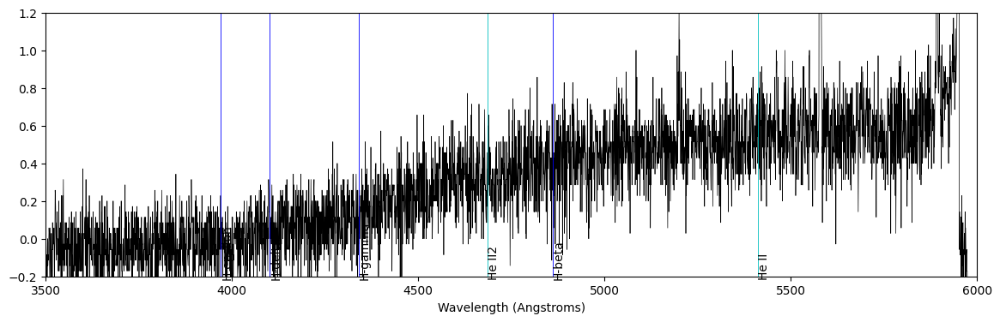

In [ ]:
spectrum1_oct = grab_spectrum(np.flip(zap_1_oct03, 1), 599, 605)
spectrum1_oct = spectrum1_oct / spectrum1_oct[700: 3000].max()
x = calibrate_wavelength_4th_order(spectrum1_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
plt.figure(figsize = (14, 4))
plt.plot(x, spectrum1_oct / spectrum1_oct[700:3000].max(), linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines()
plt.xlim(3500, 6000)

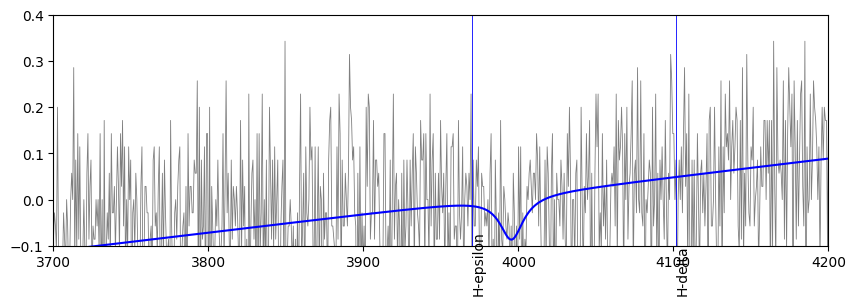

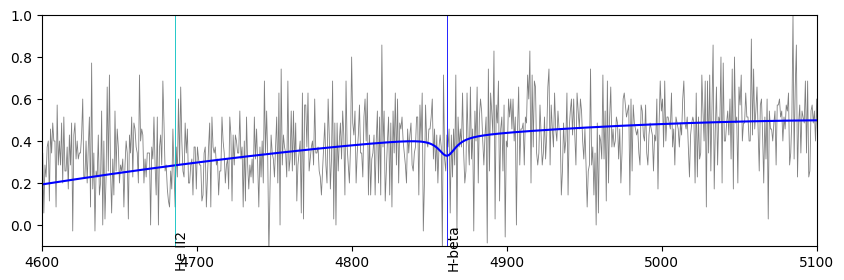

In [ ]:
# plot_pix(spectrum3_oct)
oct1_heps = fit_lorentzian_lin(spectrum1_oct, x, 1300, 1400, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
# oct1_hdelta = fit_lorentzian_lin(spectrum1_oct, x, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
# oct1_hgamma = fit_lorentzian_lin(spectrum1_oct, x, 1840, 1880, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct1_hbeta = fit_lorentzian_quad(spectrum1_oct, x, 2400, 2700, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5100, ymax = 1, plot = True)
# print(oct3_hbeta[0], '+-', oct3_hbeta[1])
# oct3_hbeta = fit_lorentzian_lin(spectrum3_oct, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct3_hbeta[0], '+-', oct3_hbeta[1])

In [ ]:
print('H-epsilon:', oct1_heps[0], '+-', oct1_heps[1])
# print('H-delta:', oct1_hdelta[0], '+-', oct1_hdelta[1])
# print('H-gamma:', oct1_hgamma[0], '+-', oct1_hgamma[1])
print('H-beta:', oct1_hbeta[0], '+-', oct1_hbeta[1])

# popt_oct1, covar_oct1 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct1_heps[0], oct1_hdelta[0], oct1_hgamma[0], oct1_hbeta[0]], sigma = [oct1_heps[1], oct1_hdelta[1], oct1_hgamma[1], oct1_hbeta[1]])
# print(popt_oct1, '+-', np.sqrt(covar_oct1[0]))

H-epsilon: 1930.706633910363 +- 300.1071084312095
H-beta: 6.431684521472261 +- 309.431179321505


# Oct GC 2

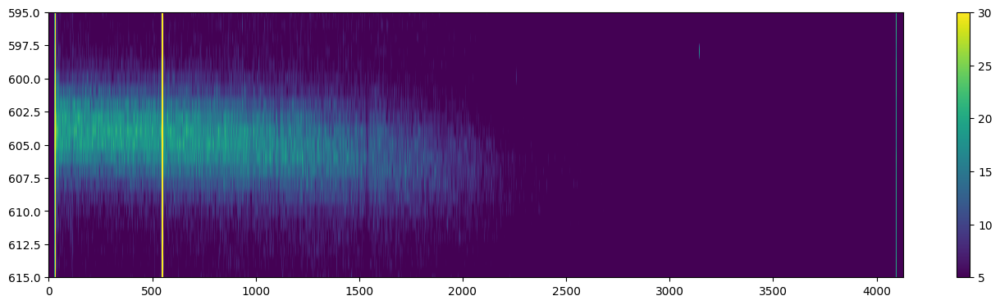

In [ ]:
zap_2_oct03 = min_zapping(octdir, '03', ['b.0232', 'b.0234'], yearmonth = 2310)
plot_limits_size(zap_2_oct03, min = 5, max = 30, ytop = 595, ybottom = 615)

(3800.0, 5600.0)

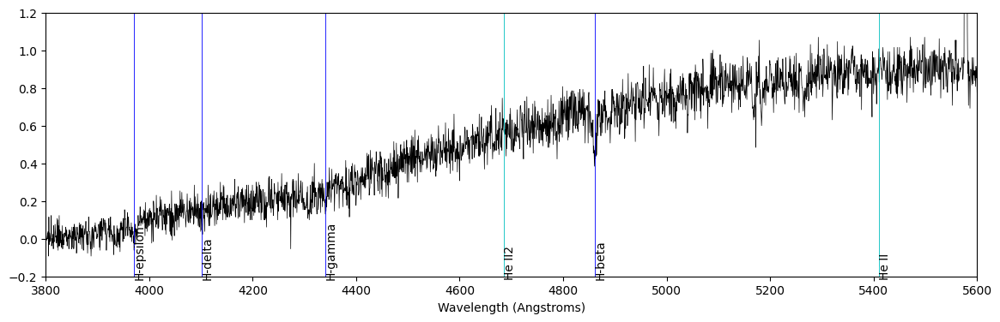

In [ ]:
spectrum2_oct = grab_spectrum(np.flip(zap_2_oct03, 1), 602, 610)
spectrum2_oct = spectrum2_oct / spectrum2_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum2_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
plt.figure(figsize = (14, 4))
plt.plot(x, spectrum2_oct, linewidth = 0.5, color = 'k')
plt.ylim(-0.2, 1.2)
plt.xlabel('Wavelength (Angstroms)')
lines(xmin = 3800, xmax = 5600)
plt.xlim(3800, 5600)

In [ ]:
green_params03_2, green_covar03_2 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum2_oct[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# A, sigma, center, c, d
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green03_2_pixel = green_params03_2[2]
green_params03_2, green_covar03_2 = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), spectrum2_oct[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green03_2_wave = green_params03_2[2]
print(green_params03_2, np.sqrt(green_covar03_2[2][2]))

[-1.95631651e+01  2.47176313e+00  5.57677171e+03 -4.80140273e-02
  2.67546048e+02] 0.12079401646478784


In [ ]:
print(calc_velo(green_params03_2[2], O_I))

-30.477032551048097


In [ ]:
# plt.figure(figsize = (15, 3))
# plt.plot(x, spectrum2_oct, linewidth = 0.5, color = 'k')
# plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params03_2[0], green_params03_2[1], green_params03_2[2], green_params03_2[3], green_params03_2[4]), color = 'b')
# plt.xlabel('Wavelength (Angstroms)')
# plt.ylim(0, 9)
# # plt.xlim(3500, 3800)
# # lines(5300, 5700)
# plt.xlim(5550, 5600)

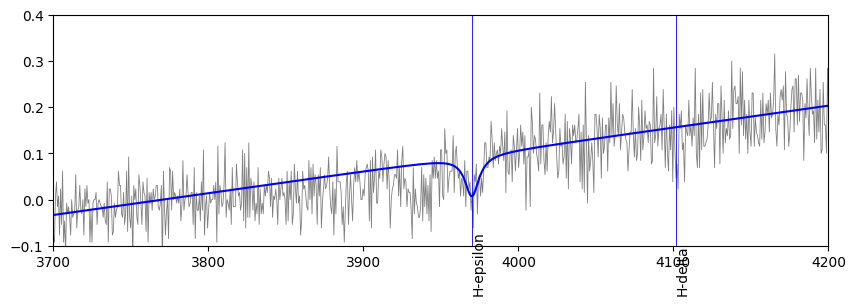

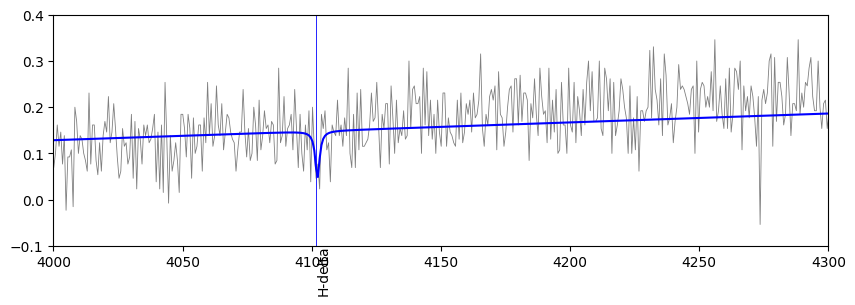

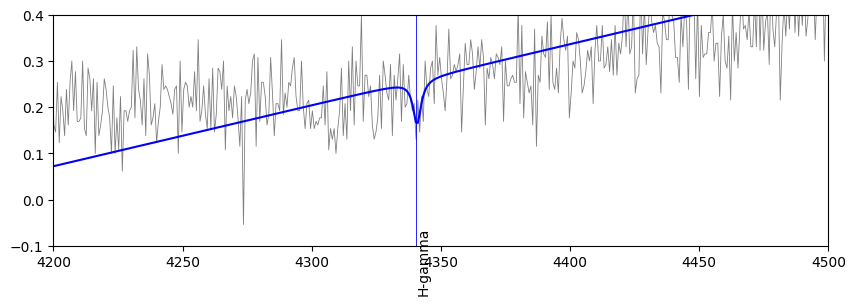

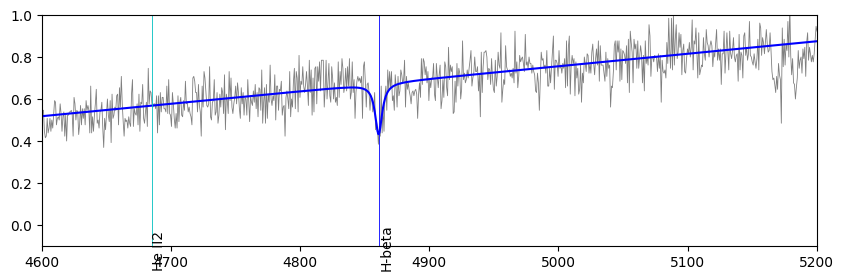

In [ ]:
# plot_pix(spectrum2_oct)
oct2_heps = fit_lorentzian_lin(spectrum2_oct, x, 1300, 1400, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct2_hdelta = fit_lorentzian_lin(spectrum2_oct, x, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct2_hgamma = fit_lorentzian_lin(spectrum2_oct, x, 1820, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
# oct2_hbeta = fit_lorentzian_quad(spectrum2_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct2_hbeta[0], '+-', oct2_hbeta[1])
oct2_hbeta = fit_lorentzian_lin(spectrum2_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct2_hbeta[0], '+-', oct2_hbeta[1])

In [ ]:
print('H-epsilon:', oct2_heps[0], '+-', oct2_heps[1])
# print('H-delta:', oct2_hdelta[0], '+-', oct2_hdelta[1])
print('H-gamma:', oct2_hgamma[0], '+-', oct2_hgamma[1])
print('H-beta:', oct2_hbeta[0], '+-', oct2_hbeta[1])

popt_oct2, covar_oct2 = opt.curve_fit(const, np.linspace(0, 2, 3), [oct2_heps[0], oct2_hgamma[0], oct2_hbeta[0]], sigma = [oct2_heps[1], oct2_hgamma[1], oct2_hbeta[1]])
print(popt_oct2, '+-', np.sqrt(covar_oct2[0]))

H-epsilon: -1.5397618794282184 +- 89.92110232930511
H-gamma: 21.778359309036002 +- 57.19776640286122
H-beta: -32.75843649491578 +- 33.861789841444896
[-16.98330177] +- [16.4665549]


In [ ]:
# print(green03_2_pixel, green23_2_pixel)

In [ ]:
BD03_green_pix = green03_2_pixel
BD03_green_wave = green03_2_wave

BD23_green_pix = green23_2_pixel
BD23_green_wave = green23_2_wave

pix23 = [BD23_hdelta_pix, BD23_hgamma_pix, BD23_HeII2_pix, BD23_hbeta_pix, BD23_HeII_pix, BD23_green_pix]
wave23 = [BD23_hdelta_wave, BD23_hgamma_wave, BD23_HeII2_wave, BD23_hbeta_wave, BD23_HeII_wave, BD23_green_wave]

pix03 = [BD03_hdelta_pix, BD03_hgamma_pix, BD03_HeII2_pix, BD03_hbeta_pix, BD03_HeII_pix, BD03_green_pix]
wave03 = [BD03_hdelta_wave, BD03_hgamma_wave, BD03_HeII2_wave, BD03_hbeta_wave, BD03_HeII_wave, BD03_green_wave]

# Calculate the difference between the wavelengths of the calibration star absorption lines
# on aug23 vs oct3, each after having been calibrated using their respective days' arcs
diff_wave2303 = np.array(wave23) - np.array(wave03)

Text(0.5, 1.0, 'Difference of absorption line wavelengths (23/03) vs pixel')

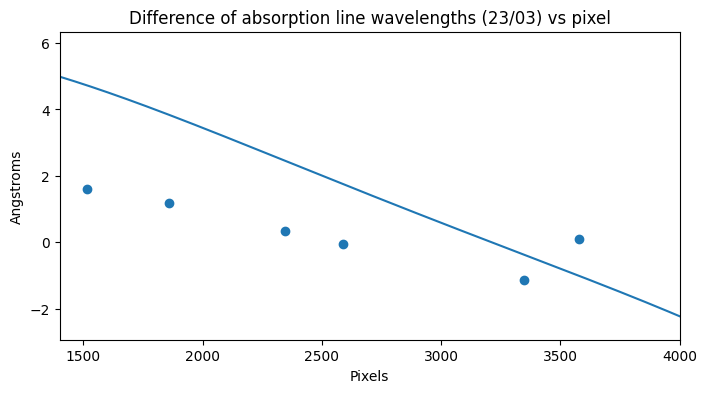

In [ ]:
plt.figure(figsize = (8, 4))
plt.scatter(pix23, diff_wave2303)
plt.plot(xpix23, delta_lambda2303)
# plt.scatter(pix23, diff_wave2303)
# plt.plot(xpix23, delta_lambda2303)
plt.xlim(1400, 4000)
plt.ylabel('Angstroms')
plt.xlabel('Pixels')
plt.title('Difference of absorption line wavelengths (23/03) vs pixel')

# Oct GC 3

In [ ]:
zap_3_oct03 = min_zapping(octdir, '03', ['b.0252', 'b.0253'], yearmonth = 2310)
# plot_limits_size(zap_3_oct03, min = 0, max = 50, ytop = 595, ybottom = 615)

In [ ]:
spectrum3_oct = grab_spectrum(np.flip(zap_3_oct03, 1), 602, 610)
spectrum3_oct = spectrum3_oct / spectrum3_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum3_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum3_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(xmin = 3500, xmax = 6000)
# plt.xlim(3500, 6000)

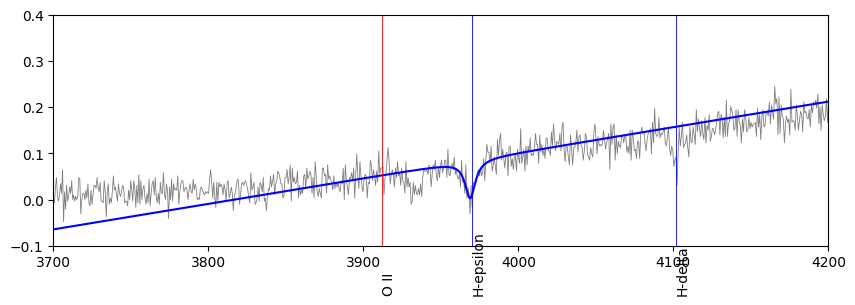

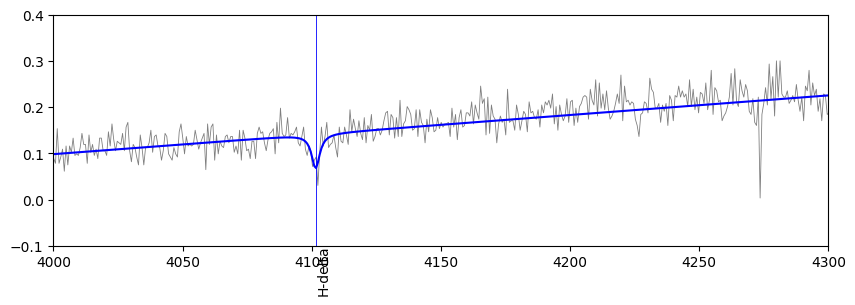

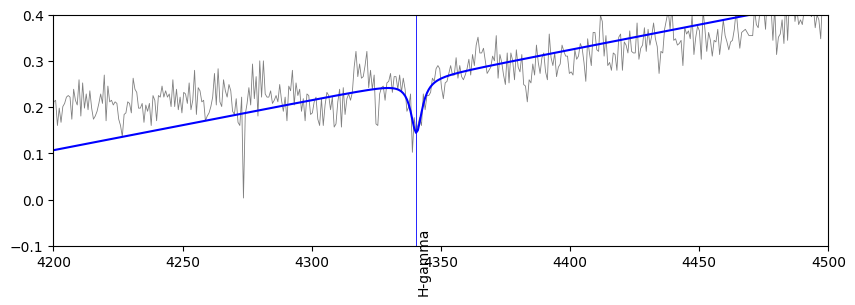

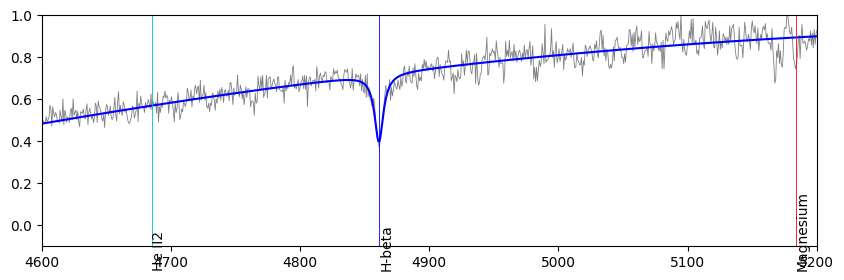

In [ ]:
# plot_pix(spectrum3_oct)
oct3_heps = fit_lorentzian_lin(spectrum3_oct, x, 1300, 1400, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct3_hdelta = fit_lorentzian_lin(spectrum3_oct, x, 1480, 1540, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct3_hgamma = fit_lorentzian_lin(spectrum3_oct, x, 1840, 1880, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = True)
oct3_hbeta = fit_lorentzian_quad(spectrum3_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct3_hbeta[0], '+-', oct3_hbeta[1])
# oct3_hbeta = fit_lorentzian_lin(spectrum3_oct, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct3_hbeta[0], '+-', oct3_hbeta[1])

In [ ]:
print('H-epsilon:', oct3_heps[0], '+-', oct3_heps[1])
print('H-delta:', oct3_hdelta[0], '+-', oct3_hdelta[1])
print('H-gamma:', oct3_hgamma[0], '+-', oct3_hgamma[1])
print('H-beta:', oct3_hbeta[0], '+-', oct3_hbeta[1])

popt_oct3, covar_oct3 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct3_heps[0], oct3_hdelta[0], oct3_hgamma[0], oct3_hbeta[0]], sigma = [oct3_heps[1], oct3_hdelta[1], oct3_hgamma[1], oct3_hbeta[1]])
print(popt_oct3, '+-', np.sqrt(covar_oct3[0]))

H-epsilon: -85.16475355985703 +- 39.006138848403666
H-delta: -14.044604098345097 +- 32.199699811049456
H-gamma: 4.1687148125348505 +- 26.831288995378653
H-beta: -18.206170002267534 +- 16.10554003387344
[-19.50464449] +- [13.30678699]


# Oct GC 4

In [ ]:
zap_4_oct03 = min_zapping(octdir, '03', ['b.0256', 'b.0257', 'b.0258'], yearmonth = 2310)
# plot_limits_size(zap_4_oct03, min = 0, max = 50, ytop = 595, ybottom = 615)

In [ ]:
spectrum4_oct = grab_spectrum(np.flip(zap_4_oct03, 1), 601, 608)
spectrum4_oct = spectrum4_oct / spectrum4_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum4_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum4_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# plt.xlim(3500, 6000)

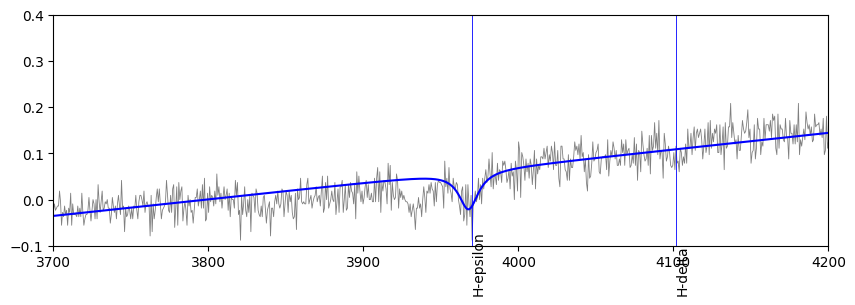

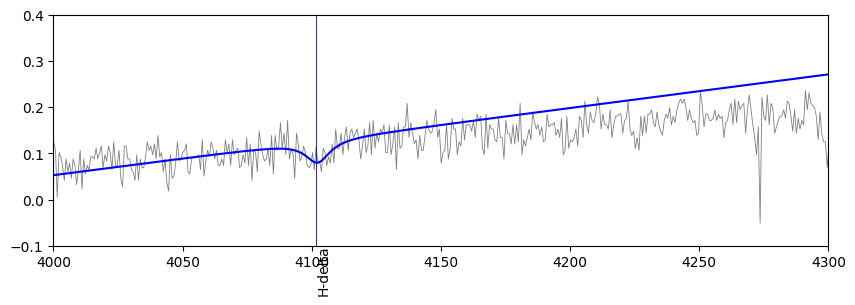

In [ ]:
# plot_pix(spectrum4_oct)
oct4_heps = fit_lorentzian_lin(spectrum4_oct, x, 1300, 1450, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct4_hdelta = fit_lorentzian_lin(spectrum4_oct, x, 1490, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct4_hgamma = fit_lorentzian_lin(spectrum4_oct, x, 1840, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = False)
# oct4_hbeta = fit_lorentzian_quad(spectrum4_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct4_hbeta[0], '+-', oct4_hbeta[1])
oct4_hbeta = fit_lorentzian_lin(spectrum4_oct, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = False)
# print(oct4_hbeta[0], '+-', oct4_hbeta[1])

In [ ]:
print('H-epsilon:', oct4_heps[0], '+-', oct4_heps[1])
print('H-delta:', oct4_hdelta[0], '+-', oct4_hdelta[1])
print('H-gamma:', oct4_hgamma[0], '+-', oct4_hgamma[1])
print('H-beta:', oct4_hbeta[0], '+-', oct4_hbeta[1])

popt_oct4, covar_oct4 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct4_heps[0], oct4_hdelta[0], oct4_hgamma[0], oct4_hbeta[0]], sigma = [oct4_heps[1], oct4_hdelta[1], oct4_hgamma[1], oct4_hbeta[1]])
print(popt_oct4, '+-', np.sqrt(covar_oct4[0]))

H-epsilon: -163.37560606408812 +- 68.95570749671725
H-delta: 41.02365459587181 +- 103.246765072035
H-gamma: -27.810548073224755 +- 41.701303146696475
H-beta: -38.08639689840988 +- 28.57497453101395
[-44.27464995] +- [24.75746136]


# Oct GC 5

In [ ]:
zap_5_oct03 = min_zapping(octdir, '03', ['b.0261', 'b.0262', 'b.0263'], yearmonth = 2310)
# plot_limits_size(zap_5_oct03, min = 5, max = 50, ytop = 595, ybottom = 615)

In [ ]:
spectrum5_oct = grab_spectrum(np.flip(zap_5_oct03, 1), 600, 607)
spectrum5_oct = spectrum5_oct / spectrum5_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum5_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum5_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines(3800, 5500)
# plt.xlim(3800, 5500)

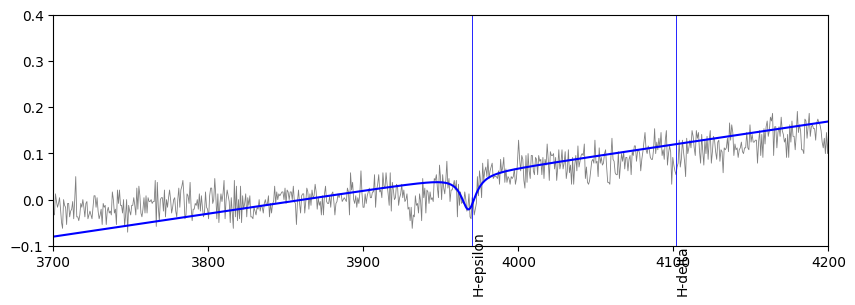

In [ ]:
# plot_pix(spectrum5_oct)
oct5_heps = fit_lorentzian_lin(spectrum5_oct, x, 1300, 1420, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct5_hdelta = fit_lorentzian_lin(spectrum5_oct, x, 1490, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = False)
oct5_hgamma = fit_lorentzian_lin(spectrum5_oct, x, 1840, 1890, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = False)
# oct5_hbeta = fit_lorentzian_quad(spectrum5_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct5_hbeta[0], '+-', oct5_hbeta[1])
oct5_hbeta = fit_lorentzian_lin(spectrum5_oct, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = False)
# print(oct5_hbeta[0], '+-', oct5_hbeta[1])

In [ ]:
print('H-epsilon:', oct5_heps[0], '+-', oct5_heps[1])
print('H-delta:', oct5_hdelta[0], '+-', oct5_hdelta[1])
print('H-gamma:', oct5_hgamma[0], '+-', oct5_hgamma[1])
print('H-beta:', oct5_hbeta[0], '+-', oct5_hbeta[1])

popt_oct5, covar_oct5 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct5_heps[0], oct5_hdelta[0], oct5_hgamma[0], oct5_hbeta[0]], sigma = [oct5_heps[1], oct5_hdelta[1], oct5_hgamma[1], oct5_hbeta[1]])
print(popt_oct5, '+-', np.sqrt(covar_oct5[0]))

H-epsilon: -164.08711872817003 +- 53.81615949610007
H-delta: -45.329674143258316 +- 48.65002146723412
H-gamma: -18.0204197026177 +- 32.1502093635271
H-beta: -46.426848458130436 +- 20.82689935384378
[-49.56504616] +- [21.34220191]


# Oct GC 6

In [ ]:
zap_6_oct03 = min_zapping(octdir, '03', ['b.0228', 'b.0229'], yearmonth = 2310)
# plot_limits_size(zap_6_oct03, min = 10, max = 40, ytop = 595, ybottom = 615)

In [ ]:
spectrum6_oct = grab_spectrum(np.flip(zap_6_oct03, 1), 599, 609)
spectrum6_oct = spectrum6_oct / spectrum6_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum6_oct, poly4_params_oct03[0], poly4_params_oct03[1], poly4_params_oct03[2], poly4_params_oct03[3], poly4_params_oct03[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum6_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# plt.xlim(3500, 6000)

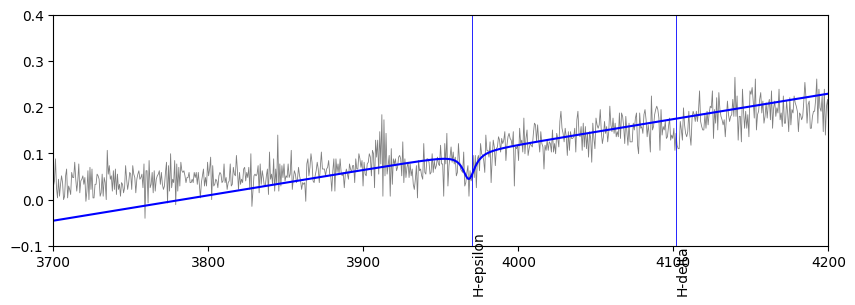

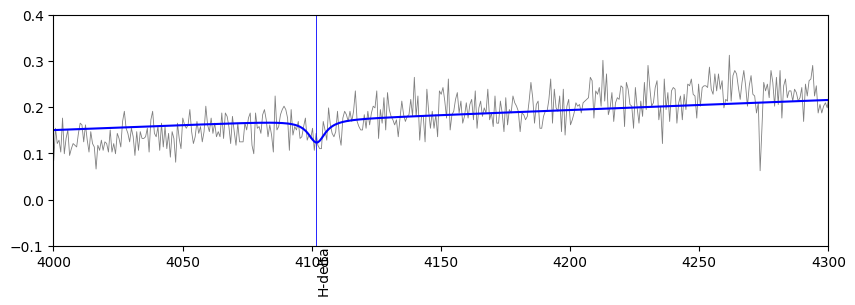

In [ ]:
# plot_pix(spectrum_oct)
oct6_heps = fit_lorentzian_lin(spectrum6_oct, x, 1300, 1420, poly4_params_oct03, h_epsilon, xmin = 3700, xmax = 4200, ymax = 0.4, plot = True)
oct6_hdelta = fit_lorentzian_lin(spectrum6_oct, x, 1490, 1550, poly4_params_oct03, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
oct6_hgamma = fit_lorentzian_lin(spectrum6_oct, x, 1840, 1920, poly4_params_oct03, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.5, plot = False)
oct6_hbeta = fit_lorentzian_quad(spectrum6_oct, x, 2400, 2800, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = False)
# print(oct6_hbeta[0], '+-', oct6_hbeta[1])
# oct6_hbeta = fit_lorentzian_lin(spectrum6_oct, x, 2550, 2650, poly4_params_oct03, h_beta, xmin = 4600, xmax = 5200, ymax = 1, plot = True)
# print(oct6_hbeta[0], '+-', oct6_hbeta[1])

In [ ]:
print('H-epsilon:', oct6_heps[0], '+-', oct6_heps[1])
print('H-delta:', oct6_hdelta[0], '+-', oct6_hdelta[1])
print('H-gamma:', oct6_hgamma[0], '+-', oct6_hgamma[1])
print('H-beta:', oct6_hbeta[0], '+-', oct6_hbeta[1])

popt_oct6, covar_oct6 = opt.curve_fit(const, np.linspace(0, 3, 4), [oct6_heps[0], oct6_hdelta[0], oct6_hgamma[0], oct6_hbeta[0]], sigma = [oct6_heps[1], oct6_hdelta[1], oct6_hgamma[1], oct6_hbeta[1]])
print(popt_oct6, '+-', np.sqrt(covar_oct6[0]))

H-epsilon: -148.4473640188474 +- 75.18723775072736
H-delta: 15.894559287994364 +- 77.5767353561902
H-gamma: 31.677539553407325 +- 40.09471315706372
H-beta: -6.744256671868389 +- 22.705792731592634
[-5.85065584] +- [22.85796602]


# Oct GC 7

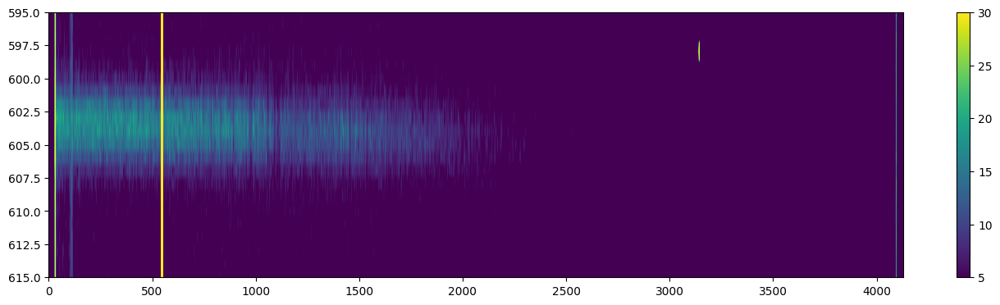

In [ ]:
zap_7_oct03 = min_zapping(octdir, '06', ['b.0540', 'b.0541'], yearmonth = 2310)
plot_limits_size(zap_7_oct03, min = 5, max = 30, ytop = 595, ybottom = 615)

In [ ]:
spectrum7_oct = grab_spectrum(np.flip(zap_7_oct03, 1), 600, 607)
spectrum7_oct = spectrum7_oct / spectrum7_oct[700:3000].max()
x = calibrate_wavelength_4th_order(spectrum7_oct, poly4_params_oct06[0], poly4_params_oct06[1], poly4_params_oct06[2], poly4_params_oct06[3], poly4_params_oct06[4])
# plt.figure(figsize = (14, 4))
# plt.plot(x, spectrum7_oct, linewidth = 0.5, color = 'k')
# plt.ylim(-0.2, 1.2)
# plt.xlabel('Wavelength (Angstroms)')
# lines()
# plt.xlim(3500, 6000)

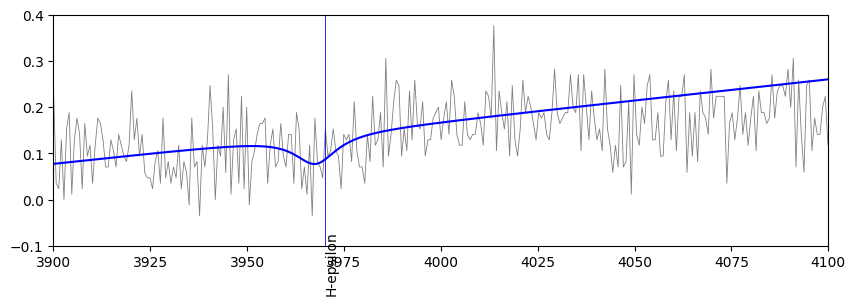

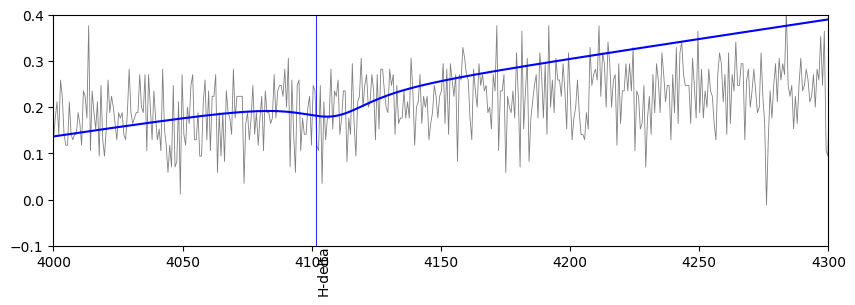

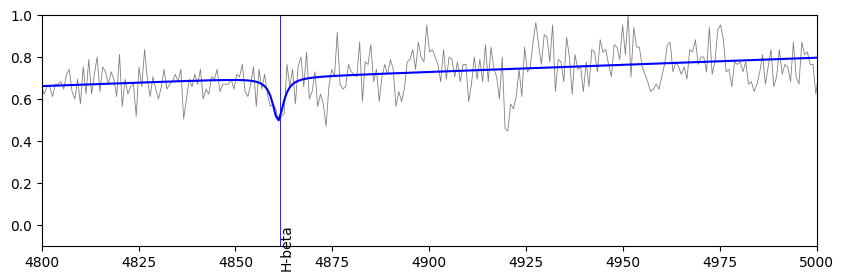

In [ ]:
# plot_pix(spectrum7_oct, xmin = 2000, xmax = 3000)
oct7_heps = fit_lorentzian_lin(spectrum7_oct, x, 1280, 1380, poly4_params_oct06, h_epsilon, xmin = 3900, xmax = 4100, ymax = 0.4, plot = True)
# print(aug2_heps[0], '+-', aug2_heps[1])
oct7_hdelta = fit_lorentzian_lin(spectrum7_oct, x, 1480, 1540, poly4_params_oct06, h_delta, xmin = 4000, xmax = 4300, ymax = 0.4, plot = True)
# print(aug2_hdelta[0], '+-', aug2_hdelta[1])
# oct7_hgamma = fit_lorentzian_lin(spectrum7_oct, x, 1840, 1880, poly4_params_oct06, h_gamma, xmin = 4200, xmax = 4500, ymax = 0.4, plot = False)
# # print(aug2_hgamma[0], '+-', aug2_hgamma[1])
# oct7_hbeta = fit_lorentzian_quad(spectrum7_oct, x, 2400, 2800, poly4_params_oct06, h_beta, xmin = 4800, xmax = 5000, ymax = 1, plot = False)
# print(oct7_hbeta[0], '+-', oct7_hbeta[1])
oct7_hbeta = fit_lorentzian_lin(spectrum7_oct, x, 2500, 2700, poly4_params_oct06, h_beta, xmin = 4800, xmax = 5000, ymax = 1, plot = True)
# print(oct7_hbeta[0], '+-', oct7_hbeta[1])

In [ ]:
print('H-epsilon:', oct7_heps[0], '+-', oct7_heps[1])
print('H-delta:', oct7_hdelta[0], '+-', oct7_hdelta[1])
# print('H-gamma:', oct7_hgamma[0], '+-', oct7_hgamma[1])
print('H-beta:', oct7_hbeta[0], '+-', oct7_hbeta[1])

# popt_oct7, covar_oct7 = opt.curve_fit(const, np.linspace(0, 1, 2), [oct7_heps[0], oct7_hbeta[0]], sigma = [oct7_heps[1], oct7_hbeta[1]])
# print(popt_oct7, '+-', np.sqrt(covar_oct7[0]))

H-epsilon: -180.88851358935727 +- 188.72499359447752
H-delta: 521.4428708716355 +- 4124.991303983393
H-beta: -22.885256835863487 +- 32.890189576835674


# Green Checks

In [ ]:
green_params06_7, green_covar06_7 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum7_oct[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green06_7_pixel = green_params06_7[2]
green_params06_7, green_covar06_7 = opt.curve_fit(Lorentzian_lin, np.arange(5560, 5590), spectrum7_oct[3560: 3590], p0 = [0, 2, 5577, 0, 1])
green06_7_wave = green_params06_7[2]
# print(green_params06_7, np.sqrt(green_covar06_7[2][2]))
print(calc_velo(green06_7_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar06_7[2][2]), O_I))

82.8471576073278 +- 7.757634632136748


(5500.0, 5700.0)

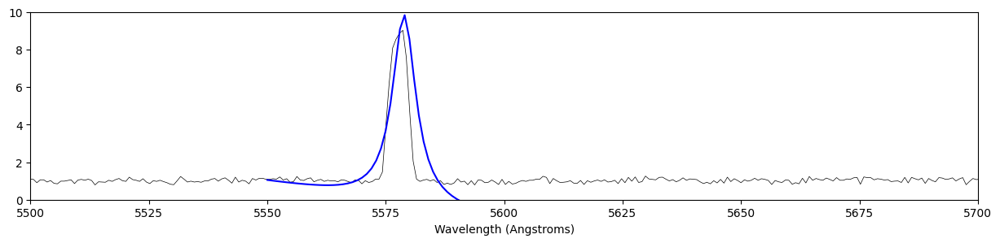

In [ ]:
plt.figure(figsize = (15, 3))
plt.plot(x, spectrum7_oct, linewidth = 0.5, color = 'k')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_7[0], green_params06_7[1], green_params06_7[2], green_params06_7[3], green_params06_7[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(0, 10)
plt.xlim(5500, 5700)

In [ ]:
green_params23_1, green_covar23_1 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), spectrum1[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_1_pixel = green_params23_1[2]
green_params23_1, green_covar23_1 = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), spectrum1[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green23_1_wave = green_params23_1[2]
# print(green_params23_1, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green23_1_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_1[2][2]), O_I))

-29.72646887718015 +- 10.136413620696375


In [ ]:
green_params23_BD, green_covar23_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_23_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params23_2, np.sqrt(green_covar23_2[2][2]))
green23_BD_pixel = green_params23_BD[2]
green_params23_BD, green_covar23_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_23_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green23_BD_wave = green_params23_BD[2]
# print(green_params23_1, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green23_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar23_BD[2][2]), O_I))

-46.2084521146796 +- 17.886604413898667


In [ ]:
green_params03_BD, green_covar03_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_03_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
green03_BD_pixel = green_params03_BD[2]
green_params03_BD, green_covar03_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_03_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green03_BD_wave = green_params03_BD[2]
# print(green_params03_BD, np.sqrt(green_covar03_BD[2][2]))
print(calc_velo(green03_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar03_BD[2][2]), O_I))

71.94102075362659 +- 18.263500521314516


In [ ]:
green_params27_BD, green_covar27_BD = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), BD28_27_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
green27_BD_pixel = green_params27_BD[2]
green_params27_BD, green_covar27_BD = opt.curve_fit(Lorentzian_lin, np.arange(5565, 5585), BD28_27_spectrum[3565: 3585], p0 = [0, 2, 5575, 0, 1])
green27_BD_wave = green_params27_BD[2]
# print(green_params27_BD, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green27_BD_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar27_BD[2][2]), O_I))

17.786555462067433 +- 13.927981273822374


In [ ]:
# green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(3550, 3600), G191_06_spectrum[3550: 3600], p0 = [0, 2, 3575, 0, 1])
# print(green_params27_BD, np.sqrt(green_covar27_BD[2][2]))
# green06_G191_pixel = green_params06_G191[2]
# green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(5560, 5590), G191_06_spectrum[3560: 3590], p0 = [0, 2, 5577, 0, 1])
green_params06_G191, green_covar06_G191 = opt.curve_fit(Lorentzian_lin, np.arange(5572, 5585), G191_06_spectrum[3572: 3585], p0 = [0, 2, 5577, 0, 1])
green06_G191_wave = green_params06_G191[2]
# print(green_params27_BD, np.sqrt(green_covar23_1[2][2]))
print(calc_velo(green06_G191_wave, O_I), '+-', calc_velo_err_lmfit(np.sqrt(green_covar06_G191[2][2]), O_I))

101.7321024200906 +- 17.996566890856915


(5500.0, 5700.0)

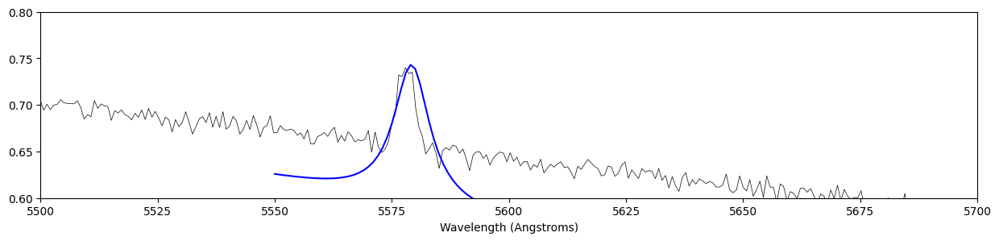

In [ ]:
plt.figure(figsize = (15, 3))
plt.plot(x, G191_06_spectrum, linewidth = 0.5, color = 'k')
plt.plot(np.arange(5550, 5600), Lorentzian_lin(np.arange(5550, 5600), green_params06_G191[0], green_params06_G191[1], green_params06_G191[2], green_params06_G191[3], green_params06_G191[4]), color = 'b')
plt.xlabel('Wavelength (Angstroms)')
plt.ylim(0.6, 0.8)
plt.xlim(5500, 5700)